In [1]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import json
from collections import defaultdict
# import plotly.graph_objects as go
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import nltk
from nltk.corpus import wordnet 
nltk.download('stopwords')
from nltk.corpus import stopwords
# import spacy

import time
import string


# from sklearn.

# MODELS
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.inspection import permutation_importance

# EVALUATION METRICS and TOOLS
from sklearn.metrics import balanced_accuracy_score, classification_report, f1_score, precision_score, recall_score


# OTHER TOOLS
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import  HalvingGridSearchCV, RepeatedStratifiedKFold, cross_val_score, train_test_split

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler


# Utilities
from utils import main as utils, plots, preprocessing

# To save resutls locally
import pickle

# Needed to retrieve the top feautures after classification.
import spacy
# Load the spaCy model
nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])

nlp.Defaults.stop_words -= set(preprocessing.POSSIBLY_NEEDED_STOPWORDS)




[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\alhas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Needed variables

In [2]:
MODELS = ['LR', 'SVM', 'RF']
ITERATIONS = 1

In [3]:

with open("data/id_to_label.json", "r") as f:
    # Write the dictionary to the file in JSON format
    id_to_label = json.load(f)

Terms that should never be excluded

In [4]:
exeptional_terms = set()
for w in ['group', 'team', 'crew', 'together', 'coordinate', 'cooperate', 'game', 'community', 'they', 'we', 
          'alone', 'individual', 'independent', 'she', 'he',
         'man', 'woman', 'boy', 'girl', 'male', 'female',
         'young', 'old', 'adult', 'adolescent'] + preprocessing.POSSIBLY_NEEDED_STOPWORDS:
    exeptional_terms.update(sum(wordnet.synonyms(w), []) + [w])

# Needed Functions

In [5]:
def get_related_words(words):
    """
    Get a set of related words for a given list of words using WordNet.

    Args:
        words (list): A list of words.

    Returns:
        set: A set of related words.

    """
    related_words = set(words)

    for word in words:
        # Iterate over the synsets of the word
        for sset in wordnet.synsets(word):
            
            # Add hypernyms (superordinate terms)
            for hypernym in sset.hypernyms():
                [related_words.add(n) for n in hypernym.lemma_names()]
        
            # Add hyponyms (subordinate terms)
            for hyponym in sset.hyponyms():
                [related_words.add(n) for n in hyponym.lemma_names()]

    return related_words


In [6]:
def train_model(model,
                X_train, y_train,
                X_test, y_test, 
                **kwargs,
               ):
    """
    Train a specified model using the given training data and evaluate it on the test data.

    Args:
        model (str): Name of the model to train.
        X_train (array-like): Training features.
        y_train (array-like): Training labels.
        X_test (array-like): Test features.
        y_test (array-like): Test labels.
        **kwargs: Additional keyword arguments.

    Keyword Args:
        verbose (bool): Flag indicating whether to print verbose output.
        exclude (list): List of features to exclude.
        stopwords (list): List of stopwords for tokenization.

    Returns:
        object: Trained classifier.
        array-like: Predicted labels on the test data.
        float: Accuracy score on the test data.
        array-like: Transformed training features.
        array-like: Transformed test features.
        list: Feature names.
    """
        
    if model == 'RF':
        clf = RandomForestClassifier(n_estimators=100)
    elif model == 'LR':
        clf = LogisticRegression(max_iter=10000)
    elif model == 'SVM':
        clf = svm.LinearSVC(C=1.0)
    elif model == 'KN':
        clf = make_pipeline(StandardScaler(with_mean=False),
             KNeighborsClassifier(n_neighbors=16))

    if kwargs.get('verbose'):
        print("#"*10, f"Training {clf.__class__.__name__}\n")

    
    vectorizer = TfidfVectorizer(
        sublinear_tf=True, 
        max_df=0.5, 
        min_df=5, 
        tokenizer=lambda doc: preprocessing.tokenize_data(doc, exclude=kwargs.get('exclude'), stopwords=kwargs.get('stopwords')),
    )
                    
    
    X_train_trasformed = vectorizer.fit_transform(X_train)

    clf.fit(X_train_trasformed, y_train)
    
    X_test_transformed = vectorizer.transform(X_test)
    
    score = clf.score(X_test_transformed, y_test)
    pred = clf.predict(X_test_transformed)
    
    
    feature_names = vectorizer.get_feature_names_out()
                 
    if kwargs.get('verbose'):
        print("#"*10, score)
    
    
    return clf, pred, score, X_train_trasformed, X_test_transformed, feature_names

In [7]:

def run(models=['LR', 'RF', 'SVM', 'KN'], **kwargs):
    """
    Run the models and generate predictions.

    Args:
        models (list): List of models to train and evaluate.
        **kwargs: Additional keyword arguments.

    Keyword Args:
        exact (bool): Flag indicating whether to perform exact matching for features.
        specific_cat (bool): Flag indicating whether to perform feature matching for specific categories.
        iteration (int): Iteration number.
        id (str): Identifier.
        df_performance (DataFrame): DataFrame to store performance metrics.
        cat: Category.

    Returns:
        DataFrame: DataFrame containing the predictions and other information.
        defaultdict: Dictionary of top indicators for each model.
        defaultdict: Dictionary of performance reports for each model.
    """
    exact = kwargs.get('exact') and kwargs.get('specific_cat')
    iteration = kwargs.get('iteration')
    id = kwargs.get('id')
    df_performance = kwargs.get('df_performance')
    kwargs['exact'] = exact

    df, X_train, X_test, y_train, y_test, target_names = utils.load_dataset('data/en_data.csv',
                                                                           target_label='ocms',
                                                                           **kwargs)

    dfs = []

    df_out = df.loc[y_test.index]
    reports = defaultdict(list)
    top_indicators = defaultdict(list)
    cms = []

    for model in models:
        print('#'*10, kwargs.get('cat'), model, '\n')

        clf, pred, score, X_train_transformed, X_test_transformed, feature_names = train_model(model,
                                                                                               X_train, y_train,
                                                                                               X_test, y_test,
                                                                                               **kwargs)

        y_pred = pd.DataFrame(pred)

        df_out[f'predicted_{model}'] = pred

        # Calculating macro averages.
        macro_precision = precision_score(y_test, pred, average='macro')
        macro_recall = recall_score(y_test, pred, average='macro')
        macro_f1 = f1_score(y_test, pred, average='macro')
        reports[model] = [macro_precision, macro_recall, macro_f1]

        df_performance.loc[f'{iteration}_{id}_{model}'] = reports[model]

        if kwargs.get('verbose'):
            report = classification_report(y_test, pred, digits=3)
            print(report)

        cms.append([clf, pred, y_test])

        culture_plot = plots.plot_per_culture(df_out, model, top_k=10)

        if model == 'RF':
            indicators = plots.plot_feature_importance(clf.feature_importances_, feature_names, 'RF')
        else:
            if clf.coef_.shape[0] > 1:
                indicators = plots.plot_feature_effects_detailed(clf, X_train_transformed, feature_names,
                                                                  target_names, to_labels=id_to_label)
            else:
                indicators = plots.plot_feature_effects(clf, X_train_transformed, feature_names, target_names,
                                                        to_labels=id_to_label, iteration=iteration)

        top_indicators[model] = indicators

    if len(models) > 1:
        cm = plots.make_cms(cms, target_names, to_labels=id_to_label, iteration=iteration)

    return df_out, top_indicators, reports

In [8]:
def get_common_indicators(top_indicators):
    """
    Get the common indicators from the top indicators across iterations.

    Args:
        top_indicators (defaultdict): Dictionary of top indicators from each iteration.

    Returns:
        list: List of common indicators in the order they appear.
    """
    # Get the list of arrays from the top_indicators values
    arrays = list(top_indicators.values())

    # Get the intersection of all arrays
    shared_elements = set(arrays[0]).intersection(*arrays)

    # Create a list to preserve the order of shared elements
    shared_elements_ordered = [x for x in arrays[0] if x in shared_elements]
    return shared_elements_ordered
    

In [15]:
def retrieve_rows_with_features(df, features, models):
    """
    Retrieve rows from a DataFrame that contain specified features.

    Args:
        df (DataFrame): DataFrame to retrieve rows from.
        features (set): Set of features to search for in the DataFrame.
        models (list): List of models to retrieve predictions from.

    Returns:
        DataFrame: DataFrame containing the retrieved rows with features and predictions.
    """
    result_rows = []

    # Iterate over each row in the DataFrame
    for index, row in df.iterrows():
        text = row['textrecord']
        ocms = row['ocms']
        
        doc = nlp(text)
        lemmatized_text = [token.lemma_ for token in doc]

        found_features = []
        feature_dict = {}
        # Check if any of the specified features are present in the lemmatized text
        for feature in features:
            if feature in lemmatized_text:                
                found_features.append(feature)

        result_rows.append({
            'textrecord': text,
            'features': found_features,
            'culture': row['culture'],
            'sreid': row['sreid'],
            **feature_dict,
            'ocms': ocms,
            **{f'predicted_{model}': row[f'predicted_{model}'] for model in models},
            'place': row['place'],

            })

    # Create a new DataFrame from the collected rows
    result_df = pd.DataFrame(result_rows)
    return result_df


In [16]:
def save_results(results, file_path):
    """
    Save the results to a file using pickle serialization.

    Args:
        results (object): Results to be saved.
        file_path (str): File path to save the results.
    """
    with open(file_path, 'wb') as f:
        pickle.dump(results, f)


def read_results(file_path):
    """
    Read the results from a file using pickle deserialization.

    Args:
        file_path (str): File path to read the results from.

    Returns:
        object: Results read from the file.
    """
    with open(file_path, 'rb') as f:
        results = pickle.load(f)
    return results


In [17]:
def iterative_process(iterations=ITERATIONS, common_indicators=True, **kwargs):
    """
    Perform an iterative process for a specified number of iterations.

    Args:
        iterations (int): Number of iterations to perform.
        common_indicators (bool): Flag indicating whether to consider common indicators across iterations.
        **kwargs: Additional keyword arguments.

    Keyword Args:
        results (defaultdict): Dictionary to store the results (optional).
        top_indicators (set): Set of top indicators from previous iterations (optional).
        models (list): List of models to train and evaluate.
        exeptional_terms (set): Set of exceptional terms to exclude from the top indicators.

    Returns:
        dict: Results of the iterative process, including the DataFrame, top indicators, and reports for each iteration.
    """
    results = kwargs.get('results', defaultdict(dict))
    top_indicators = kwargs.get('top_indicators', set())

    reports = defaultdict(list)
    for i in range(iterations):
        print(f"Iteration {i+1}\nExclude: {top_indicators}\n")

        df, curr_indicators, report = run(exclude=top_indicators, iteration=i, **kwargs)

        arrays = list(curr_indicators.values())

        ci = set(arrays[0]).intersection(*arrays)
        if common_indicators:
            top_indicators.update(ci)
        else:
            top_indicators.update(set(arrays[0]).union(*arrays))

        if top_indicators.intersection(exeptional_terms):
            print(top_indicators.intersection(exeptional_terms))
            top_indicators = top_indicators.difference(exeptional_terms)

        results[i]['df'] = df
        results[i]['indicators'] = top_indicators
        results[i]['common_indicators'] = ci
        reports[i].append(report)
        results[i]['reports'] = report

    return results


In [18]:
def plot_performance(results, fig_path='', models=MODELS):
    """
    Plot the performance metrics (precision, recall, and F1-score) for each model on different iterations.

    Args:
        results (dict): Dictionary containing the performance results for each iteration and model.
        fig_path (str): Path to save the generated figure (optional).
        models (list): List of model names to plot (optional).

    Returns:
        None
    """
    fig = make_subplots(rows=1, cols=3, subplot_titles=("Precision", "Recall", "F1-score"), x_title='Iteration',
                        horizontal_spacing=0.01)

    iterations = [i for i in range(1, ITERATIONS+1)]
    performance = defaultdict(list)

    min_score = 1
    max_score = 0

    # colors = px.colors.qualitative.Plotly[:len(models)]  # Get distinct colors
    colors = ['blue', 'red', 'orange'] # because I'm color blind, i need distinguishable colors.

    for i, m in enumerate(models):
        for j in range(ITERATIONS):
            performance[m].append(results[j]['reports'][m])

        min_score = min([min_score, min([p for p, _, _ in performance[m]]), min([f for _, _, f in performance[m]]), min([r for _, r, _ in performance[m]])])
        max_score = max([max_score, max([p for p, _, _ in performance[m]]), max([f for _, _, f in performance[m]]), max([r for _, r, _ in performance[m]])])

        fig.add_trace(go.Scatter(x=iterations, y=[p for p, _, _ in performance[m]], mode='lines+markers', name=m,
                                 line=dict(color=colors[i])), row=1, col=1)
        fig.add_trace(go.Scatter(x=iterations, y=[r for _, r, _ in performance[m]], mode='lines+markers', name=m,
                                 line=dict(color=colors[i])), row=1, col=2)
        fig.add_trace(go.Scatter(x=iterations, y=[f for _, _, f in performance[m]], mode='lines+markers', name=m,
                                 line=dict(color=colors[i])), row=1, col=3)

    fig.update_layout(height=500,
                      width=1200,
                      title_x=0.5,
                      yaxis_title='Score',
                      showlegend=True,  # Show a single legend
                      legend=dict(x=1.03, y=1, traceorder='normal', font=dict(size=12))
                     )  # Position and style the legend

    fig.update_xaxes(tickmode='linear',
                     tickvals=iterations,
                     showgrid=True, ticklen=1)
    fig.update_yaxes(range=[min_score - 0.02, max_score + 0.03], automargin=True)
    fig.update_yaxes(showticklabels=False, row=1, col=2)
    fig.update_yaxes(side='right', row=1, col=3)

    for i in range(1, 3):
        fig.update_traces(showlegend=False, row=1, col=i)

    fig.show()
    fig.write_image(fig_path)


In [19]:
df_performance = pd.DataFrame([], columns=['precision', 'recall', 'f1-score'])

# Specific categories

### 224 and 226

for b in [True, False]:
    print('Balanced:', b)
    results = iterative_process(models=['LR', 'SVM', 'RF'], 
                                common_indicators=False,
                                chosen_categories=[224, 226],
                                # chosen_categories=[222, 220],
                                balanced=b,
                                verbose=True)

Iteration 1
Exclude: set()

5750 documents - 2.57MB (training set)
2 categories
########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\test\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


########## 0.9350724637681159
              precision    recall  f1-score   support

         224      0.913     0.990     0.950      1066
         226      0.981     0.847     0.909       659

    accuracy                          0.935      1725
   macro avg      0.947     0.918     0.929      1725
weighted avg      0.939     0.935     0.934      1725



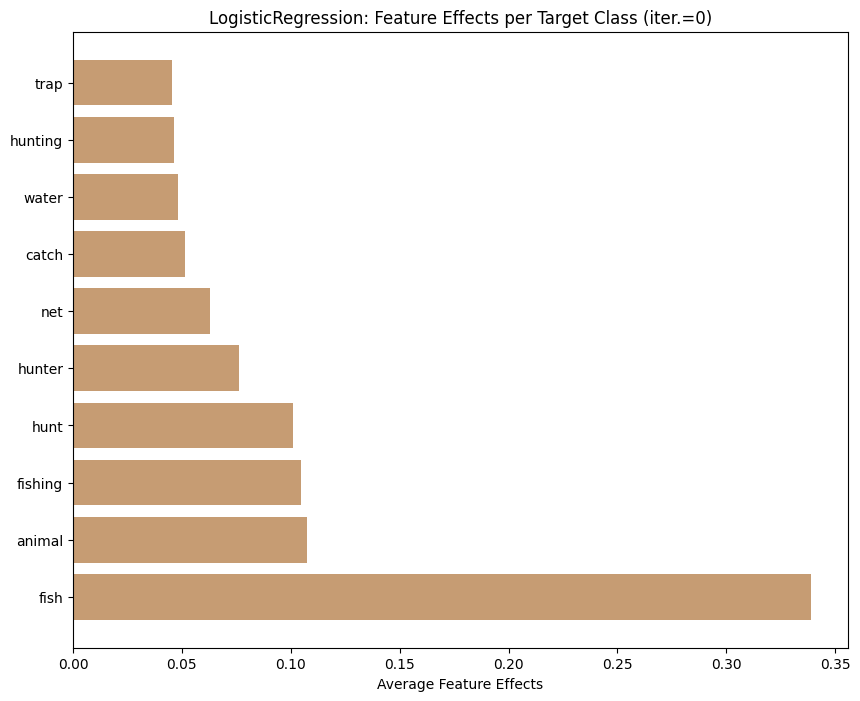

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\test\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.9391304347826087
              precision    recall  f1-score   support

         224      0.926     0.980     0.952      1066
         226      0.965     0.873     0.916       659

    accuracy                          0.939      1725
   macro avg      0.945     0.926     0.934      1725
weighted avg      0.941     0.939     0.938      1725



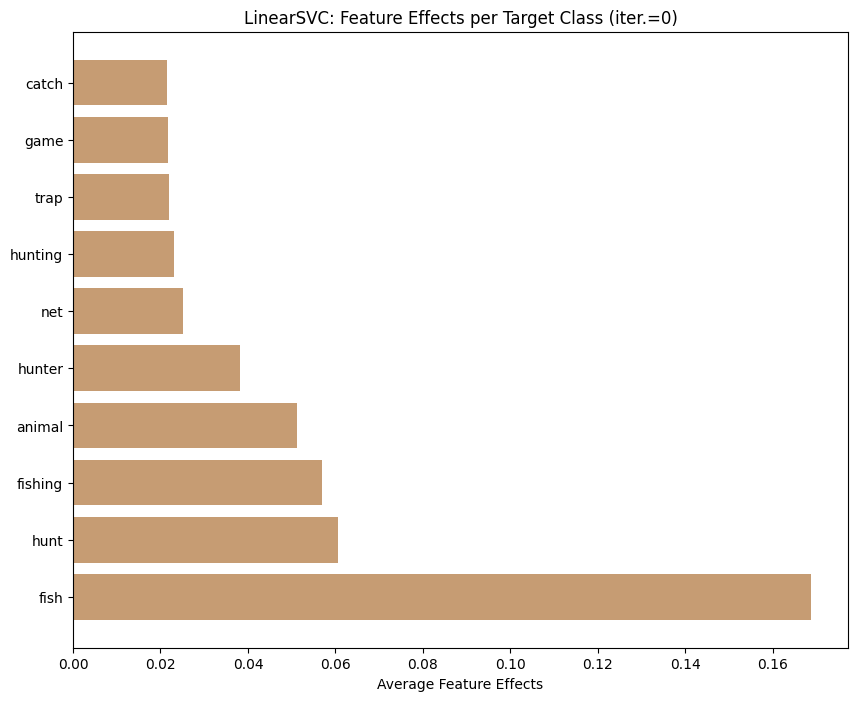

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\test\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.9368115942028985
              precision    recall  f1-score   support

         224      0.922     0.981     0.950      1066
         226      0.966     0.865     0.913       659

    accuracy                          0.937      1725
   macro avg      0.944     0.923     0.932      1725
weighted avg      0.939     0.937     0.936      1725



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


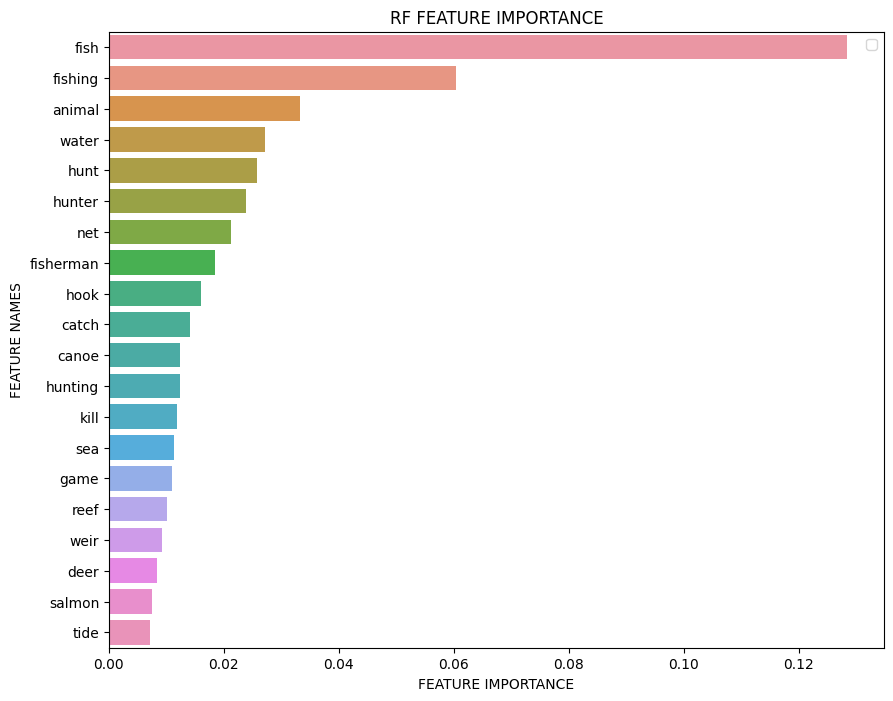

C:\Users\alhas\Documents\development\test-thesis\utils\plots.py:45: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'game'}


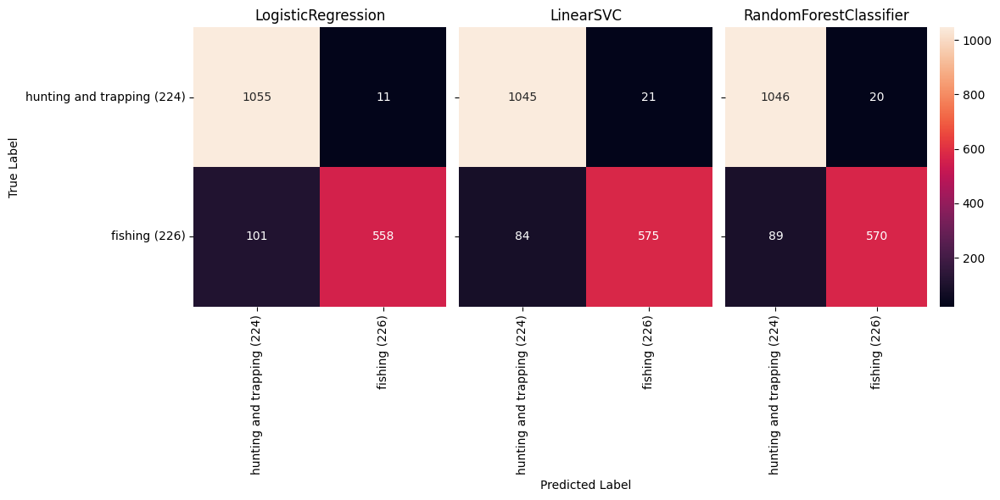

In [21]:
results = iterative_process(models=['LR', 'SVM', 'RF'], 
                            common_indicators=False,
                            chosen_categories=[224, 226],
                            id='1 (224, 226)',
                            df_performance=df_performance,
                            balanced=False,
                            verbose=True)

In [15]:
save_results(results, 'output/results/224_226.pkl')

In [16]:
print(df_performance.to_latex())

\begin{tabular}{lrrr}
\toprule
{} &  precision &    recall &  f1-score \\
\midrule
0\_1 (224, 226)\_LR  &   0.946649 &  0.918209 &  0.929195 \\
0\_1 (224, 226)\_SVM &   0.945181 &  0.926417 &  0.934249 \\
0\_1 (224, 226)\_RF  &   0.942542 &  0.920816 &  0.929648 \\
1\_1 (224, 226)\_LR  &   0.899358 &  0.866671 &  0.878301 \\
1\_1 (224, 226)\_SVM &   0.883793 &  0.866146 &  0.873291 \\
1\_1 (224, 226)\_RF  &   0.883621 &  0.858228 &  0.867728 \\
2\_1 (224, 226)\_LR  &   0.886462 &  0.850958 &  0.863064 \\
2\_1 (224, 226)\_SVM &   0.869056 &  0.853220 &  0.859684 \\
2\_1 (224, 226)\_RF  &   0.859551 &  0.828500 &  0.839125 \\
3\_1 (224, 226)\_LR  &   0.876200 &  0.836653 &  0.849428 \\
3\_1 (224, 226)\_SVM &   0.854744 &  0.837328 &  0.844220 \\
3\_1 (224, 226)\_RF  &   0.824725 &  0.788370 &  0.799308 \\
4\_1 (224, 226)\_LR  &   0.856992 &  0.819464 &  0.831411 \\
4\_1 (224, 226)\_SVM &   0.842609 &  0.825520 &  0.832227 \\
4\_1 (224, 226)\_RF  &   0.829768 &  0.792522 &  0.803744 \\
5\

C:\Users\alhas\AppData\Local\Temp\ipykernel_3880\3683603614.py:1: FutureWarning:

In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.



In [17]:
plot_performance(results, fig_path='output/metric/224_226.png')

### 224, 226 and rest of 220

Iteration 1
Exclude: set()



C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(10378,) (10378,)
10378 documents - 4.92MB (training set)
2 categories


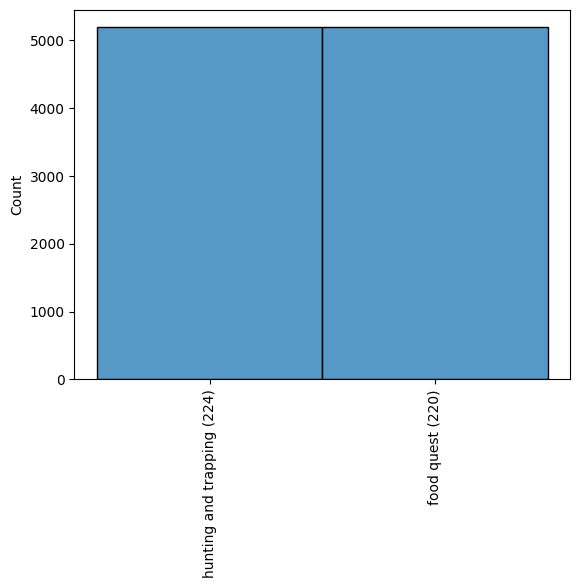

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8696210661528581
              precision    recall  f1-score   support

         220      0.846     0.906     0.875      1572
         224      0.897     0.832     0.863      1542

    accuracy                          0.870      3114
   macro avg      0.872     0.869     0.869      3114
weighted avg      0.871     0.870     0.869      3114



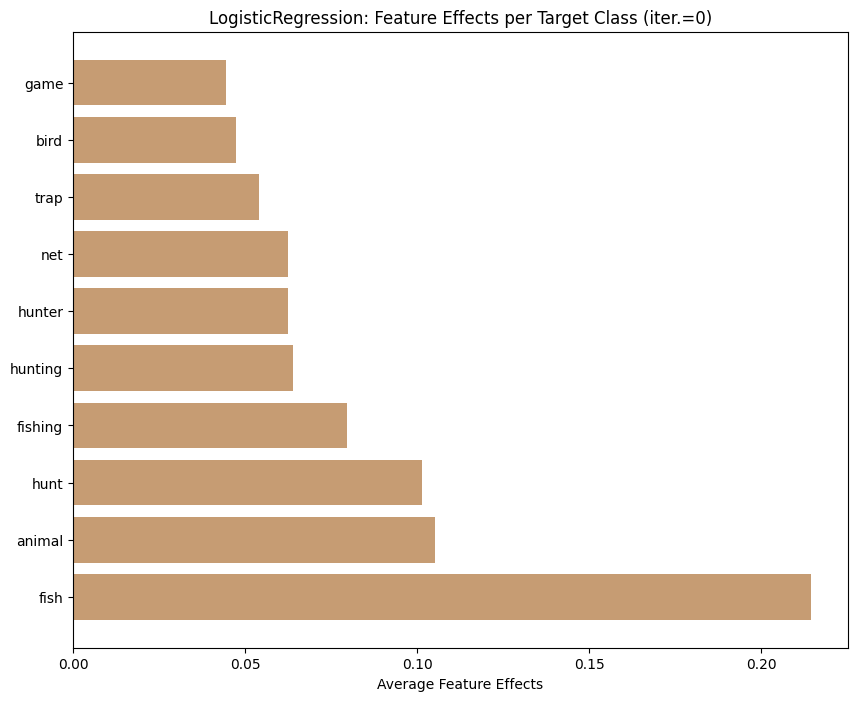

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8648041104688503
              precision    recall  f1-score   support

         220      0.838     0.908     0.872      1572
         224      0.898     0.820     0.857      1542

    accuracy                          0.865      3114
   macro avg      0.868     0.864     0.864      3114
weighted avg      0.867     0.865     0.865      3114



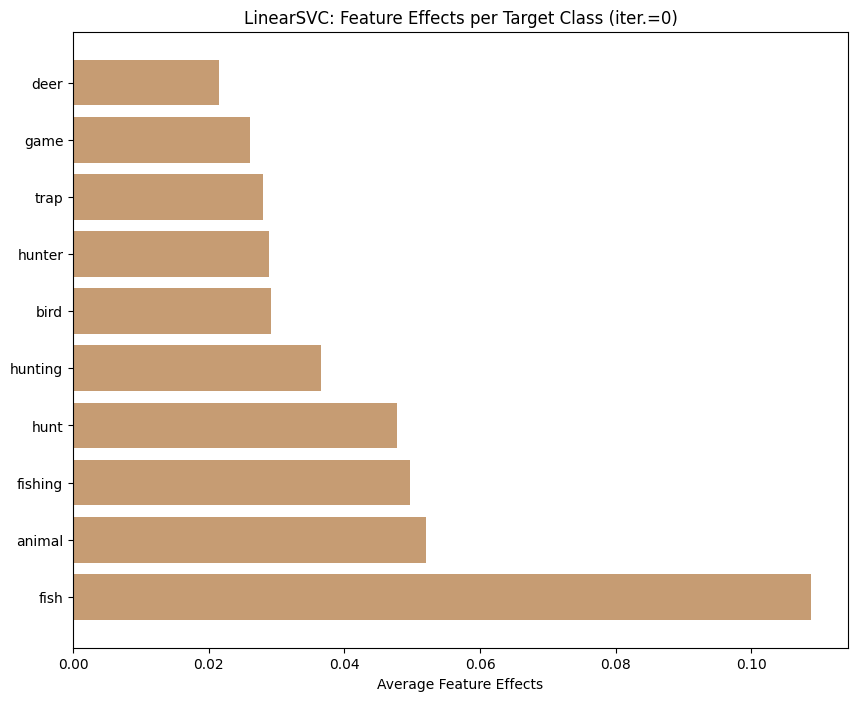

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8400770712909441
              precision    recall  f1-score   support

         220      0.907     0.761     0.828      1572
         224      0.791     0.921     0.851      1542

    accuracy                          0.840      3114
   macro avg      0.849     0.841     0.839      3114
weighted avg      0.850     0.840     0.839      3114



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


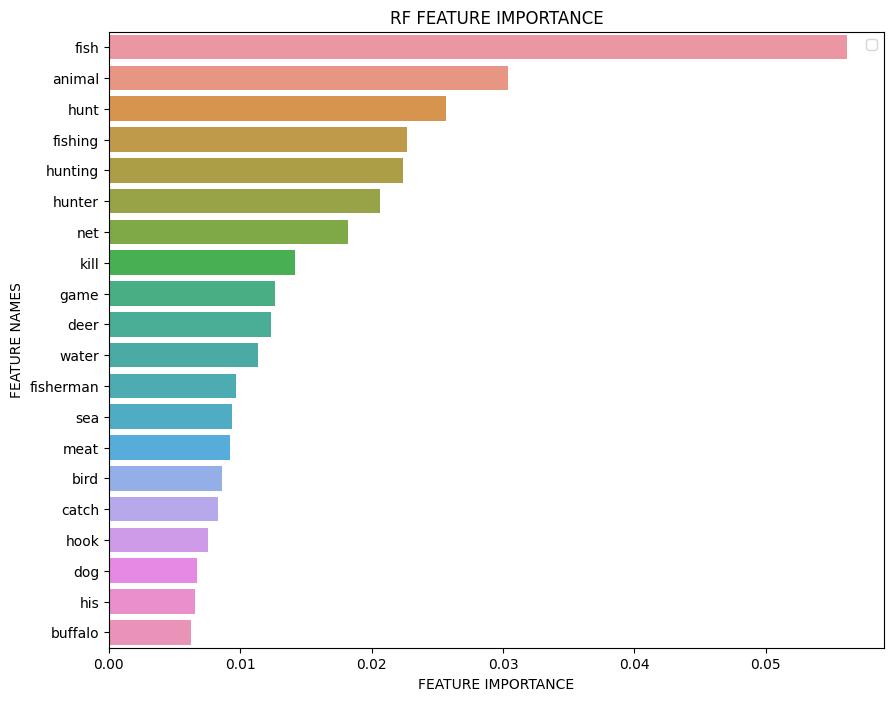

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'game'}
Iteration 2
Exclude: {'buffalo', 'hunter', 'fisherman', 'bird', 'meat', 'hunting', 'fish', 'water', 'catch', 'net', 'deer', 'hook', 'animal', 'dog', 'fishing', 'sea', 'kill', 'hunt', 'trap'}



C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(10378,) (10378,)
10378 documents - 4.92MB (training set)
2 categories


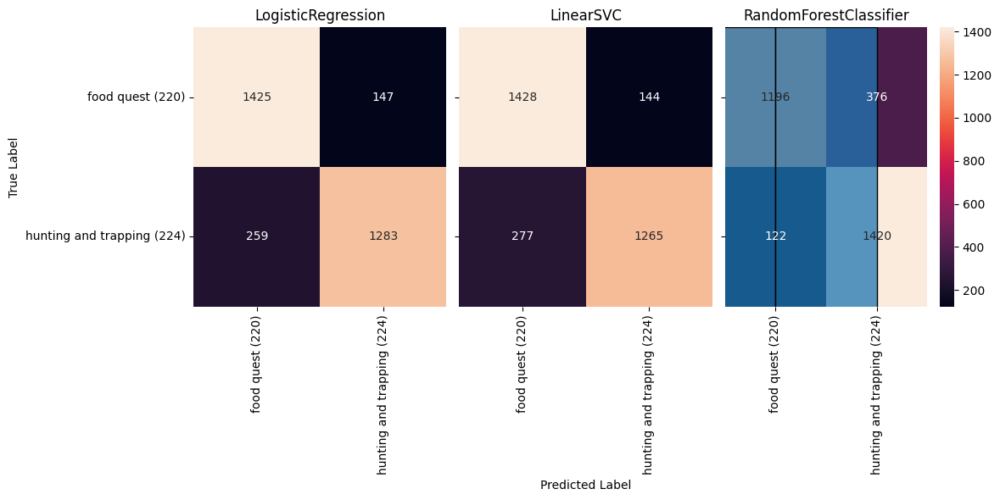

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8301220295439948
              precision    recall  f1-score   support

         220      0.810     0.866     0.837      1572
         224      0.853     0.793     0.822      1542

    accuracy                          0.830      3114
   macro avg      0.832     0.830     0.830      3114
weighted avg      0.832     0.830     0.830      3114



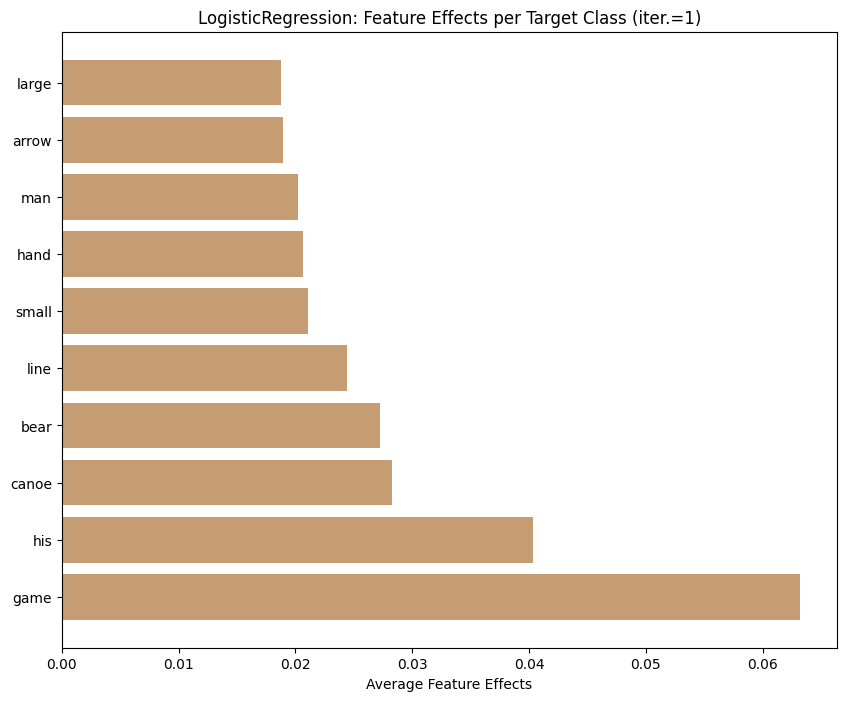

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8204881181759794
              precision    recall  f1-score   support

         220      0.800     0.860     0.829      1572
         224      0.845     0.780     0.811      1542

    accuracy                          0.820      3114
   macro avg      0.822     0.820     0.820      3114
weighted avg      0.822     0.820     0.820      3114



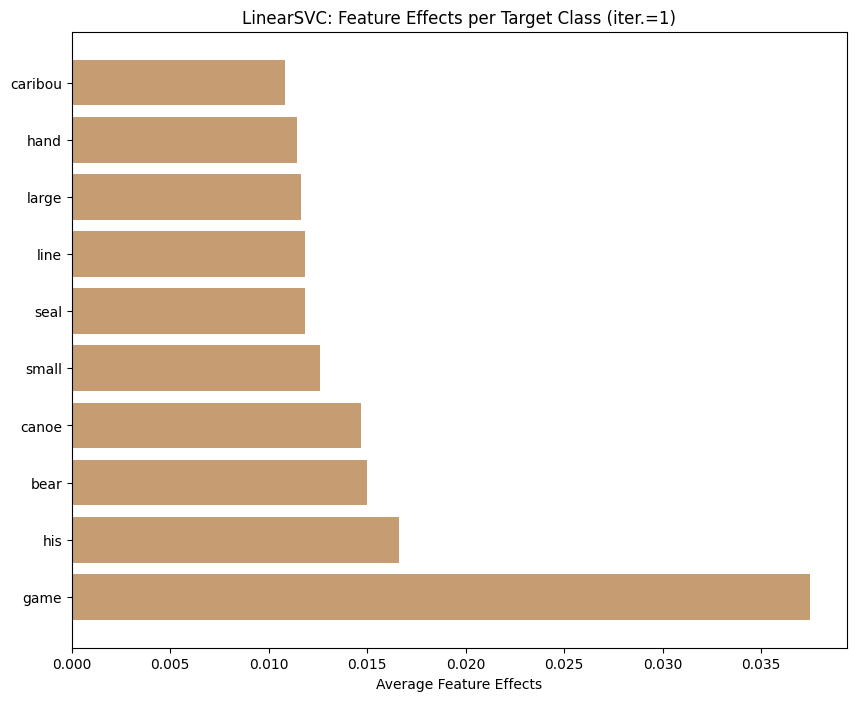

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7928709055876686
              precision    recall  f1-score   support

         220      0.851     0.714     0.777      1572
         224      0.750     0.873     0.807      1542

    accuracy                          0.793      3114
   macro avg      0.801     0.794     0.792      3114
weighted avg      0.801     0.793     0.792      3114



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


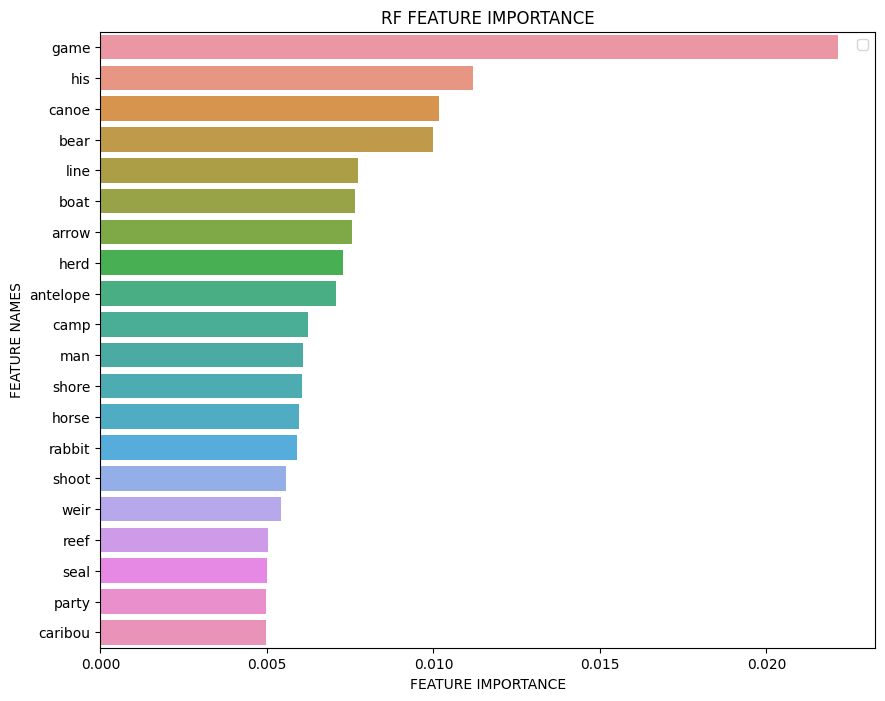

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'game', 'man'}
Iteration 3
Exclude: {'buffalo', 'hunter', 'fisherman', 'bird', 'line', 'herd', 'meat', 'seal', 'boat', 'hunting', 'caribou', 'camp', 'fish', 'weir', 'shoot', 'water', 'large', 'rabbit', 'shore', 'bear', 'canoe', 'catch', 'party', 'net', 'deer', 'hook', 'arrow', 'animal', 'reef', 'antelope', 'dog', 'horse', 'fishing', 'small', 'hand', 'sea', 'kill', 'hunt', 'trap'}



C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(10378,) (10378,)
10378 documents - 4.92MB (training set)
2 categories


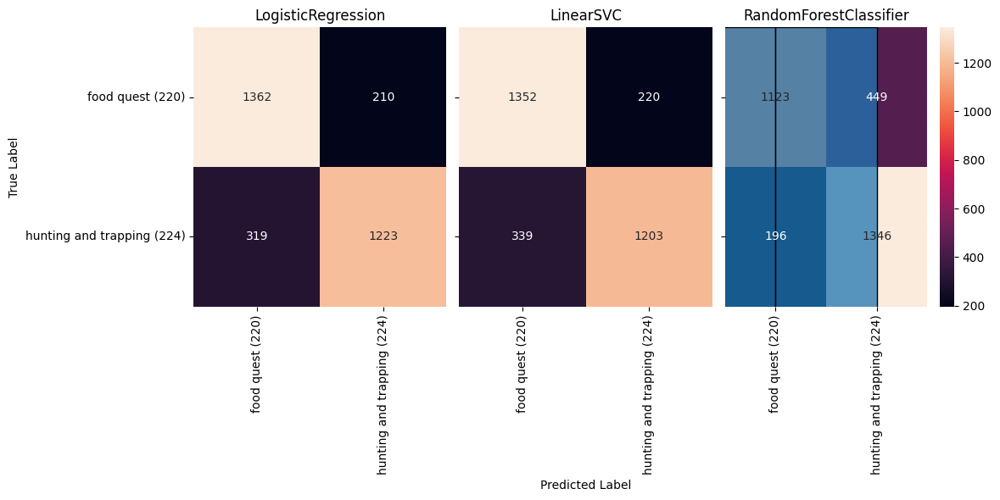

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8201669877970456
              precision    recall  f1-score   support

         220      0.800     0.858     0.828      1572
         224      0.844     0.781     0.811      1542

    accuracy                          0.820      3114
   macro avg      0.822     0.820     0.820      3114
weighted avg      0.822     0.820     0.820      3114



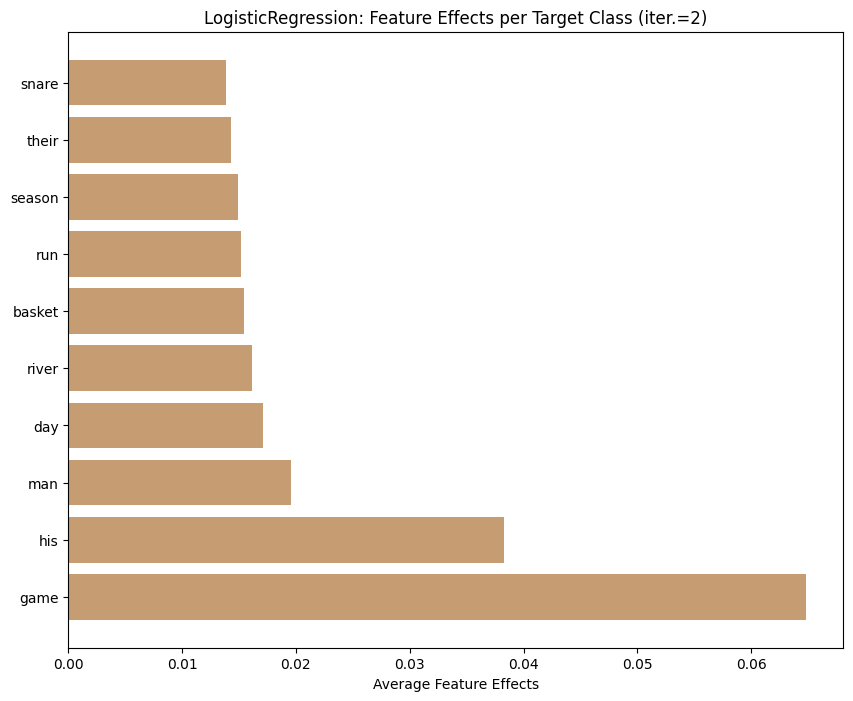

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8102119460500964
              precision    recall  f1-score   support

         220      0.791     0.848     0.819      1572
         224      0.833     0.772     0.801      1542

    accuracy                          0.810      3114
   macro avg      0.812     0.810     0.810      3114
weighted avg      0.812     0.810     0.810      3114



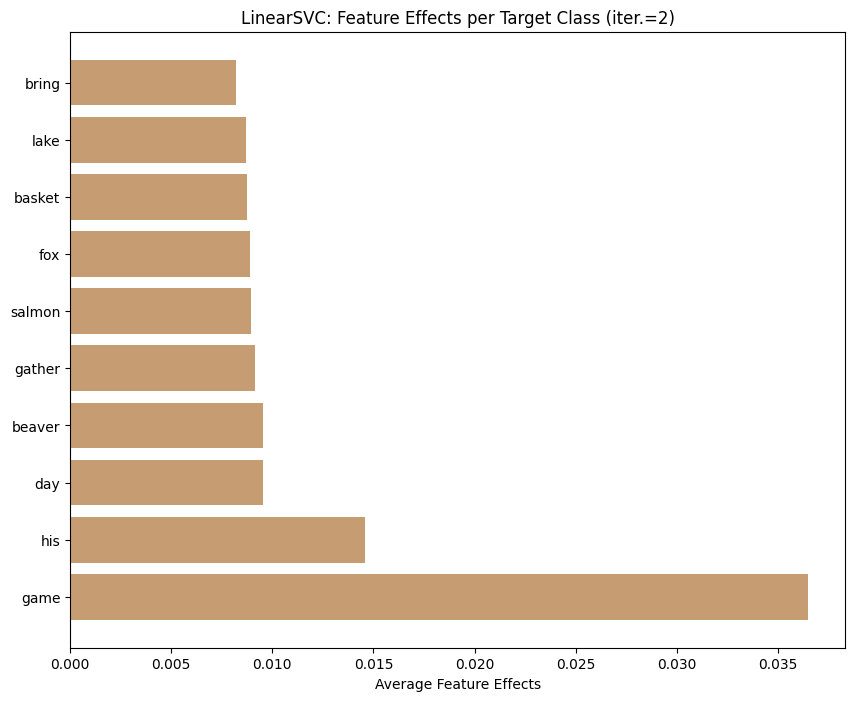

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.781631342324984
              precision    recall  f1-score   support

         220      0.830     0.713     0.767      1572
         224      0.744     0.851     0.794      1542

    accuracy                          0.782      3114
   macro avg      0.787     0.782     0.781      3114
weighted avg      0.788     0.782     0.781      3114



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


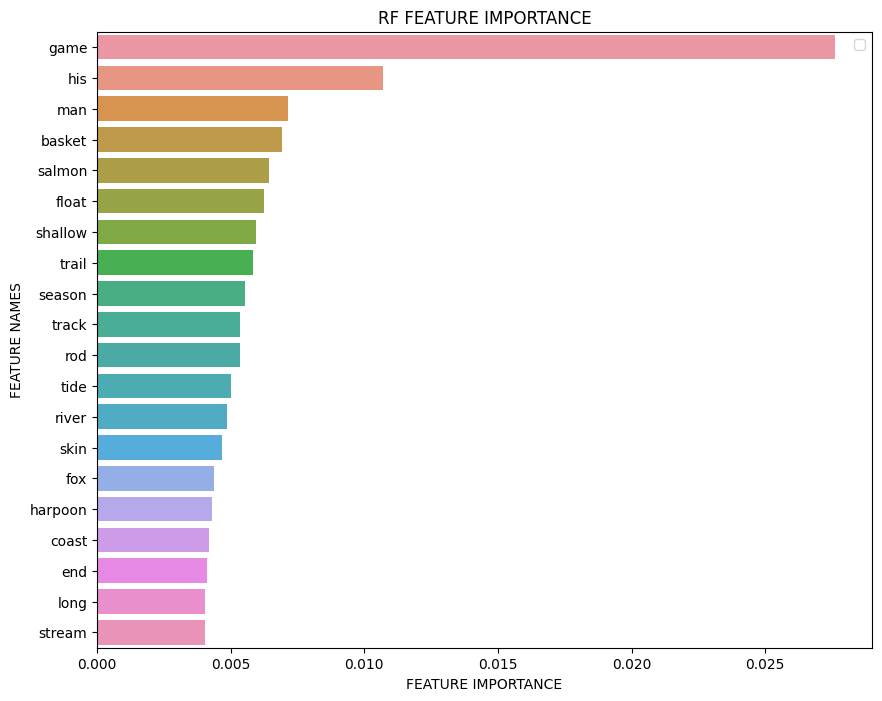

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'their', 'his', 'game', 'man'}
Iteration 4
Exclude: {'harpoon', 'end', 'buffalo', 'hunter', 'shallow', 'fisherman', 'bird', 'tide', 'rod', 'line', 'herd', 'meat', 'seal', 'boat', 'hunting', 'caribou', 'camp', 'fish', 'weir', 'gather', 'shoot', 'water', 'large', 'day', 'rabbit', 'shore', 'float', 'skin', 'river', 'fox', 'bear', 'lake', 'trail', 'long', 'basket', 'canoe', 'catch', 'party', 'net', 'season', 'deer', 'salmon', 'hook', 'snare', 'coast', 'arrow', 'animal', 'reef', 'track', 'beaver', 'antelope', 'stream', 'dog', 'horse', 'fishing', 'small', 'hand', 'sea', 'kill', 'bring', 'hunt', 'run', 'trap'}



C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(10378,) (10378,)
10378 documents - 4.92MB (training set)
2 categories


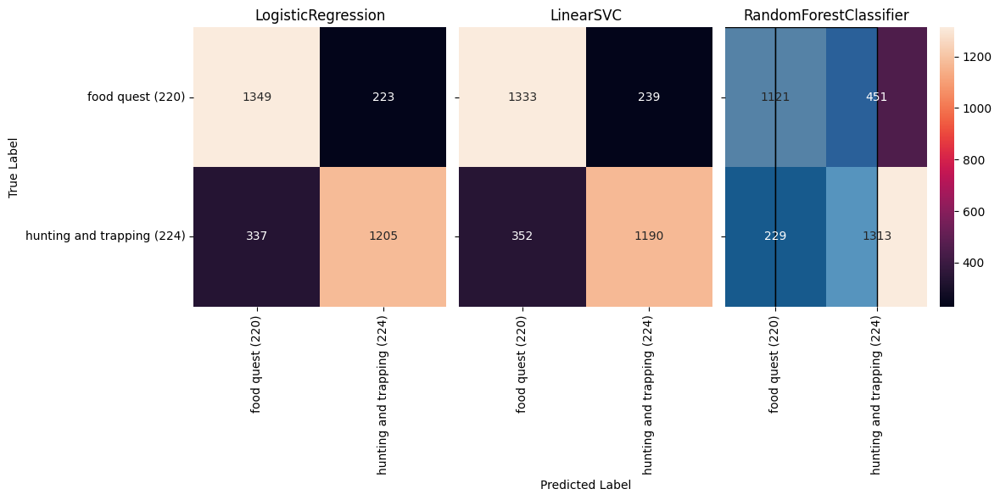

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8134232498394348
              precision    recall  f1-score   support

         220      0.791     0.856     0.822      1572
         224      0.840     0.770     0.803      1542

    accuracy                          0.813      3114
   macro avg      0.816     0.813     0.813      3114
weighted avg      0.815     0.813     0.813      3114



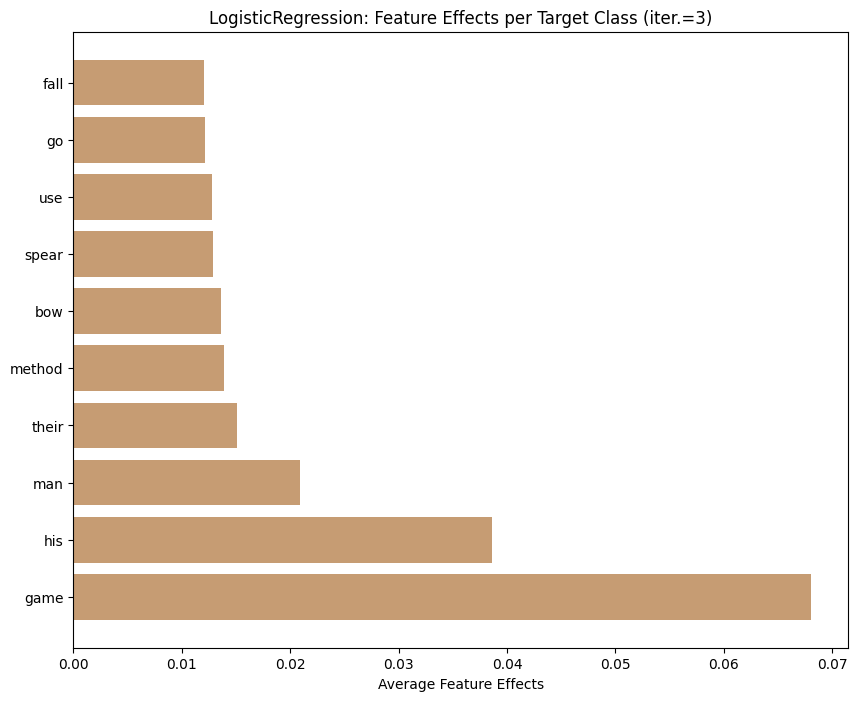

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8018625561978163
              precision    recall  f1-score   support

         220      0.783     0.841     0.811      1572
         224      0.825     0.762     0.792      1542

    accuracy                          0.802      3114
   macro avg      0.804     0.801     0.801      3114
weighted avg      0.803     0.802     0.802      3114



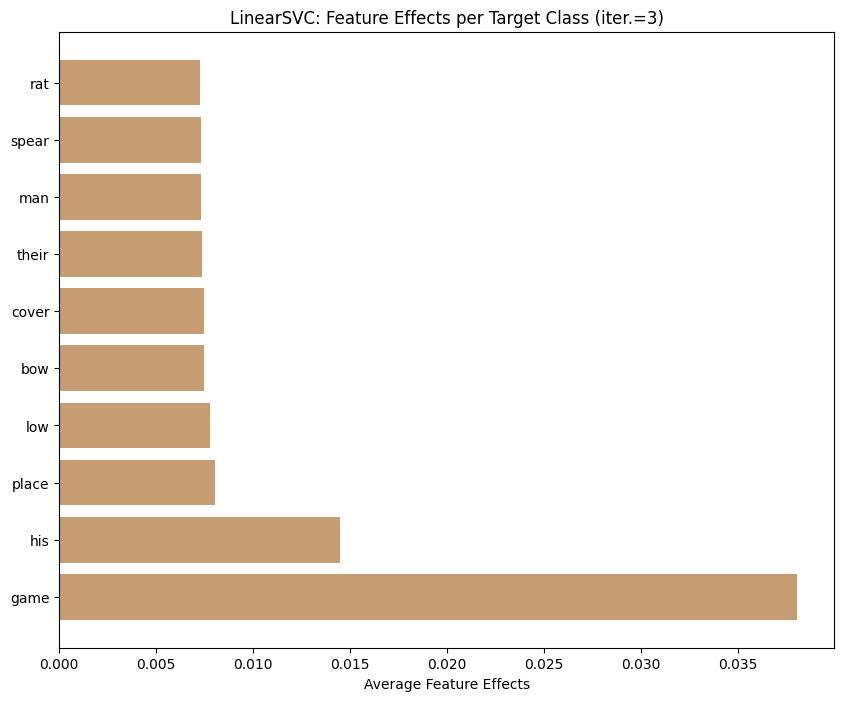

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7723185613359024
              precision    recall  f1-score   support

         220      0.819     0.705     0.758      1572
         224      0.737     0.841     0.785      1542

    accuracy                          0.772      3114
   macro avg      0.778     0.773     0.771      3114
weighted avg      0.778     0.772     0.771      3114



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


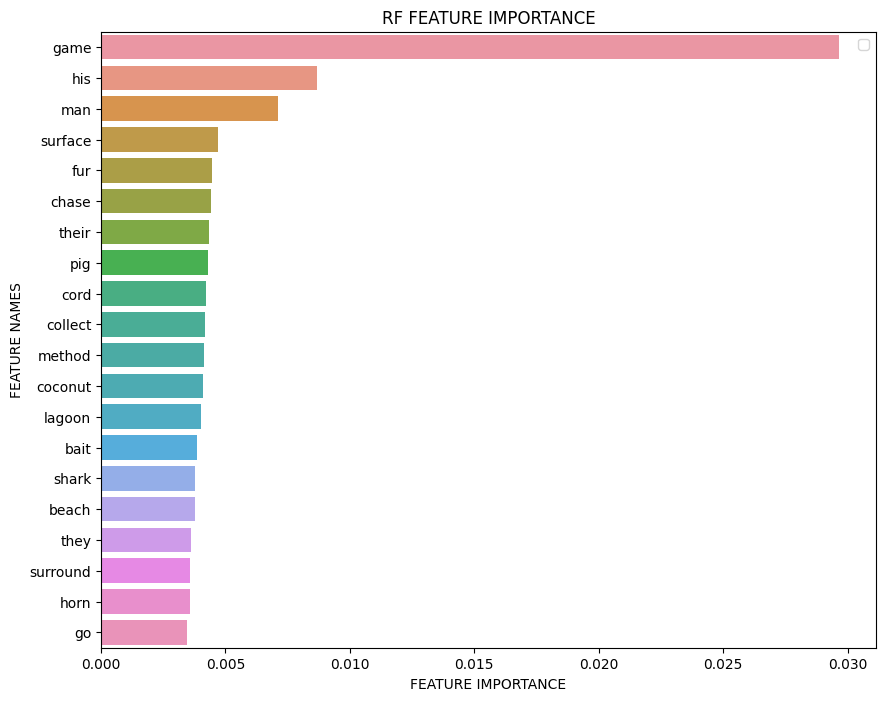

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'their', 'they', 'game', 'man'}
Iteration 5
Exclude: {'shallow', 'fisherman', 'bird', 'seal', 'surface', 'large', 'coconut', 'shore', 'shark', 'fox', 'lake', 'bear', 'basket', 'season', 'method', 'coast', 'arrow', 'cover', 'go', 'run', 'trap', 'fall', 'harpoon', 'bait', 'end', 'buffalo', 'pig', 'collect', 'rat', 'caribou', 'camp', 'fish', 'weir', 'spear', 'water', 'river', 'trail', 'net', 'deer', 'hook', 'beaver', 'stream', 'bring', 'rod', 'meat', 'boat', 'gather', 'fur', 'low', 'day', 'float', 'chase', 'surround', 'skin', 'use', 'catch', 'party', 'antelope', 'dog', 'horse', 'small', 'hunter', 'tide', 'line', 'herd', 'lagoon', 'hunting', 'shoot', 'place', 'rabbit', 'bow', 'beach', 'long', 'canoe', 'salmon', 'snare', 'cord', 'animal', 'reef', 'track', 'fishing', 'hand', 'sea', 'kill', 'hunt', 'horn'}



C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(10378,) (10378,)
10378 documents - 4.92MB (training set)
2 categories


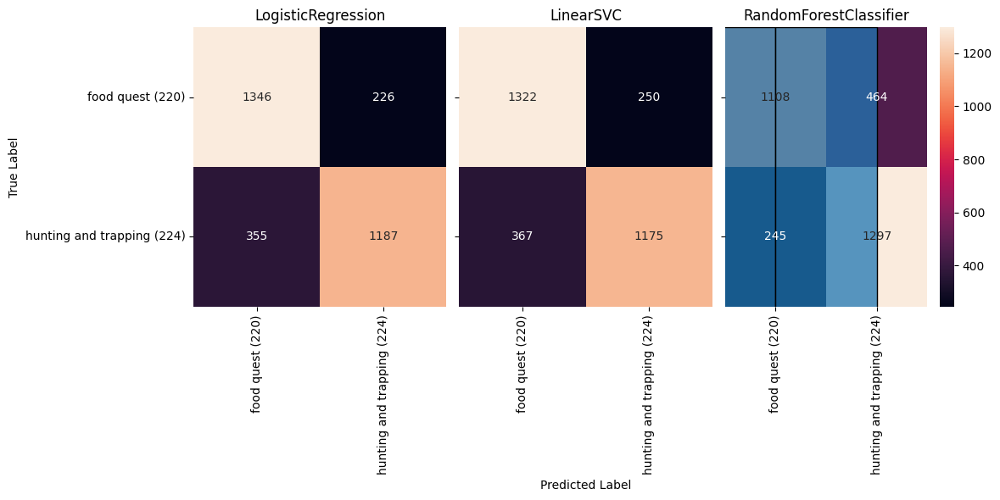

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8015414258188824
              precision    recall  f1-score   support

         220      0.779     0.848     0.812      1572
         224      0.830     0.754     0.790      1542

    accuracy                          0.802      3114
   macro avg      0.804     0.801     0.801      3114
weighted avg      0.804     0.802     0.801      3114



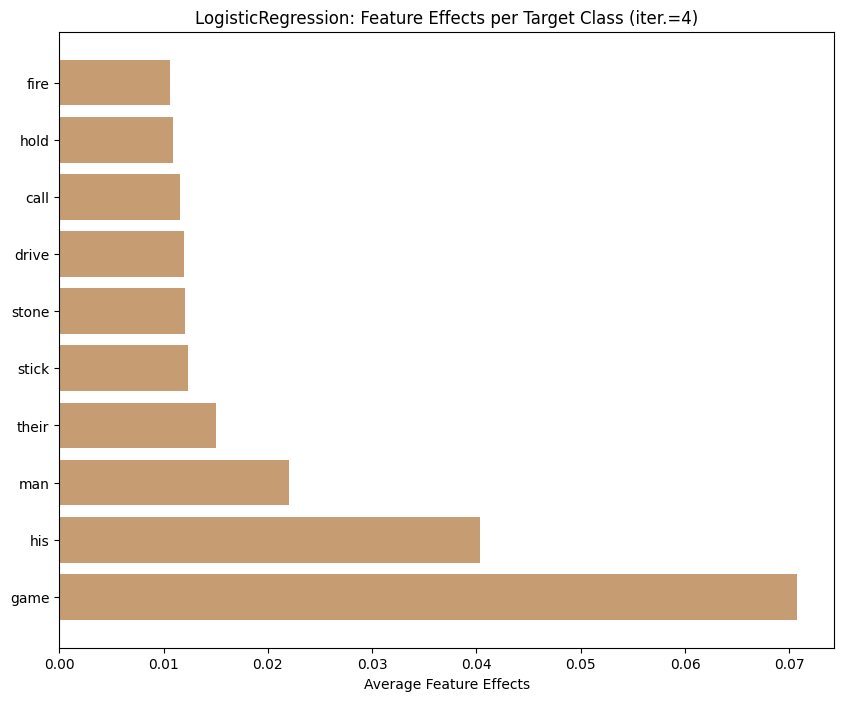

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7947976878612717
              precision    recall  f1-score   support

         220      0.776     0.835     0.804      1572
         224      0.817     0.754     0.784      1542

    accuracy                          0.795      3114
   macro avg      0.797     0.794     0.794      3114
weighted avg      0.796     0.795     0.794      3114



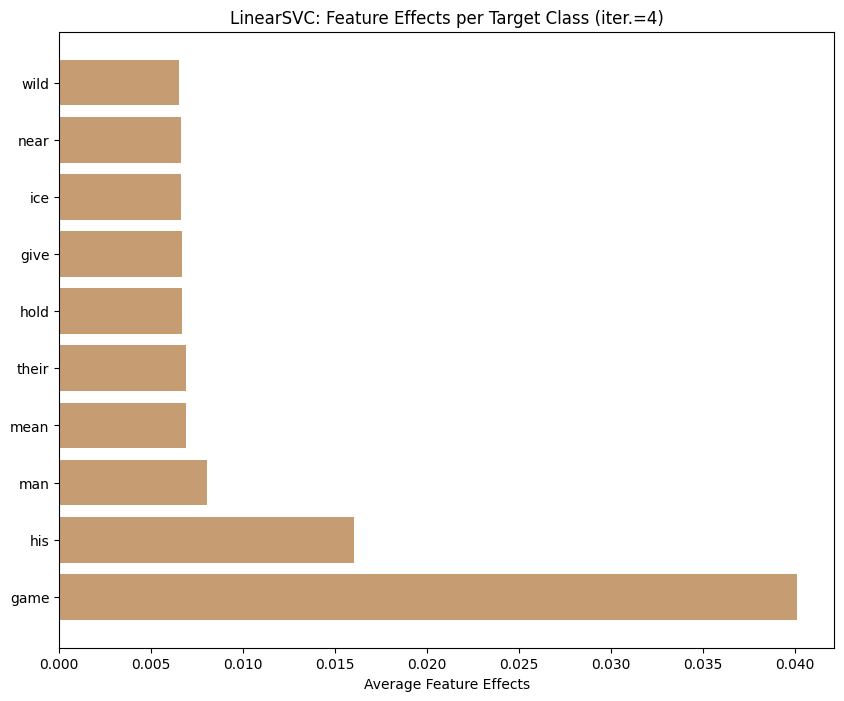

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7694283879254977
              precision    recall  f1-score   support

         220      0.815     0.702     0.755      1572
         224      0.734     0.838     0.783      1542

    accuracy                          0.769      3114
   macro avg      0.775     0.770     0.769      3114
weighted avg      0.775     0.769     0.768      3114



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


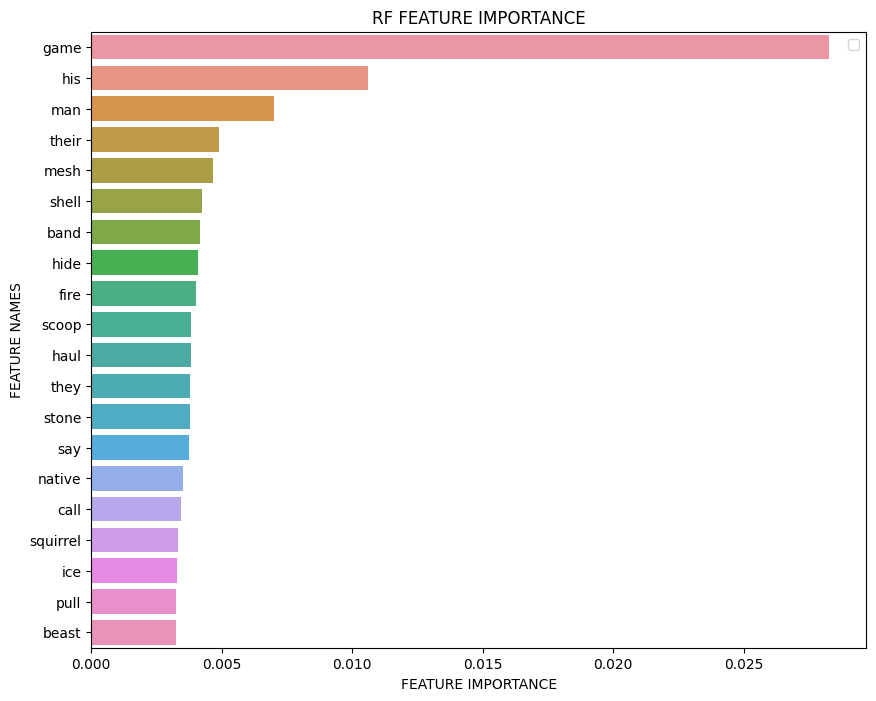

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'their', 'they', 'game', 'man'}
Iteration 6
Exclude: {'native', 'shallow', 'fisherman', 'bird', 'seal', 'pull', 'squirrel', 'surface', 'large', 'coconut', 'give', 'shore', 'shark', 'fox', 'lake', 'bear', 'wild', 'basket', 'haul', 'season', 'method', 'coast', 'arrow', 'scoop', 'cover', 'go', 'run', 'trap', 'fall', 'harpoon', 'bait', 'end', 'buffalo', 'pig', 'collect', 'rat', 'caribou', 'camp', 'fish', 'weir', 'beast', 'spear', 'water', 'call', 'say', 'river', 'fire', 'trail', 'stick', 'net', 'deer', 'hook', 'beaver', 'stream', 'shell', 'bring', 'hold', 'mesh', 'stone', 'rod', 'meat', 'boat', 'gather', 'fur', 'low', 'day', 'float', 'chase', 'hide', 'surround', 'skin', 'use', 'catch', 'party', 'antelope', 'dog', 'horse', 'small', 'hunter', 'tide', 'line', 'herd', 'band', 'lagoon', 'drive', 'hunting', 'shoot', 'place', 'mean', 'near', 'rabbit', 'bow', 'beach', 'long', 'canoe', 'salmon', 'snare', 'cord', 'ice', 'animal', 'reef', 'track', 'fishing', 'hand', 'sea', 'kill', 'hunt', 'ho

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(10378,) (10378,)
10378 documents - 4.92MB (training set)
2 categories


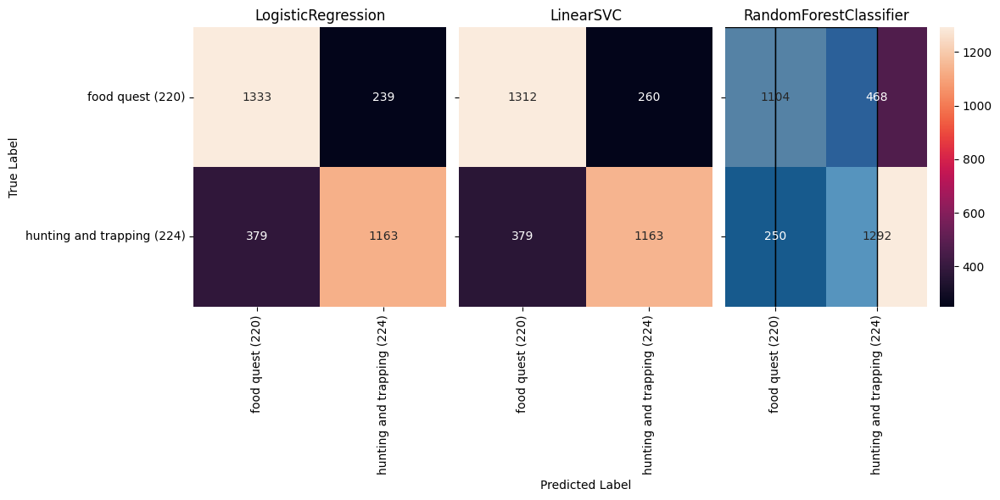

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8028259473346179
              precision    recall  f1-score   support

         220      0.779     0.851     0.813      1572
         224      0.832     0.754     0.791      1542

    accuracy                          0.803      3114
   macro avg      0.806     0.802     0.802      3114
weighted avg      0.805     0.803     0.802      3114



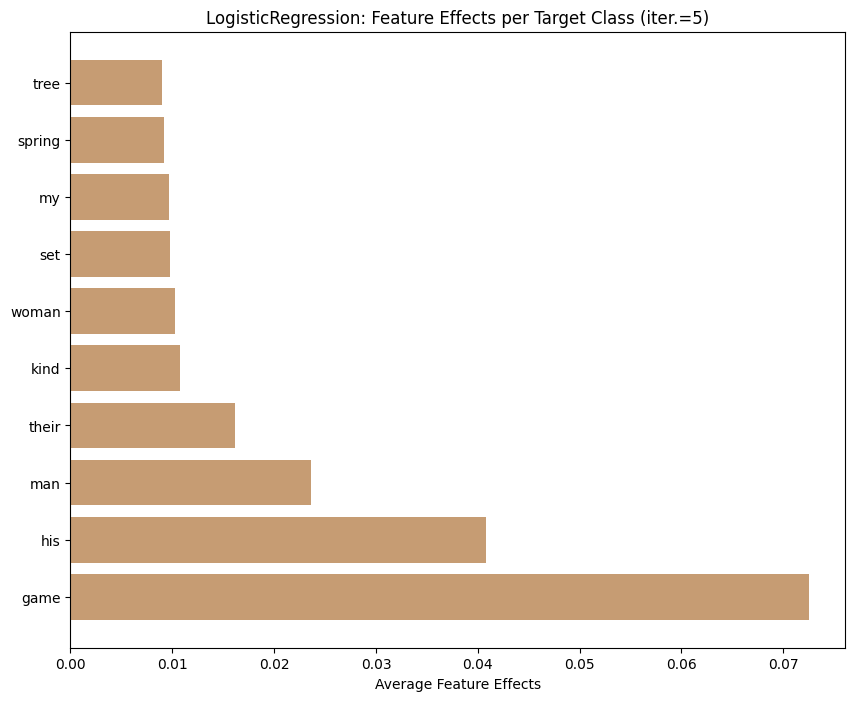

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7935131663455363
              precision    recall  f1-score   support

         220      0.773     0.837     0.804      1572
         224      0.818     0.750     0.782      1542

    accuracy                          0.794      3114
   macro avg      0.796     0.793     0.793      3114
weighted avg      0.795     0.794     0.793      3114



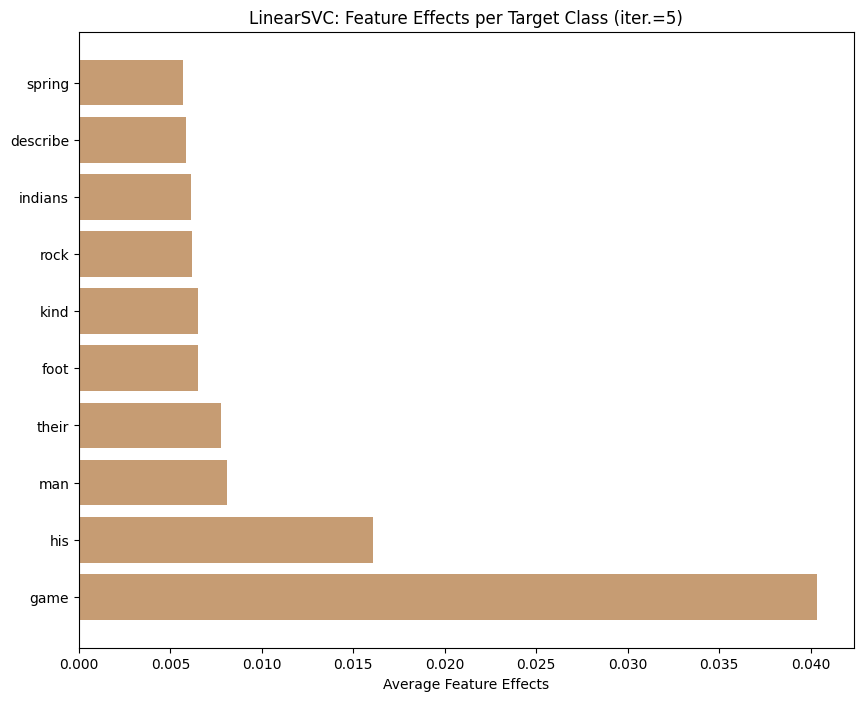

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7456647398843931
              precision    recall  f1-score   support

         220      0.787     0.680     0.730      1572
         224      0.714     0.813     0.760      1542

    accuracy                          0.746      3114
   macro avg      0.750     0.746     0.745      3114
weighted avg      0.751     0.746     0.745      3114



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


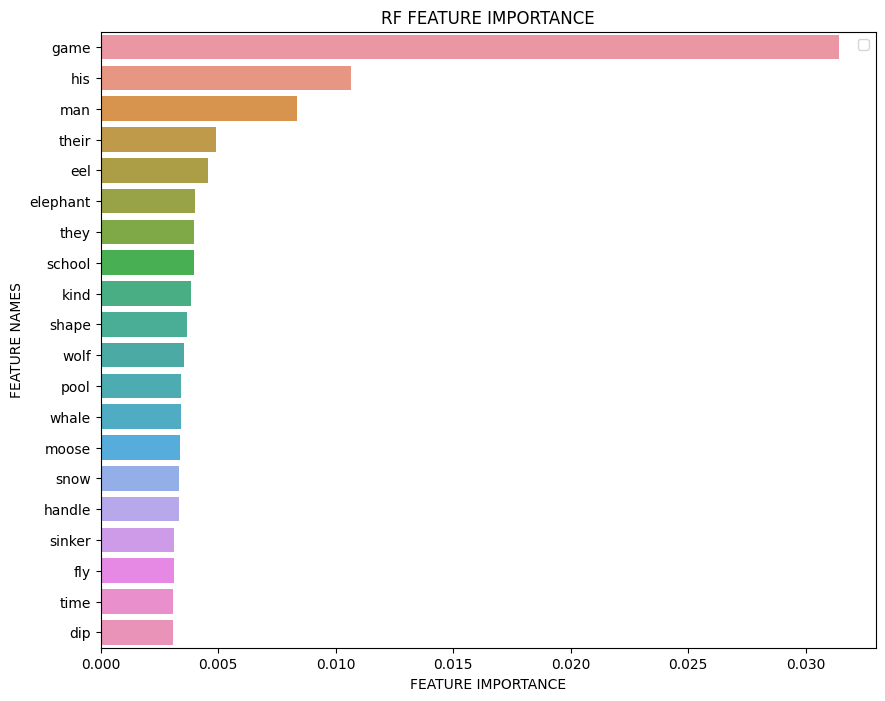

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'my', 'man'}
Iteration 7
Exclude: {'native', 'pool', 'shallow', 'fisherman', 'bird', 'seal', 'pull', 'squirrel', 'elephant', 'surface', 'indians', 'large', 'coconut', 'give', 'shore', 'shark', 'fox', 'lake', 'bear', 'wild', 'basket', 'fly', 'haul', 'season', 'method', 'coast', 'arrow', 'scoop', 'cover', 'go', 'run', 'trap', 'fall', 'harpoon', 'bait', 'end', 'buffalo', 'tree', 'dip', 'school', 'pig', 'collect', 'rat', 'whale', 'caribou', 'camp', 'fish', 'weir', 'beast', 'spear', 'rock', 'describe', 'water', 'eel', 'call', 'sinker', 'say', 'river', 'fire', 'trail', 'stick', 'net', 'deer', 'hook', 'beaver', 'stream', 'shell', 'bring', 'hold', 'mesh', 'snow', 'stone', 'rod', 'shape', 'meat', 'boat', 'gather', 'fur', 'low', 'day', 'set', 'float', 'chase', 'hide', 'surround', 'skin', 'use', 'catch', 'party', 'antelope', 'foot', 'dog', 'horse', 'time', 'small', 'wolf', 'hunter', 'tide', 'line', 'herd', 'band', 'lagoon', 'drive', 'hunting', 'kind', 'sh

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(10378,) (10378,)
10378 documents - 4.92MB (training set)
2 categories


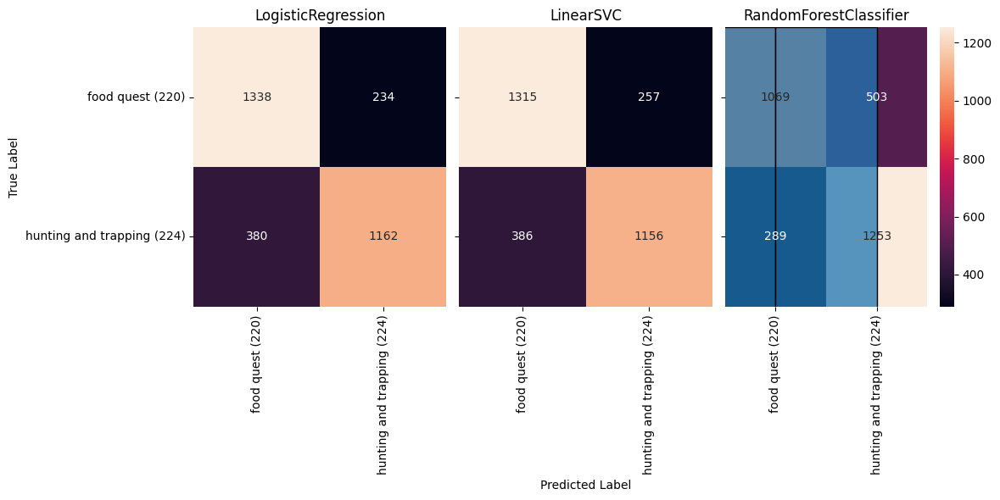

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8008991650610148
              precision    recall  f1-score   support

         220      0.776     0.851     0.812      1572
         224      0.832     0.750     0.789      1542

    accuracy                          0.801      3114
   macro avg      0.804     0.800     0.800      3114
weighted avg      0.804     0.801     0.800      3114



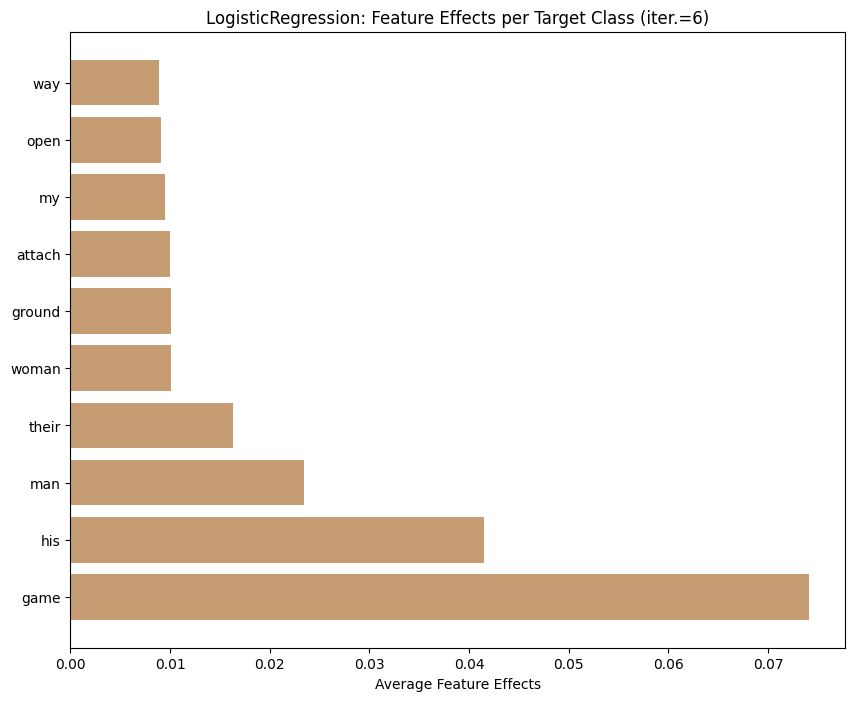

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.791907514450867
              precision    recall  f1-score   support

         220      0.772     0.835     0.802      1572
         224      0.816     0.748     0.781      1542

    accuracy                          0.792      3114
   macro avg      0.794     0.791     0.791      3114
weighted avg      0.794     0.792     0.791      3114



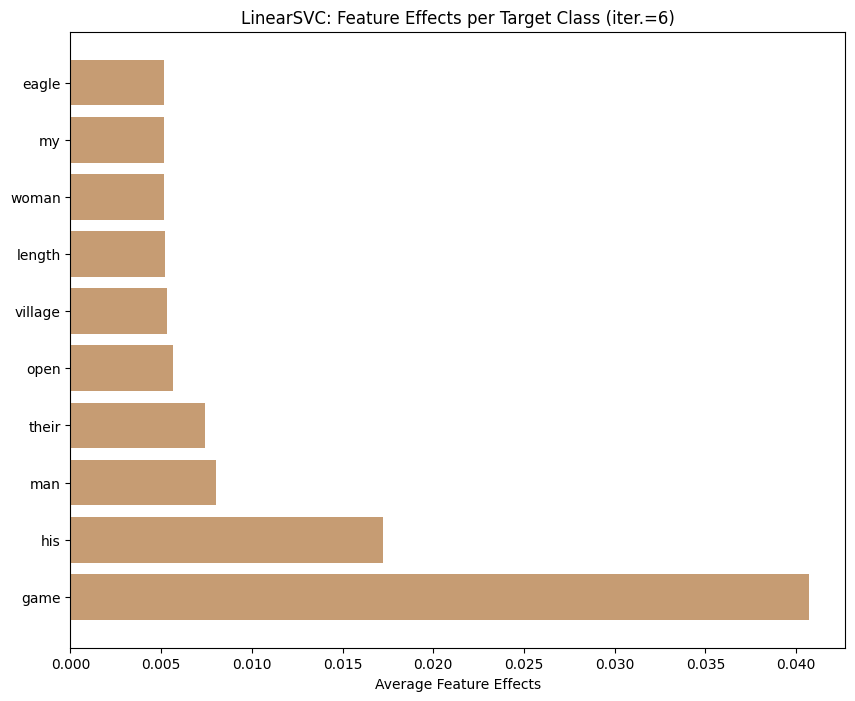

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7472703917790623
              precision    recall  f1-score   support

         220      0.788     0.684     0.732      1572
         224      0.716     0.812     0.761      1542

    accuracy                          0.747      3114
   macro avg      0.752     0.748     0.746      3114
weighted avg      0.752     0.747     0.746      3114



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


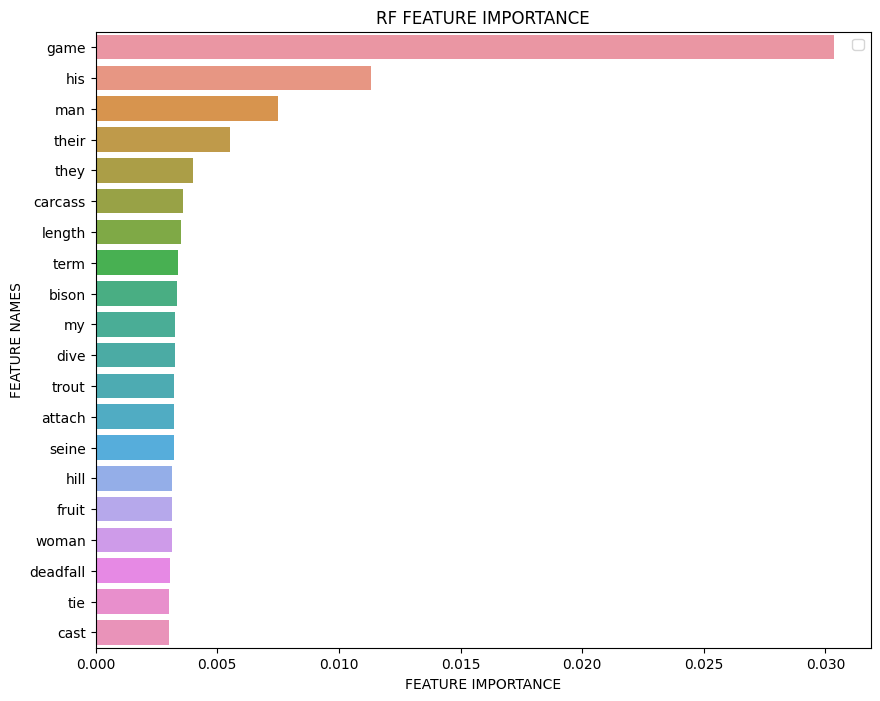

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'my', 'man'}
Iteration 8
Exclude: {'native', 'pool', 'shallow', 'fisherman', 'bird', 'seal', 'pull', 'squirrel', 'elephant', 'surface', 'indians', 'ground', 'large', 'cast', 'coconut', 'give', 'shore', 'shark', 'fox', 'lake', 'bear', 'length', 'wild', 'basket', 'fly', 'haul', 'season', 'method', 'fruit', 'coast', 'arrow', 'scoop', 'bison', 'cover', 'go', 'run', 'trap', 'fall', 'harpoon', 'bait', 'end', 'buffalo', 'tree', 'dip', 'school', 'pig', 'collect', 'rat', 'whale', 'caribou', 'camp', 'fish', 'weir', 'beast', 'spear', 'rock', 'describe', 'water', 'eel', 'call', 'sinker', 'say', 'seine', 'river', 'fire', 'trail', 'stick', 'trout', 'deadfall', 'net', 'deer', 'hook', 'beaver', 'stream', 'shell', 'bring', 'term', 'carcass', 'hold', 'dive', 'mesh', 'snow', 'stone', 'tie', 'rod', 'shape', 'meat', 'attach', 'boat', 'gather', 'fur', 'low', 'day', 'set', 'float', 'chase', 'hide', 'surround', 'skin', 'use', 'catch', 'party', 'eagle', 'antelope', 'fo

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(10378,) (10378,)
10378 documents - 4.92MB (training set)
2 categories


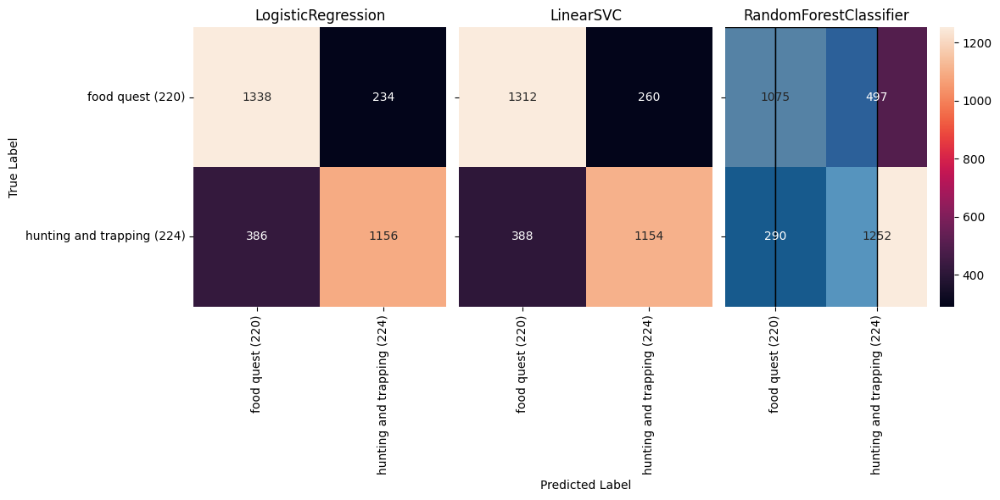

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7928709055876686
              precision    recall  f1-score   support

         220      0.770     0.840     0.804      1572
         224      0.821     0.744     0.781      1542

    accuracy                          0.793      3114
   macro avg      0.795     0.792     0.792      3114
weighted avg      0.795     0.793     0.792      3114



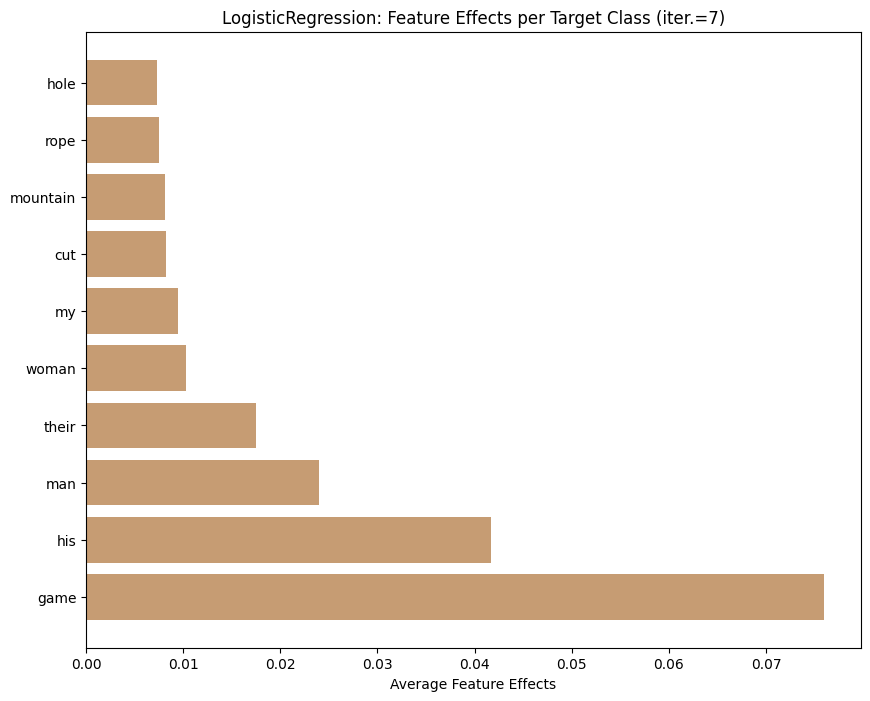

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7870905587668593
              precision    recall  f1-score   support

         220      0.766     0.832     0.798      1572
         224      0.812     0.741     0.775      1542

    accuracy                          0.787      3114
   macro avg      0.789     0.787     0.786      3114
weighted avg      0.789     0.787     0.787      3114



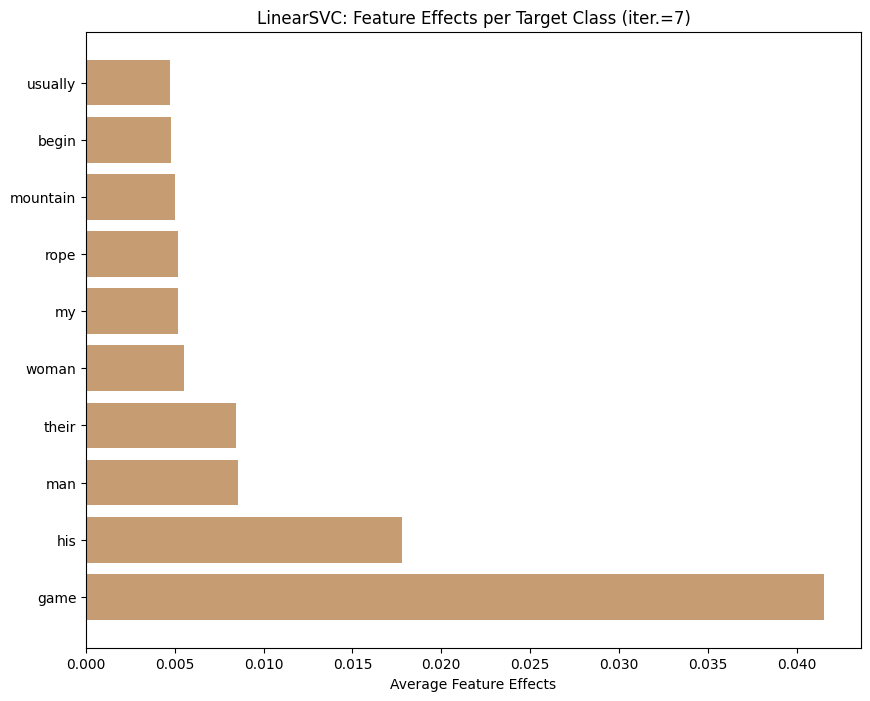

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7495183044315993
              precision    recall  f1-score   support

         220      0.734     0.790     0.761      1572
         224      0.768     0.708     0.737      1542

    accuracy                          0.750      3114
   macro avg      0.751     0.749     0.749      3114
weighted avg      0.751     0.750     0.749      3114



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


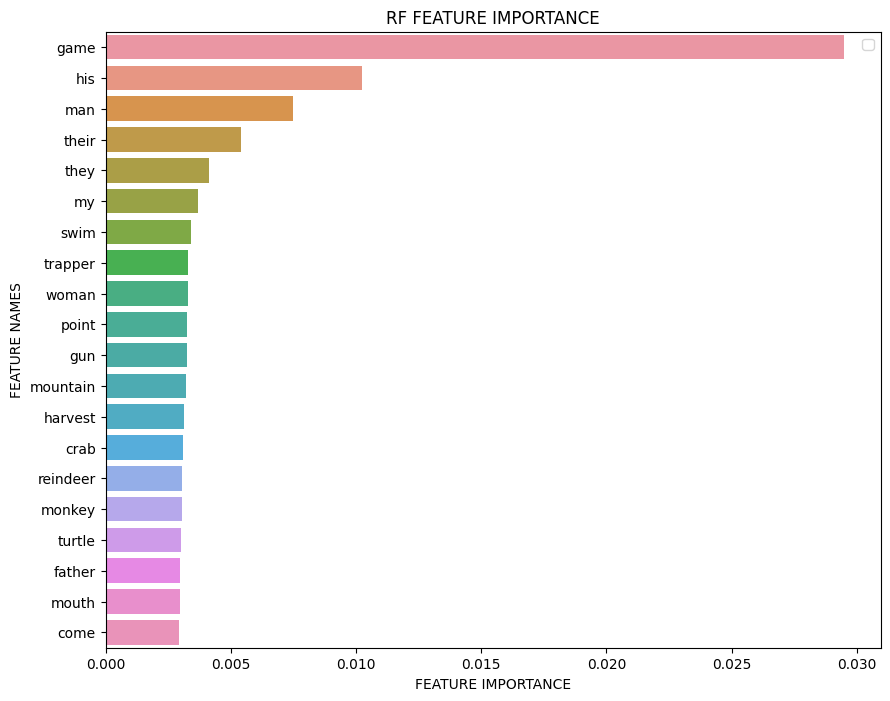

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'my', 'man'}
Iteration 9
Exclude: {'native', 'pool', 'shallow', 'fisherman', 'bird', 'cut', 'seal', 'pull', 'squirrel', 'turtle', 'elephant', 'surface', 'indians', 'ground', 'large', 'cast', 'coconut', 'give', 'shore', 'shark', 'swim', 'fox', 'lake', 'bear', 'length', 'wild', 'gun', 'basket', 'fly', 'haul', 'season', 'method', 'begin', 'fruit', 'coast', 'arrow', 'scoop', 'bison', 'cover', 'hole', 'go', 'run', 'trap', 'fall', 'harpoon', 'bait', 'end', 'buffalo', 'tree', 'dip', 'school', 'pig', 'collect', 'rat', 'whale', 'caribou', 'camp', 'fish', 'weir', 'beast', 'spear', 'rock', 'describe', 'water', 'eel', 'come', 'call', 'sinker', 'say', 'seine', 'river', 'fire', 'trail', 'stick', 'trout', 'deadfall', 'net', 'deer', 'mouth', 'hook', 'beaver', 'stream', 'shell', 'bring', 'term', 'carcass', 'reindeer', 'hold', 'trapper', 'dive', 'mesh', 'snow', 'stone', 'tie', 'rod', 'monkey', 'shape', 'meat', 'attach', 'boat', 'gather', 'fur', 'low', 'day', 'se

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(10378,) (10378,)
10378 documents - 4.92MB (training set)
2 categories


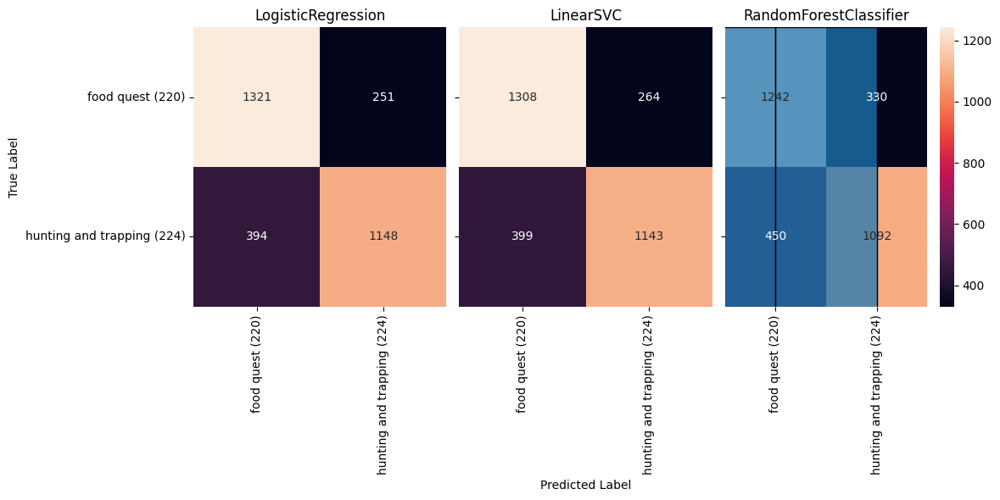

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7886962106615286
              precision    recall  f1-score   support

         220      0.766     0.837     0.800      1572
         224      0.816     0.740     0.776      1542

    accuracy                          0.789      3114
   macro avg      0.791     0.788     0.788      3114
weighted avg      0.791     0.789     0.788      3114



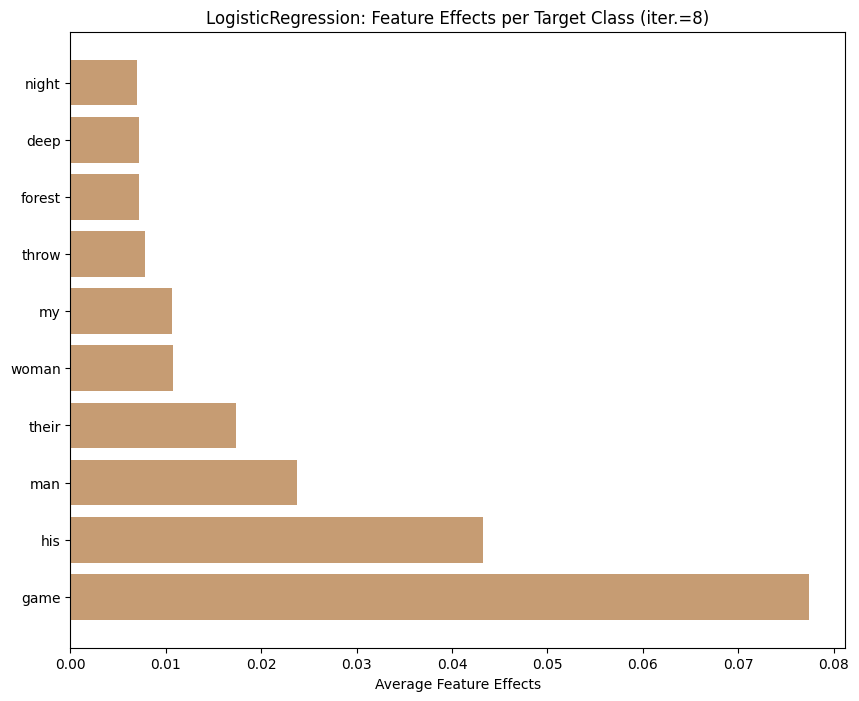

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7883750802825947
              precision    recall  f1-score   support

         220      0.769     0.831     0.799      1572
         224      0.812     0.745     0.777      1542

    accuracy                          0.788      3114
   macro avg      0.790     0.788     0.788      3114
weighted avg      0.790     0.788     0.788      3114



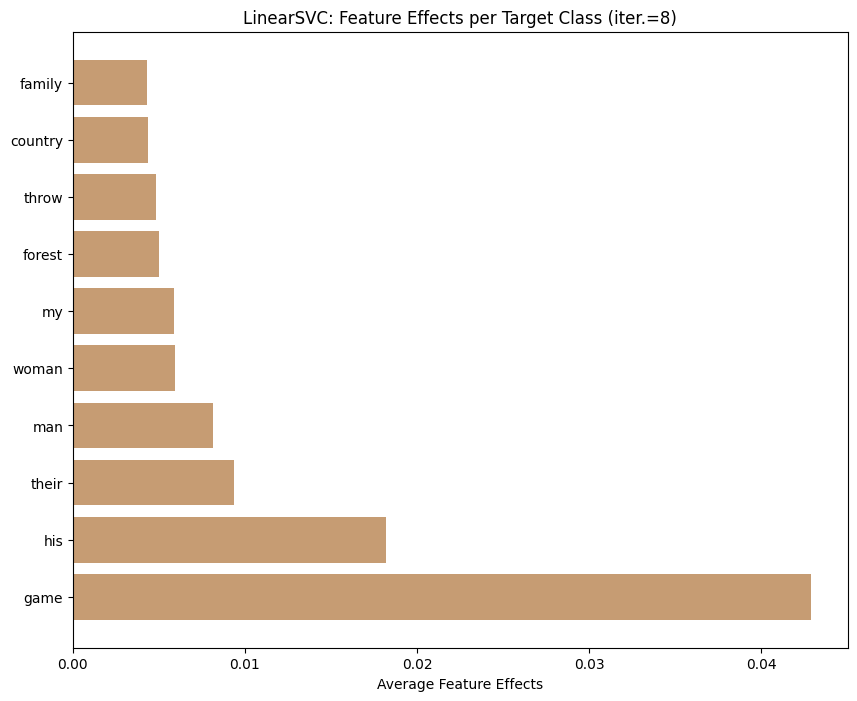

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7385998715478485
              precision    recall  f1-score   support

         220      0.779     0.673     0.722      1572
         224      0.707     0.805     0.753      1542

    accuracy                          0.739      3114
   macro avg      0.743     0.739     0.738      3114
weighted avg      0.744     0.739     0.738      3114



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


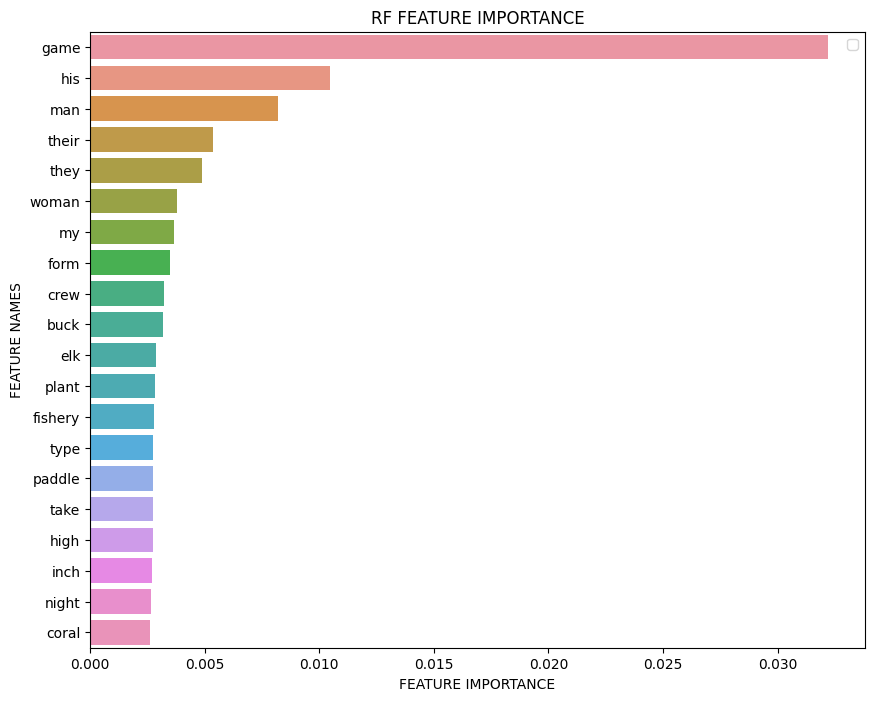

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'my', 'crew', 'man'}
Iteration 10
Exclude: {'native', 'pool', 'inch', 'shallow', 'fisherman', 'bird', 'cut', 'country', 'deep', 'seal', 'pull', 'squirrel', 'plant', 'turtle', 'elephant', 'surface', 'indians', 'ground', 'large', 'cast', 'coconut', 'give', 'shore', 'shark', 'swim', 'throw', 'fox', 'lake', 'bear', 'length', 'wild', 'gun', 'basket', 'fly', 'haul', 'season', 'method', 'begin', 'elk', 'fruit', 'coast', 'arrow', 'scoop', 'bison', 'cover', 'hole', 'high', 'go', 'run', 'trap', 'fall', 'harpoon', 'bait', 'end', 'buffalo', 'tree', 'family', 'dip', 'school', 'pig', 'collect', 'rat', 'whale', 'caribou', 'type', 'camp', 'fish', 'weir', 'beast', 'spear', 'rock', 'describe', 'water', 'eel', 'coral', 'come', 'call', 'sinker', 'say', 'seine', 'river', 'fire', 'trail', 'stick', 'trout', 'deadfall', 'net', 'deer', 'mouth', 'hook', 'beaver', 'form', 'stream', 'shell', 'bring', 'term', 'carcass', 'reindeer', 'hold', 'trapper', 'night', 'dive', 'mesh

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(10378,) (10378,)
10378 documents - 4.92MB (training set)
2 categories


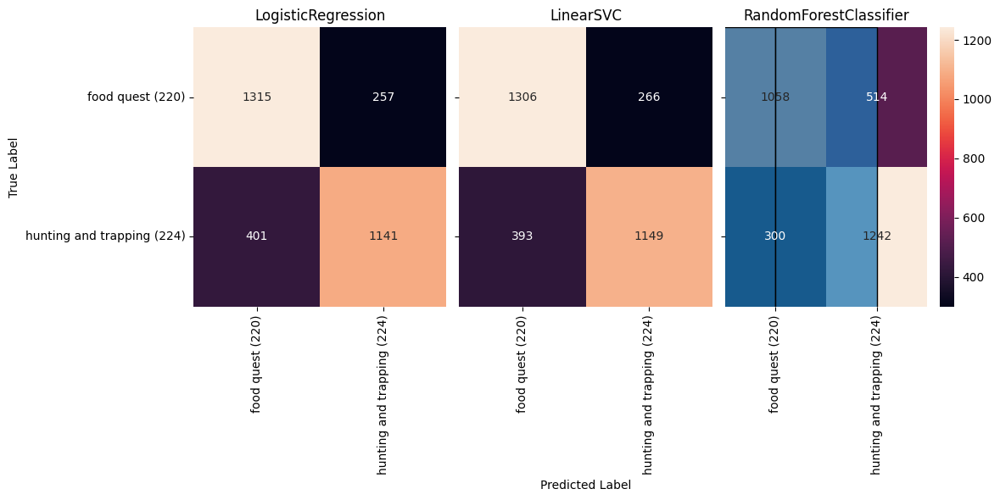

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7838792549775209
              precision    recall  f1-score   support

         220      0.761     0.833     0.796      1572
         224      0.812     0.733     0.771      1542

    accuracy                          0.784      3114
   macro avg      0.787     0.783     0.783      3114
weighted avg      0.786     0.784     0.783      3114



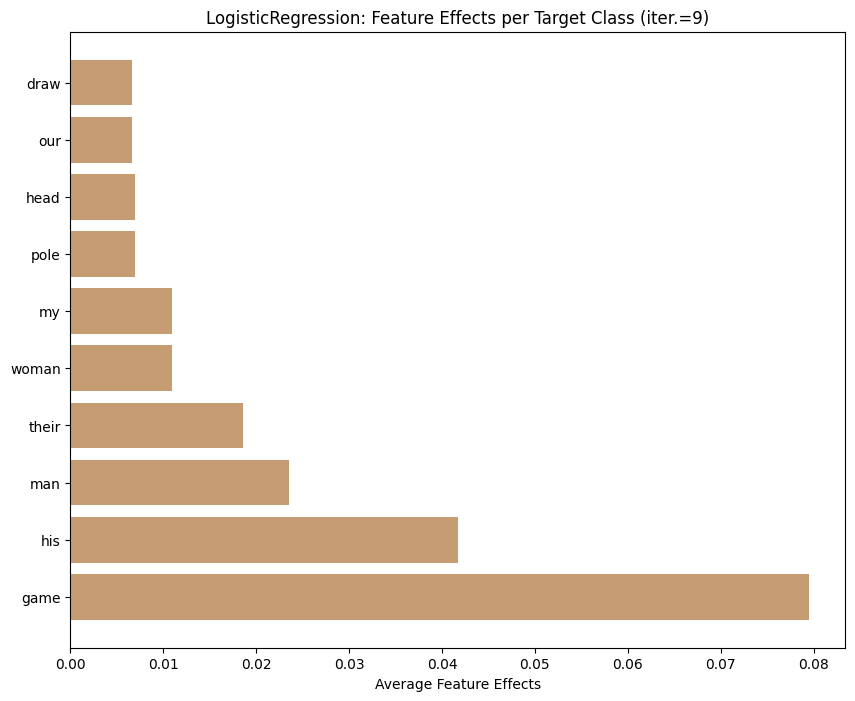

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7822736030828517
              precision    recall  f1-score   support

         220      0.764     0.823     0.792      1572
         224      0.804     0.741     0.771      1542

    accuracy                          0.782      3114
   macro avg      0.784     0.782     0.782      3114
weighted avg      0.784     0.782     0.782      3114



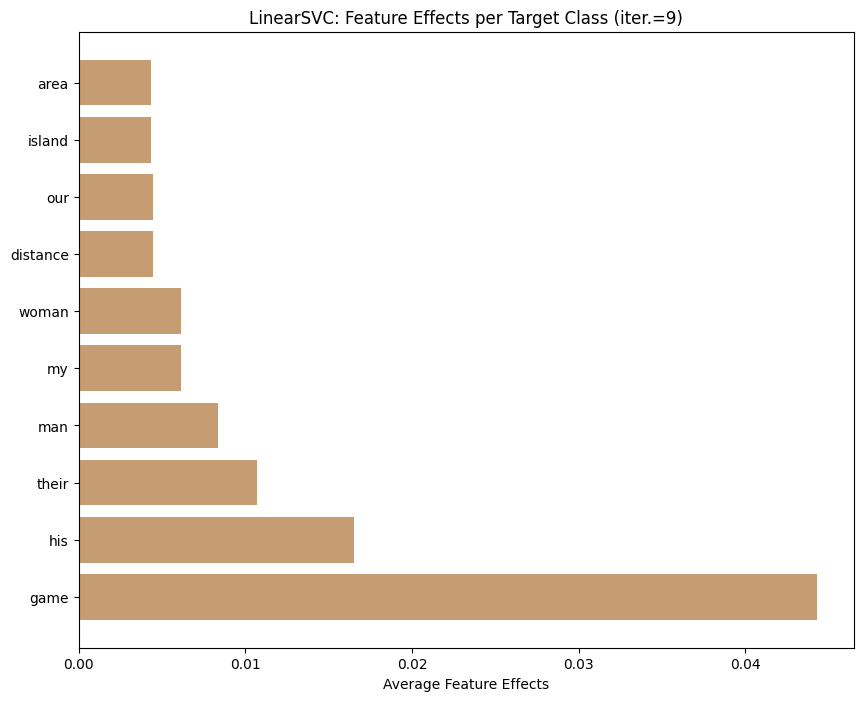

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7363519588953115
              precision    recall  f1-score   support

         220      0.778     0.669     0.719      1572
         224      0.705     0.805     0.751      1542

    accuracy                          0.736      3114
   macro avg      0.741     0.737     0.735      3114
weighted avg      0.741     0.736     0.735      3114



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


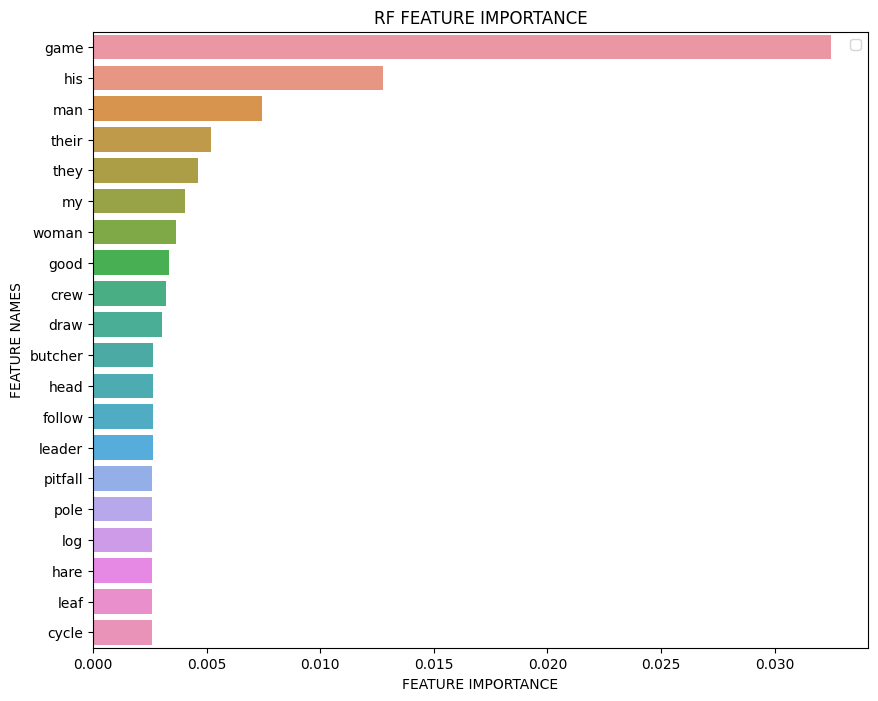

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'my', 'crew', 'our', 'man'}
Iteration 1
Exclude: set()



C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(12990,) (12990,)
12990 documents - 6.34MB (training set)
2 categories


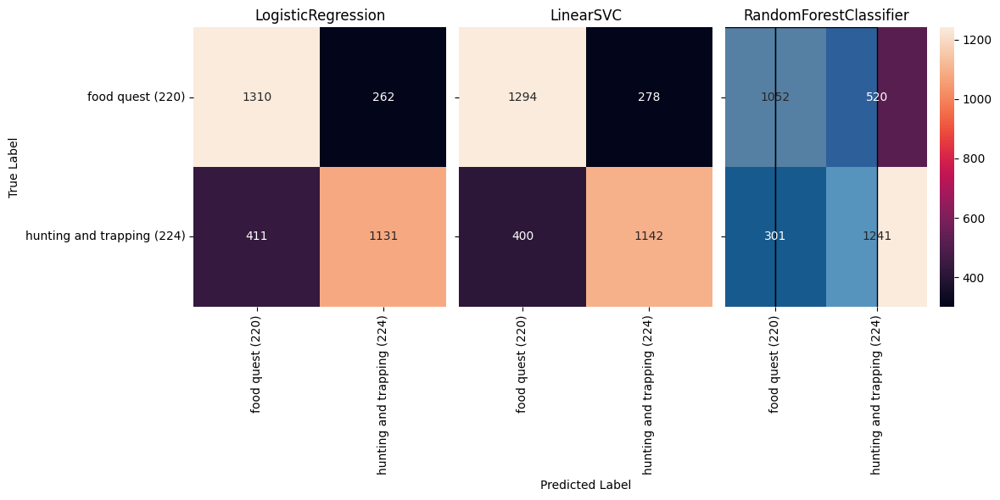

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8519373877341545
              precision    recall  f1-score   support

         220      0.917     0.777     0.841      1967
         226      0.803     0.928     0.861      1930

    accuracy                          0.852      3897
   macro avg      0.860     0.853     0.851      3897
weighted avg      0.861     0.852     0.851      3897



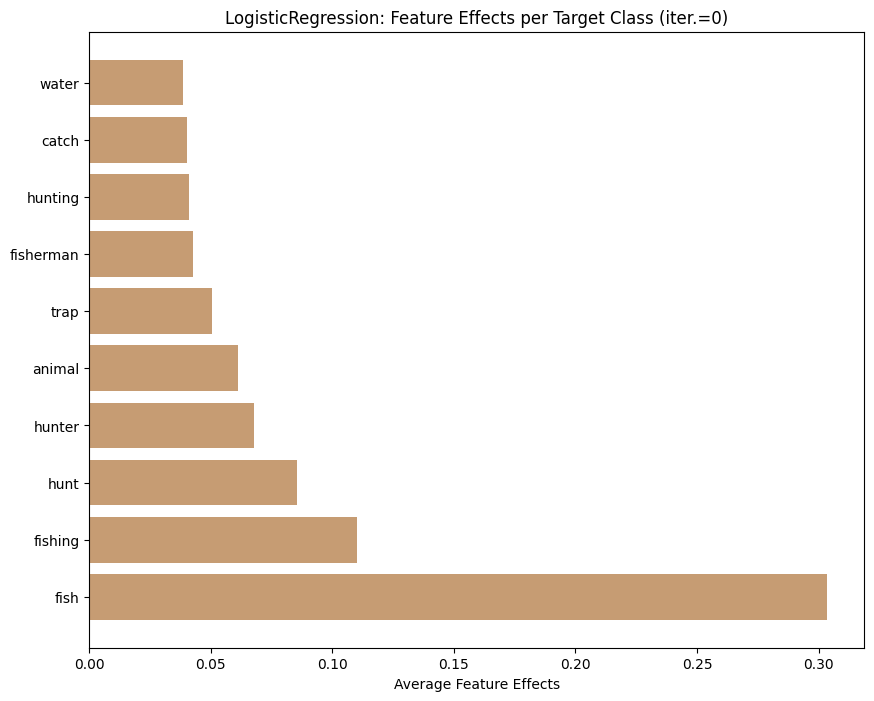

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8357711059789582
              precision    recall  f1-score   support

         220      0.893     0.767     0.825      1967
         226      0.792     0.906     0.845      1930

    accuracy                          0.836      3897
   macro avg      0.842     0.836     0.835      3897
weighted avg      0.843     0.836     0.835      3897



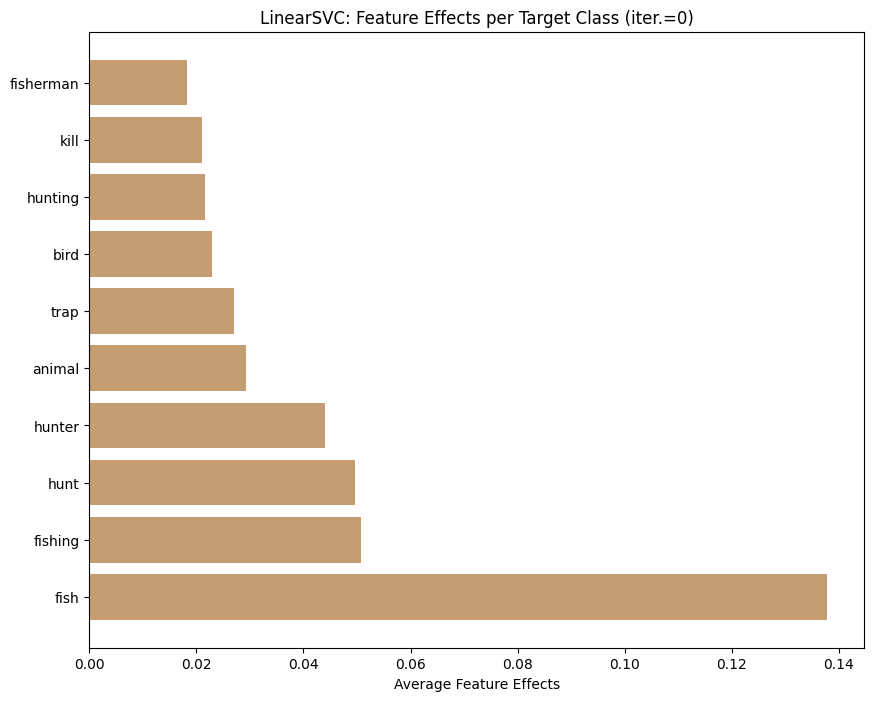

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8434693353861945
              precision    recall  f1-score   support

         220      0.913     0.762     0.831      1967
         226      0.793     0.926     0.854      1930

    accuracy                          0.843      3897
   macro avg      0.853     0.844     0.843      3897
weighted avg      0.854     0.843     0.842      3897



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


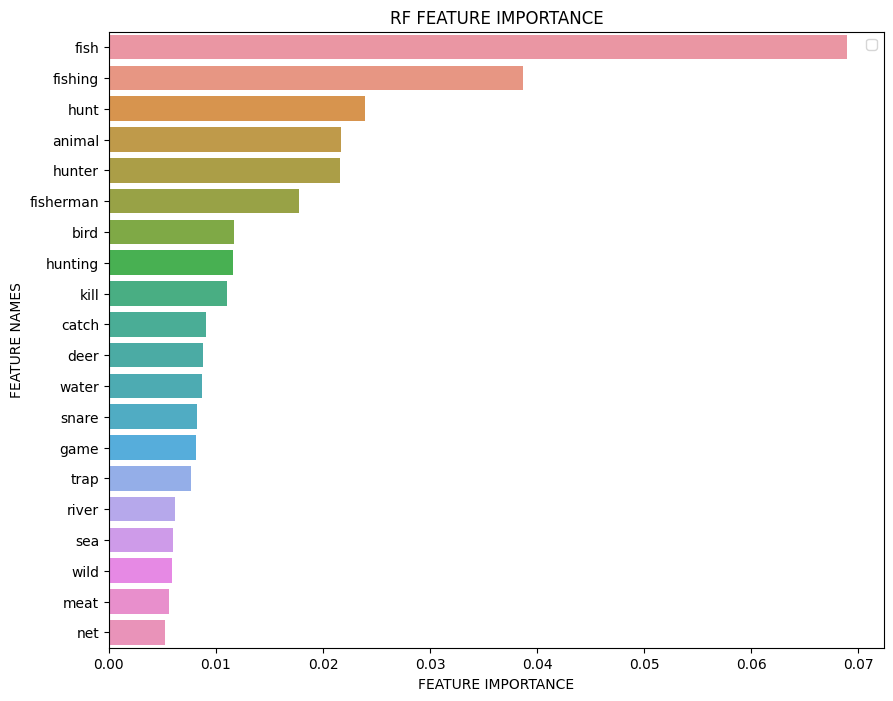

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'game'}
Iteration 2
Exclude: {'hunter', 'fisherman', 'bird', 'meat', 'hunting', 'fish', 'water', 'river', 'wild', 'catch', 'net', 'deer', 'snare', 'animal', 'fishing', 'sea', 'kill', 'hunt', 'trap'}



C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(12990,) (12990,)
12990 documents - 6.34MB (training set)
2 categories


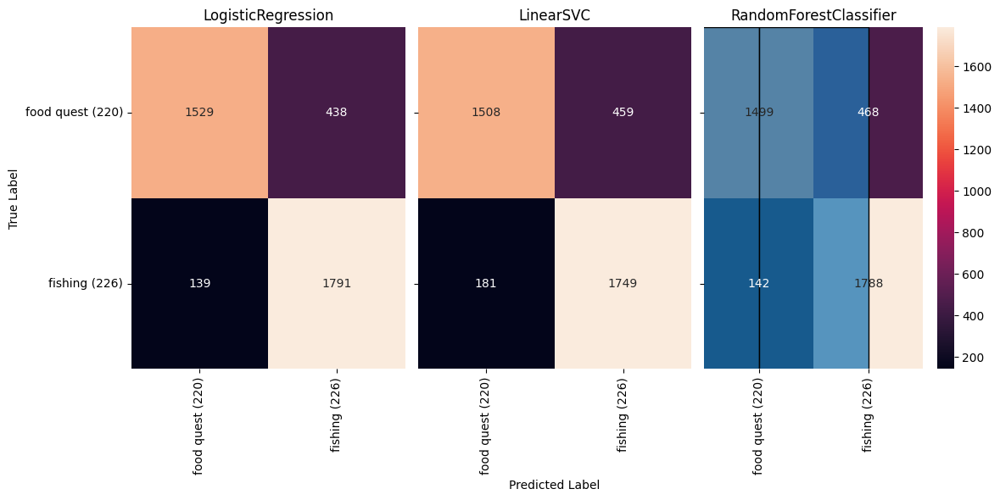

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8008724659994868
              precision    recall  f1-score   support

         220      0.869     0.713     0.783      1967
         226      0.753     0.890     0.816      1930

    accuracy                          0.801      3897
   macro avg      0.811     0.802     0.800      3897
weighted avg      0.811     0.801     0.799      3897



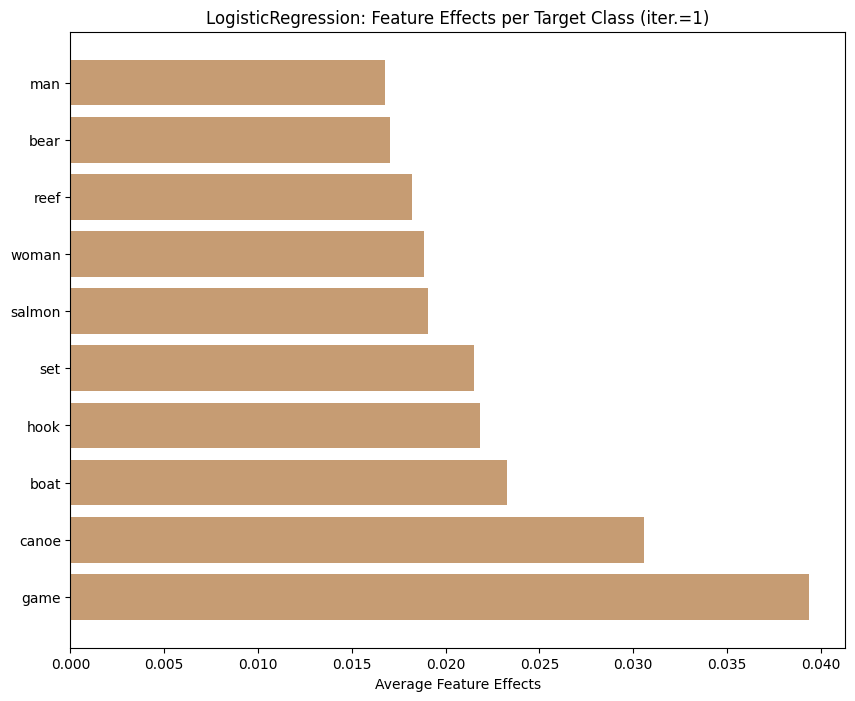

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.791891198357711
              precision    recall  f1-score   support

         220      0.842     0.724     0.778      1967
         226      0.754     0.861     0.804      1930

    accuracy                          0.792      3897
   macro avg      0.798     0.793     0.791      3897
weighted avg      0.798     0.792     0.791      3897



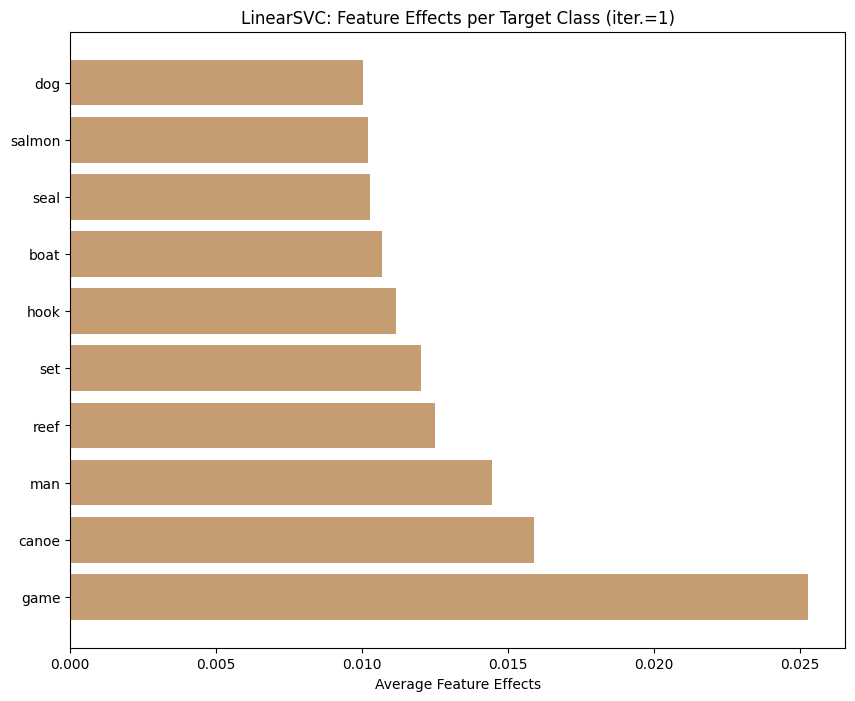

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7749550936617912
              precision    recall  f1-score   support

         220      0.834     0.691     0.756      1967
         226      0.732     0.860     0.791      1930

    accuracy                          0.775      3897
   macro avg      0.783     0.776     0.774      3897
weighted avg      0.784     0.775     0.773      3897



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


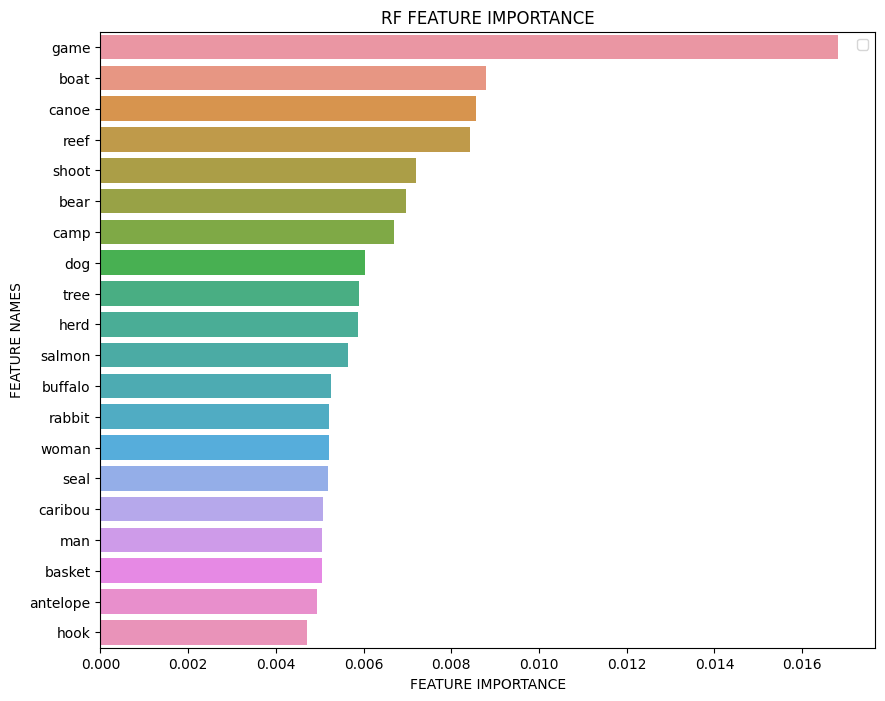

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'man', 'game', 'woman'}
Iteration 3
Exclude: {'buffalo', 'hunter', 'tree', 'fisherman', 'bird', 'herd', 'meat', 'seal', 'boat', 'hunting', 'caribou', 'camp', 'fish', 'shoot', 'water', 'set', 'rabbit', 'river', 'bear', 'wild', 'basket', 'canoe', 'catch', 'net', 'salmon', 'deer', 'hook', 'snare', 'animal', 'reef', 'antelope', 'dog', 'fishing', 'sea', 'kill', 'hunt', 'trap'}



C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(12990,) (12990,)
12990 documents - 6.34MB (training set)
2 categories


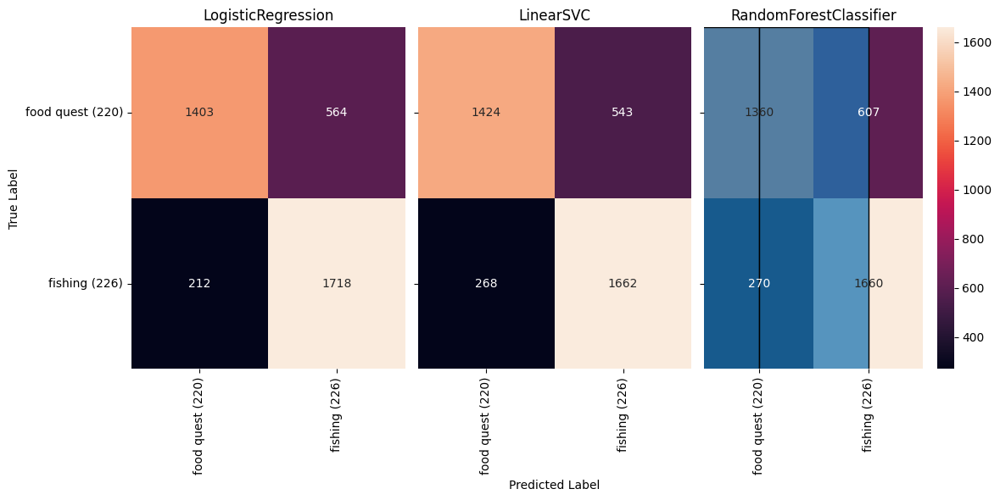

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7959969207082371
              precision    recall  f1-score   support

         220      0.864     0.707     0.778      1967
         226      0.748     0.887     0.811      1930

    accuracy                          0.796      3897
   macro avg      0.806     0.797     0.795      3897
weighted avg      0.807     0.796     0.794      3897



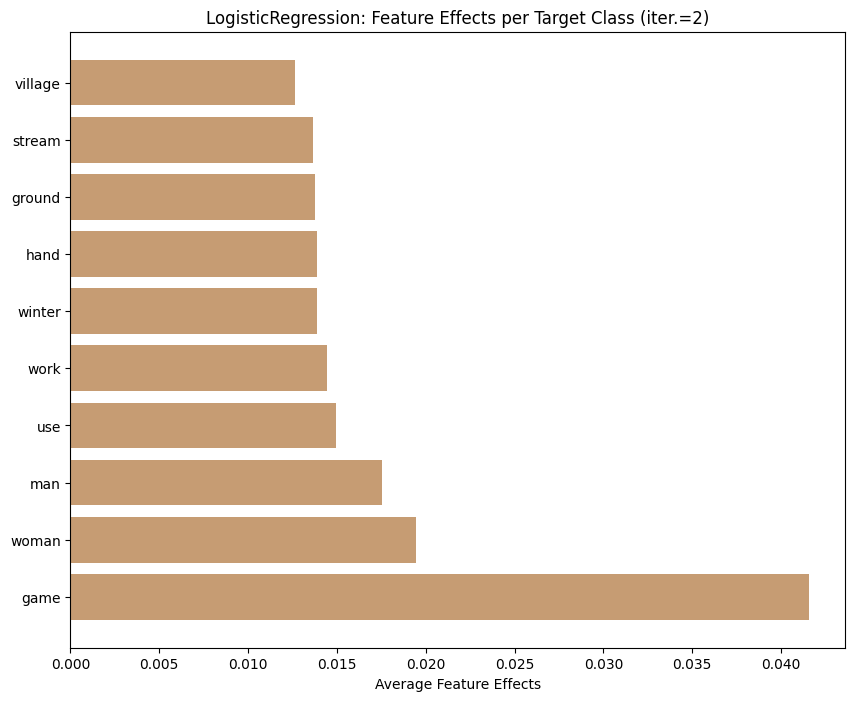

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.789838337182448
              precision    recall  f1-score   support

         220      0.840     0.720     0.776      1967
         226      0.751     0.861     0.802      1930

    accuracy                          0.790      3897
   macro avg      0.796     0.791     0.789      3897
weighted avg      0.796     0.790     0.789      3897



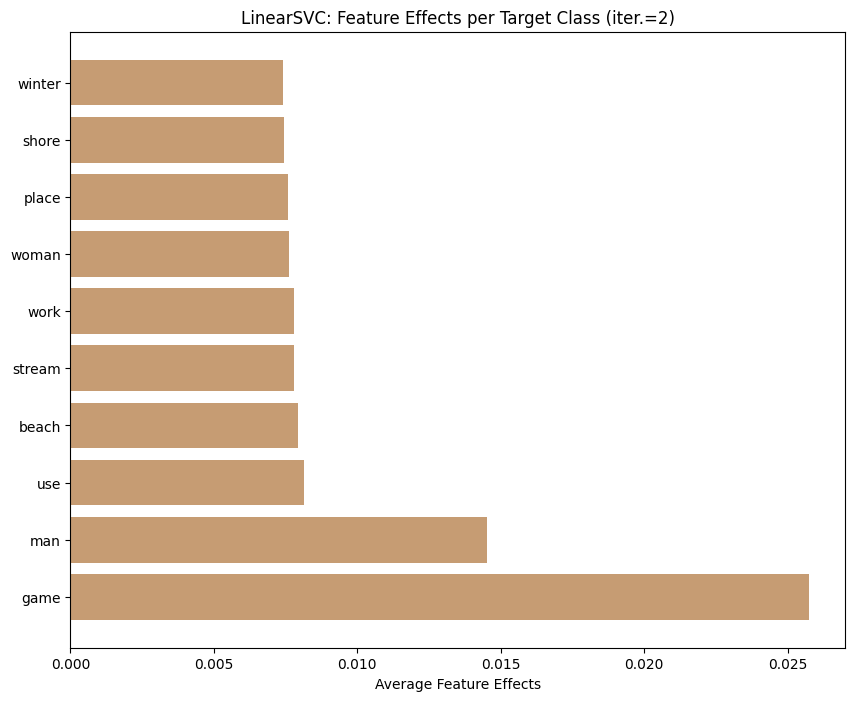

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7585322042596869
              precision    recall  f1-score   support

         220      0.811     0.680     0.740      1967
         226      0.720     0.839     0.775      1930

    accuracy                          0.759      3897
   macro avg      0.766     0.759     0.757      3897
weighted avg      0.766     0.759     0.757      3897



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


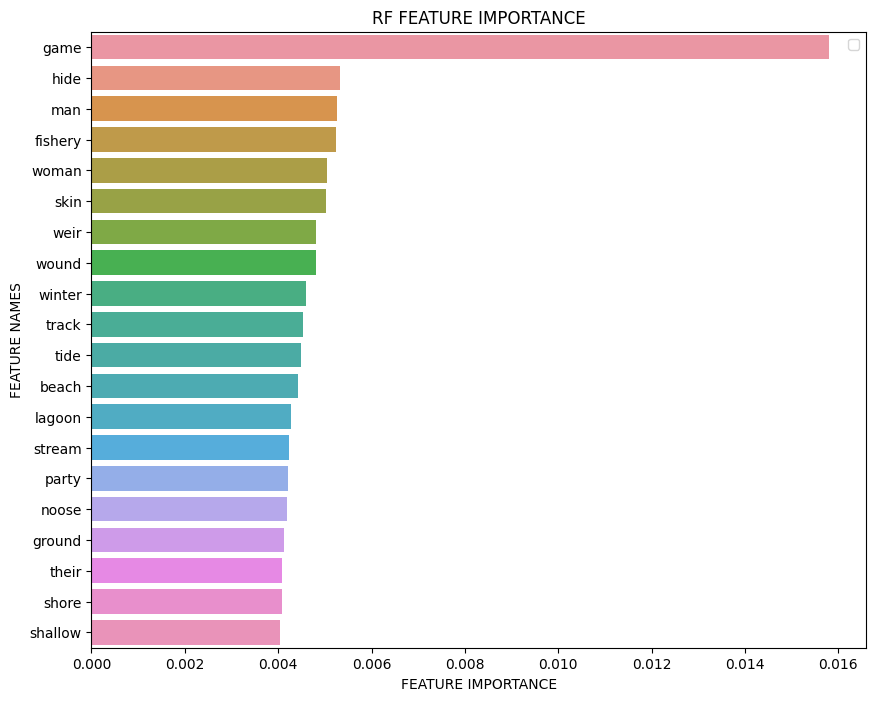

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'their', 'man', 'game', 'woman'}
Iteration 4
Exclude: {'buffalo', 'hunter', 'tree', 'shallow', 'village', 'fisherman', 'bird', 'tide', 'herd', 'meat', 'work', 'seal', 'lagoon', 'boat', 'hunting', 'caribou', 'camp', 'fish', 'weir', 'shoot', 'place', 'ground', 'water', 'fishery', 'set', 'rabbit', 'shore', 'hide', 'skin', 'river', 'beach', 'bear', 'use', 'wild', 'basket', 'winter', 'canoe', 'catch', 'noose', 'party', 'net', 'salmon', 'deer', 'hook', 'snare', 'animal', 'reef', 'track', 'antelope', 'stream', 'dog', 'fishing', 'hand', 'sea', 'kill', 'wound', 'hunt', 'trap'}



C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(12990,) (12990,)
12990 documents - 6.34MB (training set)
2 categories


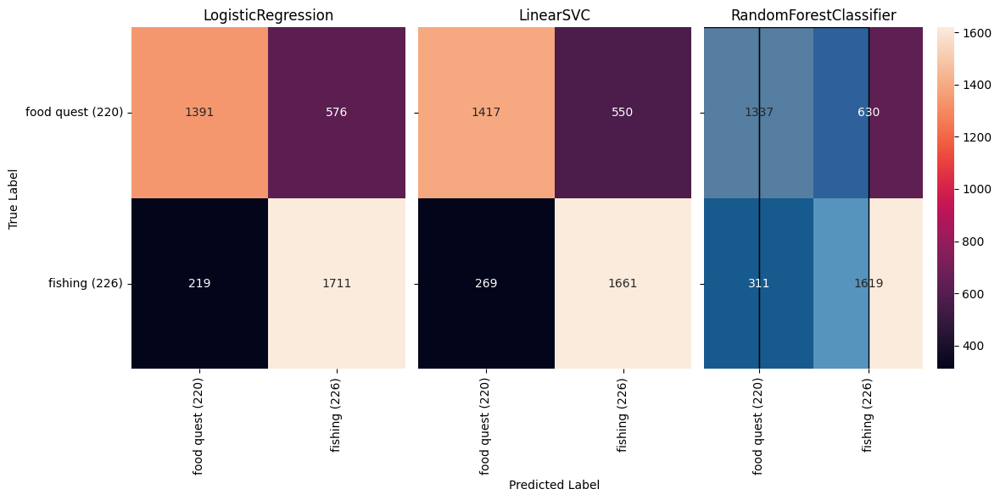

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7934308442391583
              precision    recall  f1-score   support

         220      0.863     0.703     0.774      1967
         226      0.745     0.886     0.809      1930

    accuracy                          0.793      3897
   macro avg      0.804     0.794     0.792      3897
weighted avg      0.804     0.793     0.792      3897



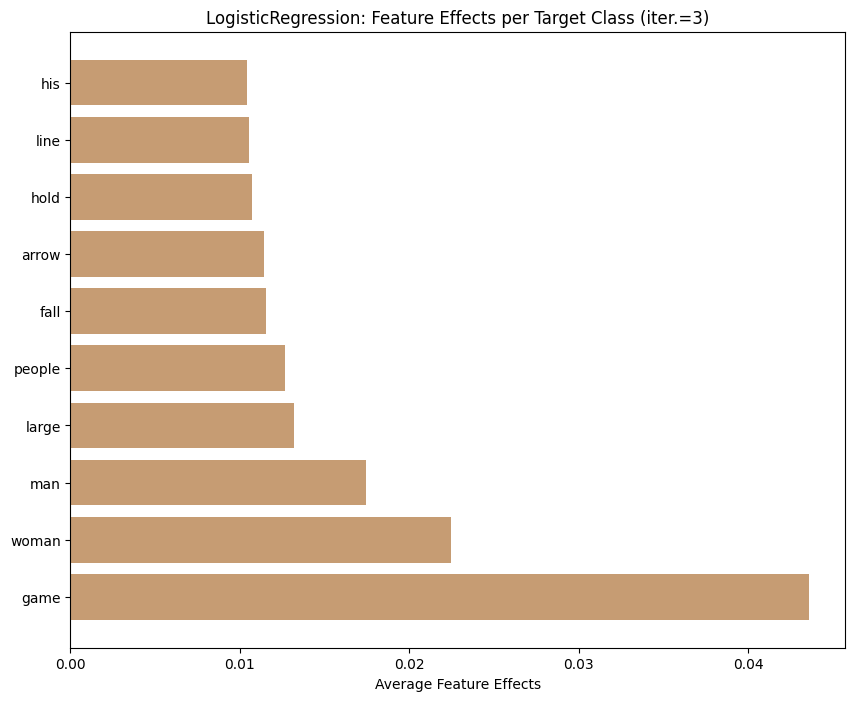

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7906081601231717
              precision    recall  f1-score   support

         220      0.838     0.725     0.778      1967
         226      0.754     0.858     0.802      1930

    accuracy                          0.791      3897
   macro avg      0.796     0.791     0.790      3897
weighted avg      0.796     0.791     0.790      3897



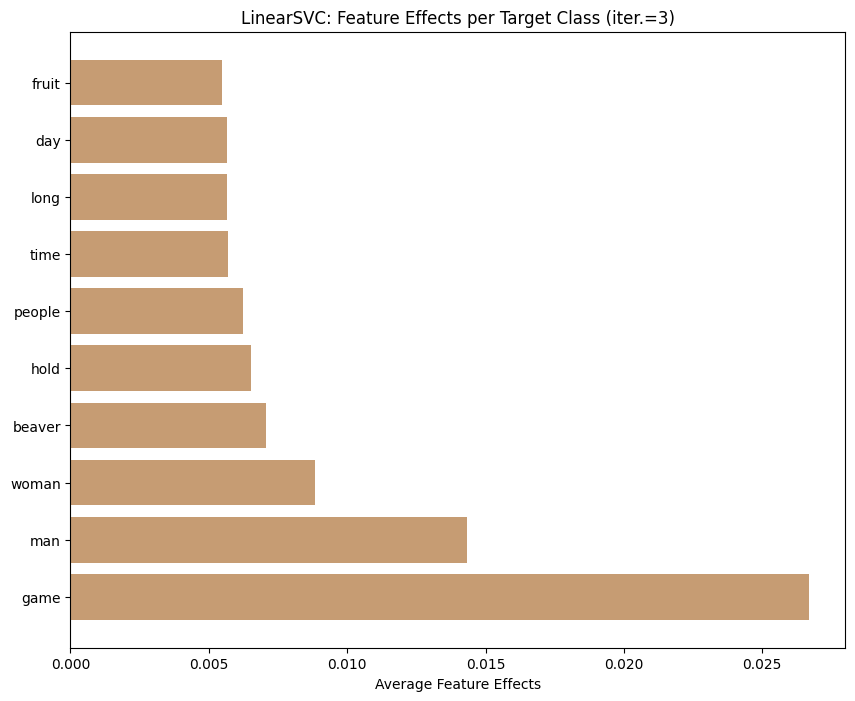

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7557095201437003
              precision    recall  f1-score   support

         220      0.808     0.677     0.737      1967
         226      0.718     0.836     0.772      1930

    accuracy                          0.756      3897
   macro avg      0.763     0.756     0.754      3897
weighted avg      0.763     0.756     0.754      3897



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


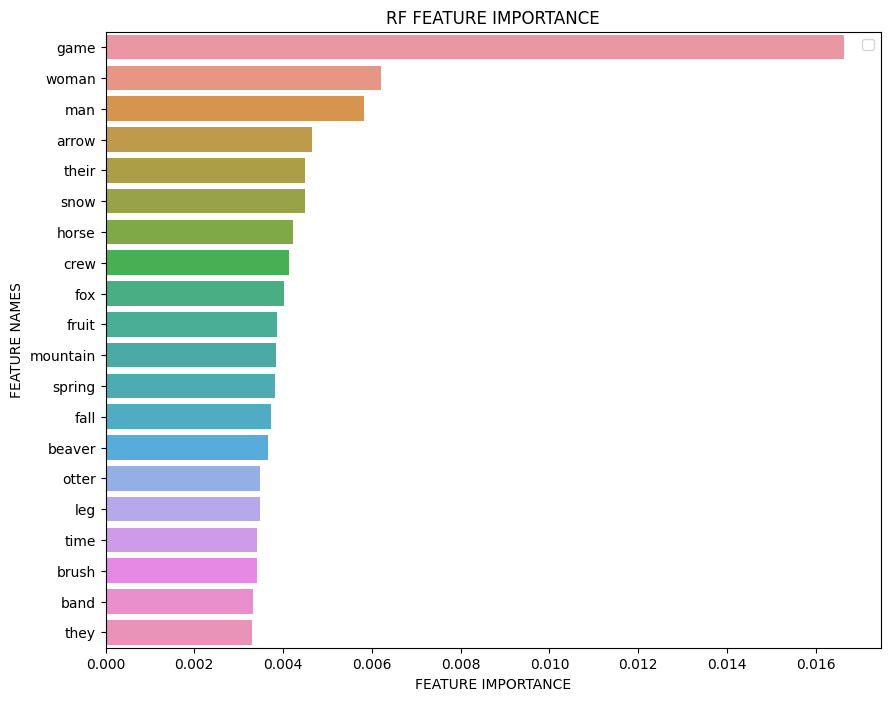

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'crew', 'man'}
Iteration 5
Exclude: {'shallow', 'fisherman', 'bird', 'seal', 'people', 'ground', 'large', 'shore', 'fox', 'bear', 'wild', 'basket', 'winter', 'fruit', 'arrow', 'brush', 'wound', 'trap', 'fall', 'leg', 'buffalo', 'tree', 'caribou', 'camp', 'fish', 'weir', 'water', 'river', 'net', 'deer', 'hook', 'beaver', 'stream', 'hold', 'snow', 'meat', 'work', 'boat', 'day', 'set', 'mountain', 'hide', 'skin', 'use', 'catch', 'noose', 'party', 'antelope', 'dog', 'time', 'horse', 'hunter', 'village', 'tide', 'line', 'herd', 'band', 'lagoon', 'hunting', 'shoot', 'place', 'fishery', 'rabbit', 'beach', 'long', 'otter', 'canoe', 'salmon', 'snare', 'animal', 'reef', 'track', 'spring', 'fishing', 'hand', 'sea', 'kill', 'hunt'}



C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(12990,) (12990,)
12990 documents - 6.34MB (training set)
2 categories


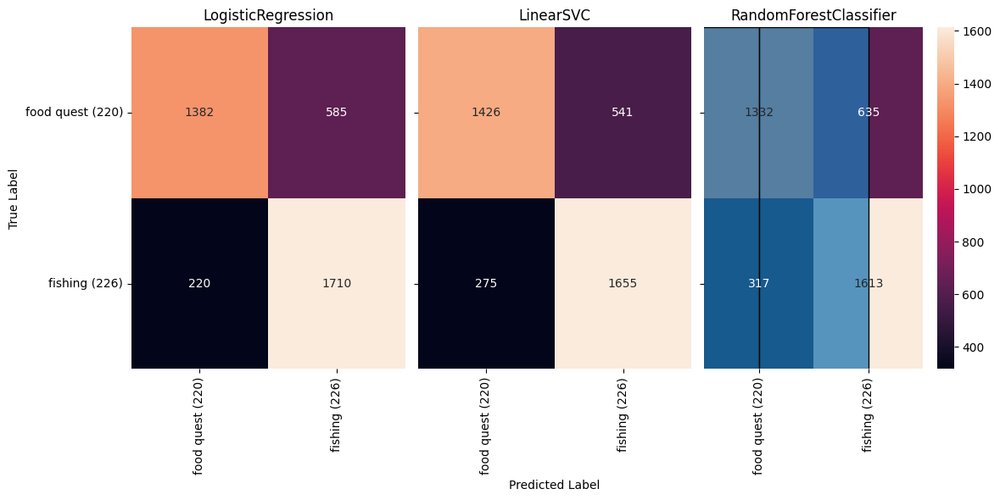

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7823967154221195
              precision    recall  f1-score   support

         220      0.849     0.691     0.762      1967
         226      0.736     0.875     0.799      1930

    accuracy                          0.782      3897
   macro avg      0.793     0.783     0.781      3897
weighted avg      0.793     0.782     0.781      3897



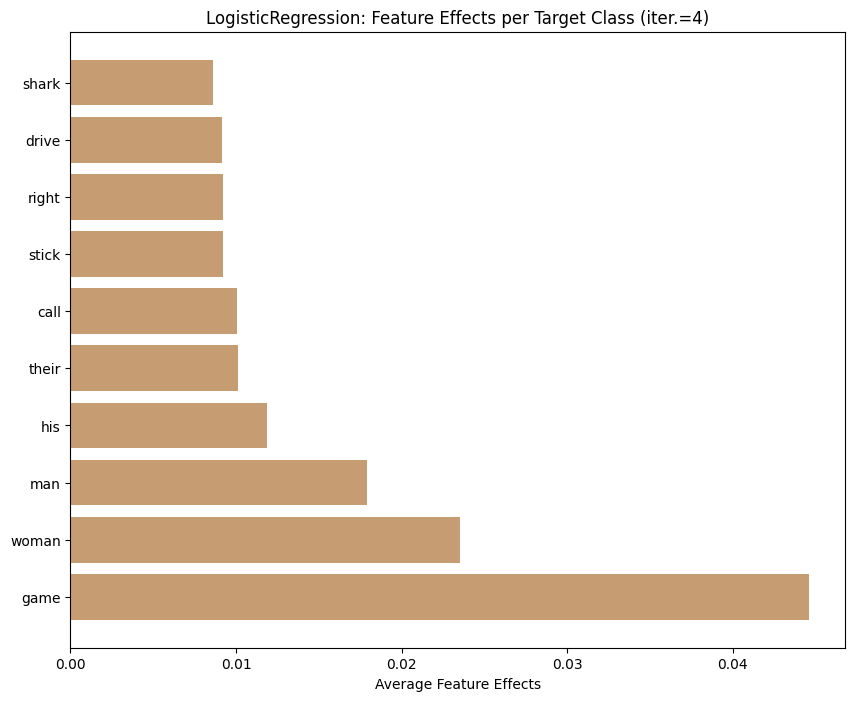

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7793174236592251
              precision    recall  f1-score   support

         220      0.823     0.717     0.766      1967
         226      0.745     0.843     0.791      1930

    accuracy                          0.779      3897
   macro avg      0.784     0.780     0.779      3897
weighted avg      0.784     0.779     0.779      3897



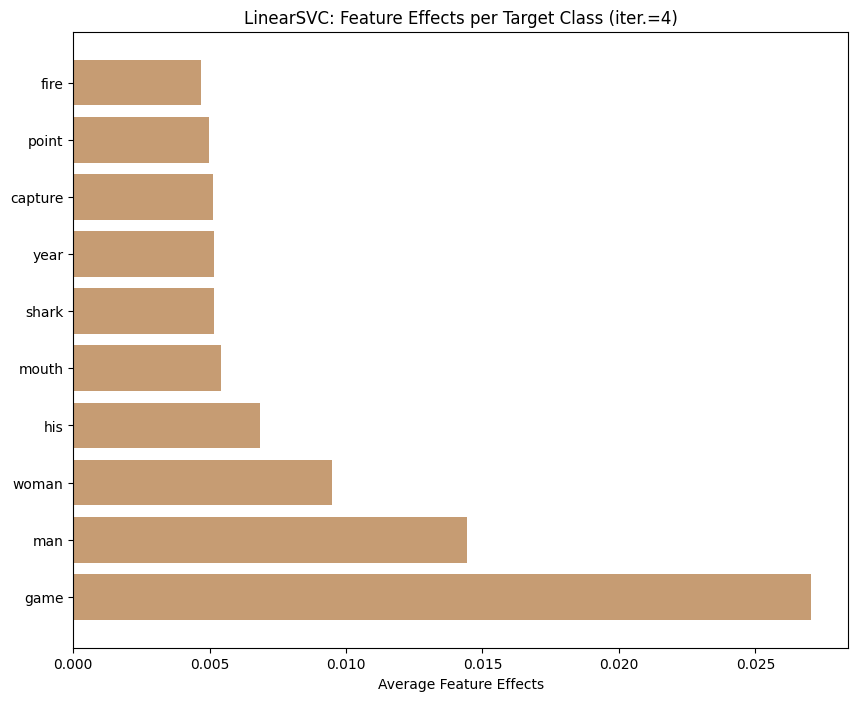

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7490377213240954
              precision    recall  f1-score   support

         220      0.793     0.680     0.732      1967
         226      0.715     0.819     0.764      1930

    accuracy                          0.749      3897
   macro avg      0.754     0.750     0.748      3897
weighted avg      0.755     0.749     0.748      3897



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


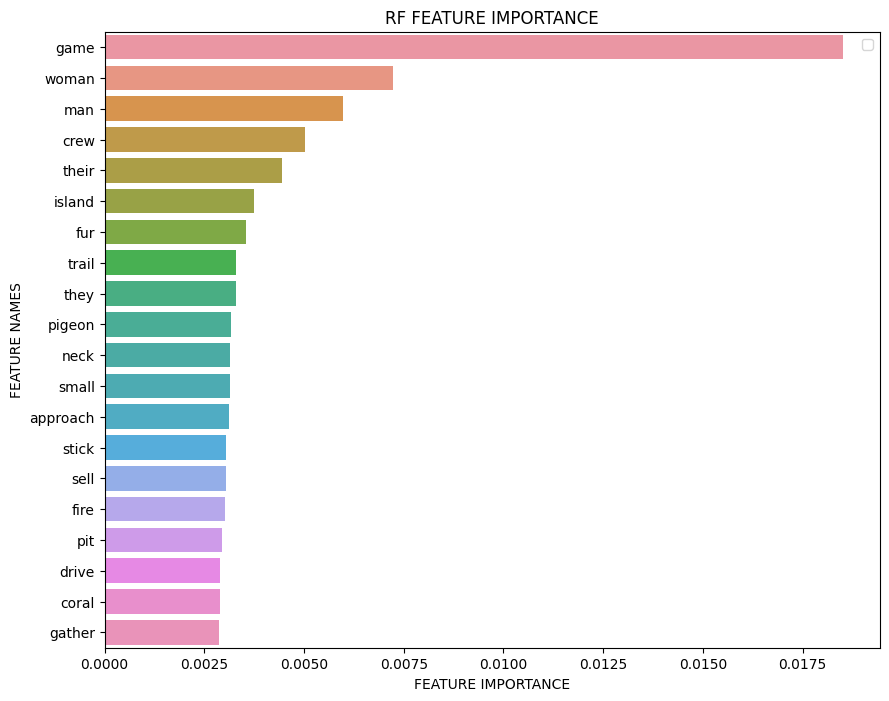

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'crew', 'man'}
Iteration 6
Exclude: {'shallow', 'fisherman', 'bird', 'pit', 'seal', 'people', 'ground', 'large', 'shore', 'shark', 'fox', 'bear', 'wild', 'basket', 'winter', 'neck', 'fruit', 'arrow', 'sell', 'brush', 'island', 'wound', 'trap', 'fall', 'leg', 'buffalo', 'right', 'tree', 'caribou', 'camp', 'fish', 'weir', 'coral', 'water', 'approach', 'call', 'river', 'fire', 'trail', 'stick', 'pigeon', 'net', 'deer', 'mouth', 'hook', 'beaver', 'stream', 'year', 'hold', 'snow', 'meat', 'work', 'boat', 'gather', 'fur', 'day', 'set', 'mountain', 'hide', 'skin', 'use', 'catch', 'noose', 'party', 'antelope', 'dog', 'time', 'horse', 'small', 'hunter', 'village', 'tide', 'line', 'herd', 'band', 'lagoon', 'drive', 'hunting', 'shoot', 'place', 'point', 'fishery', 'rabbit', 'beach', 'long', 'otter', 'canoe', 'salmon', 'snare', 'animal', 'reef', 'track', 'spring', 'fishing', 'hand', 'sea', 'kill', 'hunt', 'capture'}



C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(12990,) (12990,)
12990 documents - 6.34MB (training set)
2 categories


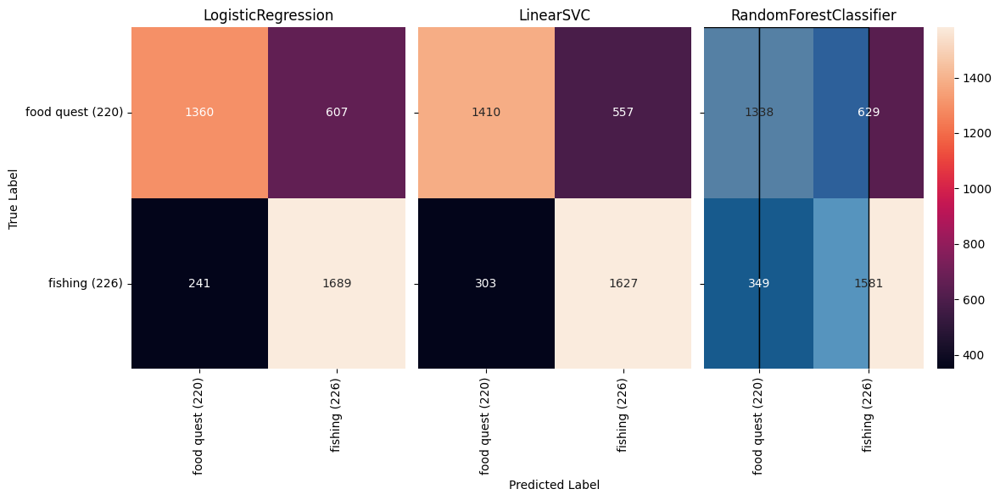

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7800872465999487
              precision    recall  f1-score   support

         220      0.846     0.690     0.760      1967
         226      0.734     0.872     0.797      1930

    accuracy                          0.780      3897
   macro avg      0.790     0.781     0.779      3897
weighted avg      0.791     0.780     0.778      3897



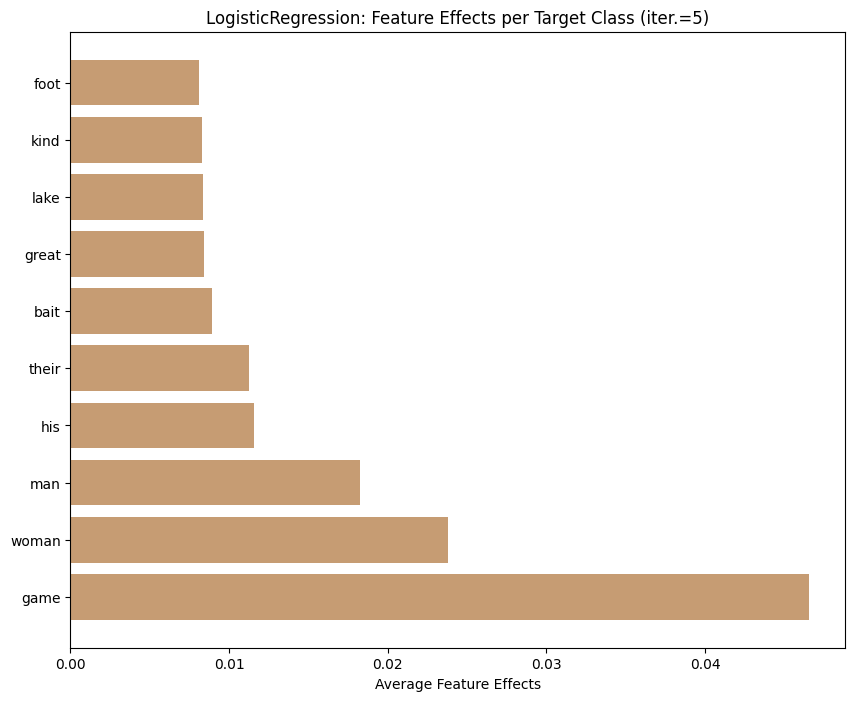

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7775211701308699
              precision    recall  f1-score   support

         220      0.827     0.708     0.763      1967
         226      0.740     0.849     0.791      1930

    accuracy                          0.778      3897
   macro avg      0.783     0.778     0.777      3897
weighted avg      0.784     0.778     0.776      3897



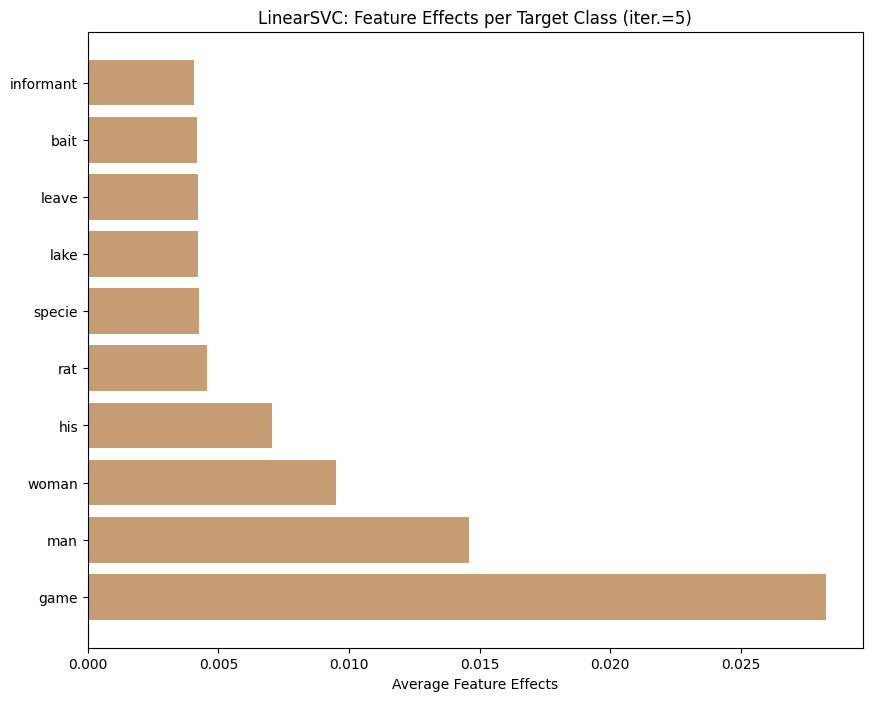

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7431357454452142
              precision    recall  f1-score   support

         220      0.783     0.679     0.727      1967
         226      0.712     0.809     0.757      1930

    accuracy                          0.743      3897
   macro avg      0.748     0.744     0.742      3897
weighted avg      0.748     0.743     0.742      3897



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


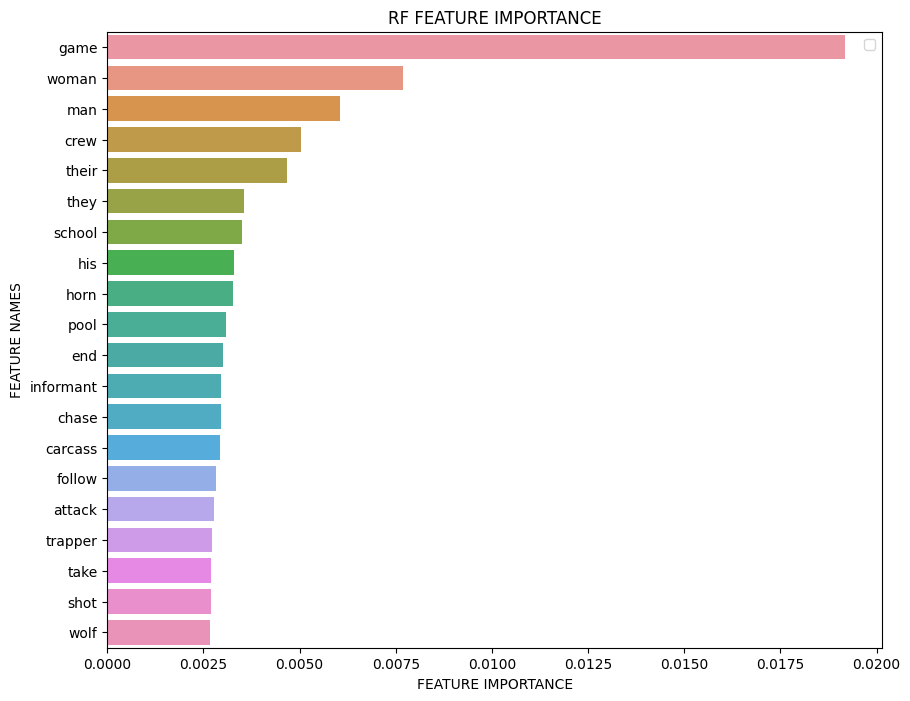

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'crew', 'man'}
Iteration 7
Exclude: {'pool', 'shallow', 'fisherman', 'bird', 'pit', 'seal', 'people', 'ground', 'large', 'shore', 'shark', 'fox', 'lake', 'bear', 'wild', 'basket', 'winter', 'neck', 'fruit', 'arrow', 'sell', 'shot', 'brush', 'wound', 'island', 'trap', 'fall', 'leg', 'bait', 'end', 'buffalo', 'right', 'tree', 'informant', 'school', 'rat', 'caribou', 'camp', 'fish', 'weir', 'coral', 'water', 'approach', 'call', 'great', 'river', 'fire', 'trail', 'stick', 'pigeon', 'net', 'deer', 'mouth', 'hook', 'beaver', 'stream', 'year', 'carcass', 'hold', 'trapper', 'snow', 'meat', 'work', 'boat', 'gather', 'fur', 'day', 'set', 'mountain', 'chase', 'attack', 'hide', 'skin', 'use', 'catch', 'noose', 'party', 'antelope', 'foot', 'leave', 'dog', 'time', 'horse', 'small', 'follow', 'wolf', 'hunter', 'village', 'tide', 'line', 'herd', 'band', 'lagoon', 'drive', 'hunting', 'kind', 'shoot', 'place', 'point', 'fishery', 'rabbit', 'beach', 'long', 'otte

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(12990,) (12990,)
12990 documents - 6.34MB (training set)
2 categories


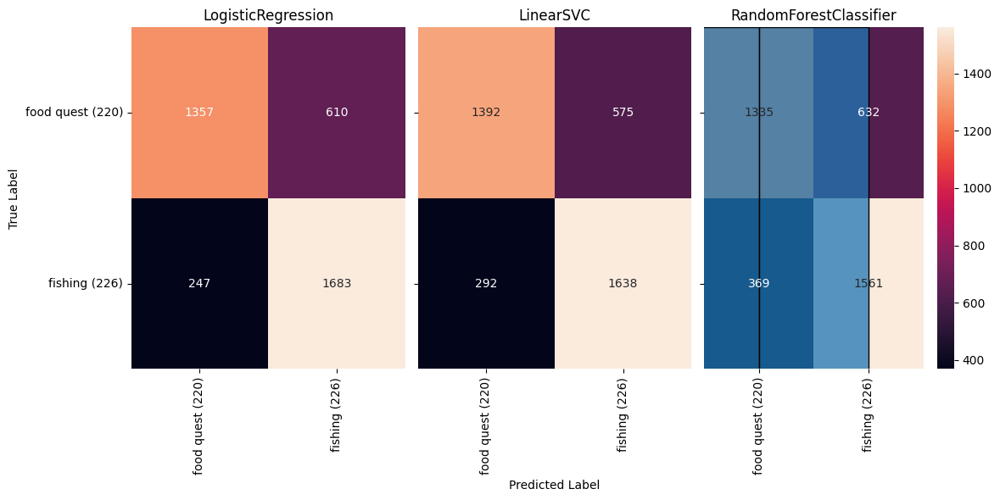

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7788042083654093
              precision    recall  f1-score   support

         220      0.844     0.689     0.759      1967
         226      0.733     0.870     0.796      1930

    accuracy                          0.779      3897
   macro avg      0.788     0.780     0.777      3897
weighted avg      0.789     0.779     0.777      3897



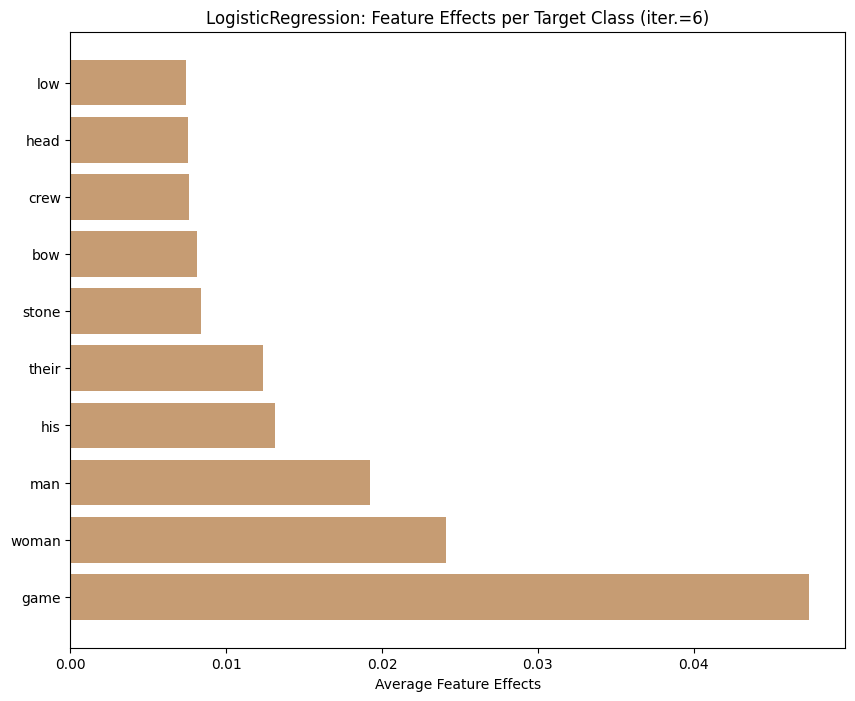

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7759815242494227
              precision    recall  f1-score   support

         220      0.823     0.708     0.761      1967
         226      0.740     0.845     0.789      1930

    accuracy                          0.776      3897
   macro avg      0.781     0.777     0.775      3897
weighted avg      0.782     0.776     0.775      3897



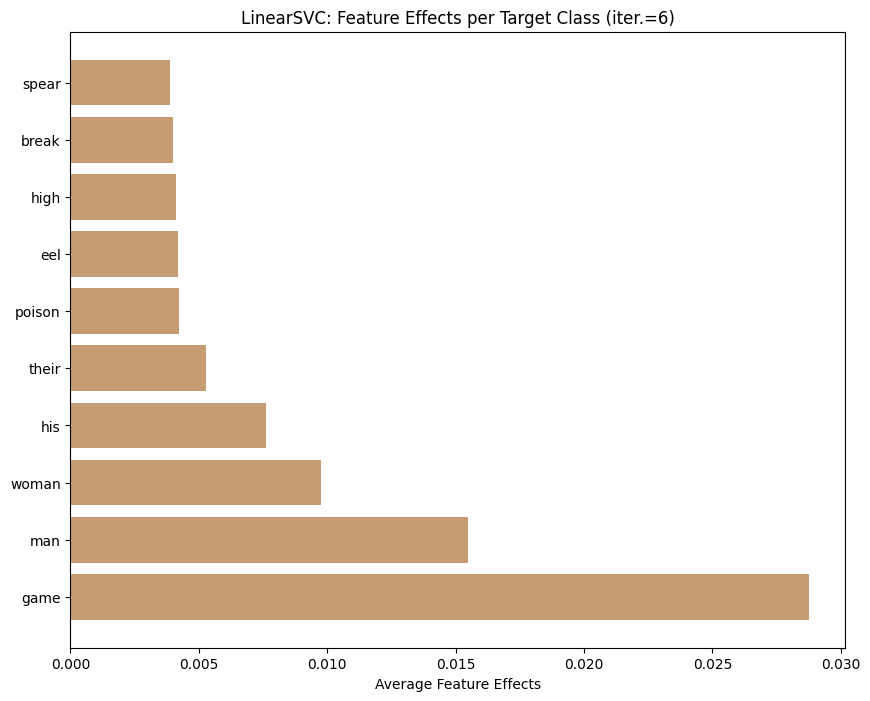

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7392866307415961
              precision    recall  f1-score   support

         220      0.778     0.676     0.724      1967
         226      0.709     0.804     0.753      1930

    accuracy                          0.739      3897
   macro avg      0.744     0.740     0.738      3897
weighted avg      0.744     0.739     0.738      3897



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


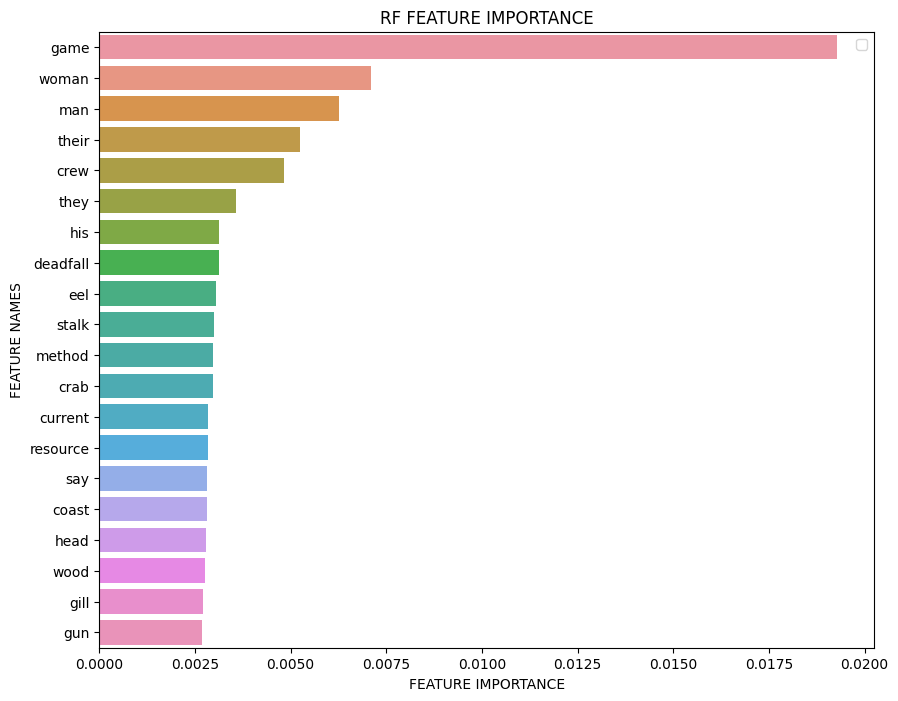

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'crew', 'man'}
Iteration 8
Exclude: {'pool', 'horn', 'shallow', 'fisherman', 'bird', 'pit', 'seal', 'people', 'ground', 'large', 'shore', 'shark', 'fox', 'lake', 'bear', 'wild', 'gun', 'basket', 'winter', 'method', 'neck', 'fruit', 'coast', 'arrow', 'sell', 'shot', 'high', 'brush', 'island', 'wound', 'trap', 'fall', 'leg', 'bait', 'end', 'buffalo', 'right', 'tree', 'informant', 'school', 'poison', 'rat', 'caribou', 'camp', 'fish', 'weir', 'wood', 'spear', 'coral', 'water', 'approach', 'eel', 'current', 'call', 'great', 'say', 'river', 'fire', 'trail', 'stick', 'pigeon', 'deadfall', 'net', 'deer', 'mouth', 'hook', 'break', 'beaver', 'stream', 'year', 'gill', 'carcass', 'hold', 'trapper', 'snow', 'stone', 'head', 'meat', 'work', 'boat', 'gather', 'fur', 'low', 'day', 'set', 'mountain', 'chase', 'attack', 'hide', 'skin', 'use', 'catch', 'noose', 'party', 'stalk', 'antelope', 'foot', 'leave', 'dog', 'time', 'horse', 'small', 'follow', 'wolf', 'hunt

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(12990,) (12990,)
12990 documents - 6.34MB (training set)
2 categories


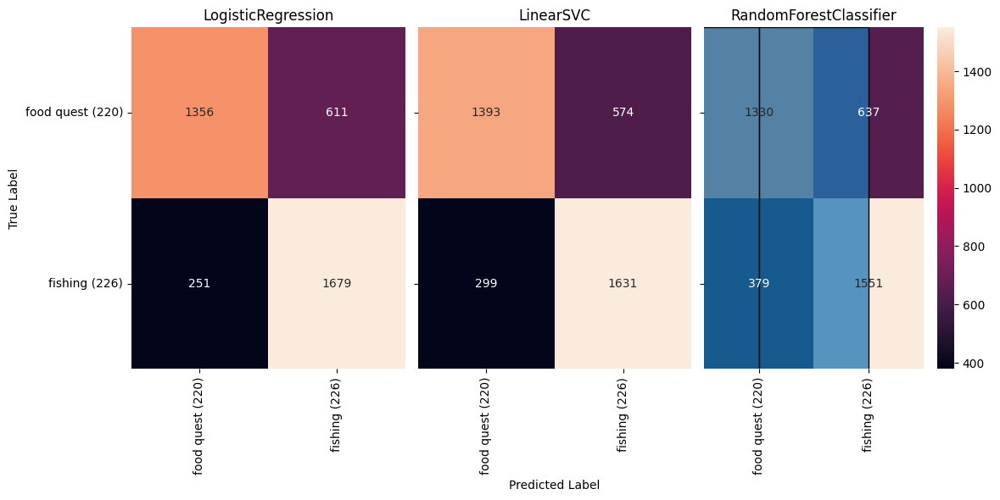

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7780343854246856
              precision    recall  f1-score   support

         220      0.841     0.691     0.759      1967
         226      0.733     0.867     0.795      1930

    accuracy                          0.778      3897
   macro avg      0.787     0.779     0.777      3897
weighted avg      0.788     0.778     0.776      3897



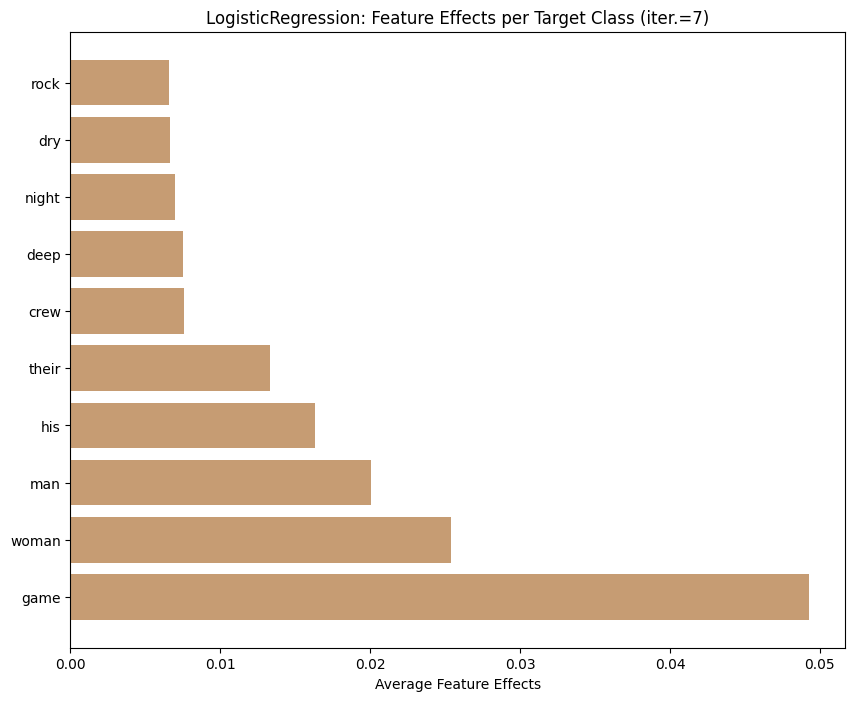

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7705927636643572
              precision    recall  f1-score   support

         220      0.819     0.701     0.755      1967
         226      0.734     0.842     0.784      1930

    accuracy                          0.771      3897
   macro avg      0.776     0.771     0.770      3897
weighted avg      0.777     0.771     0.770      3897



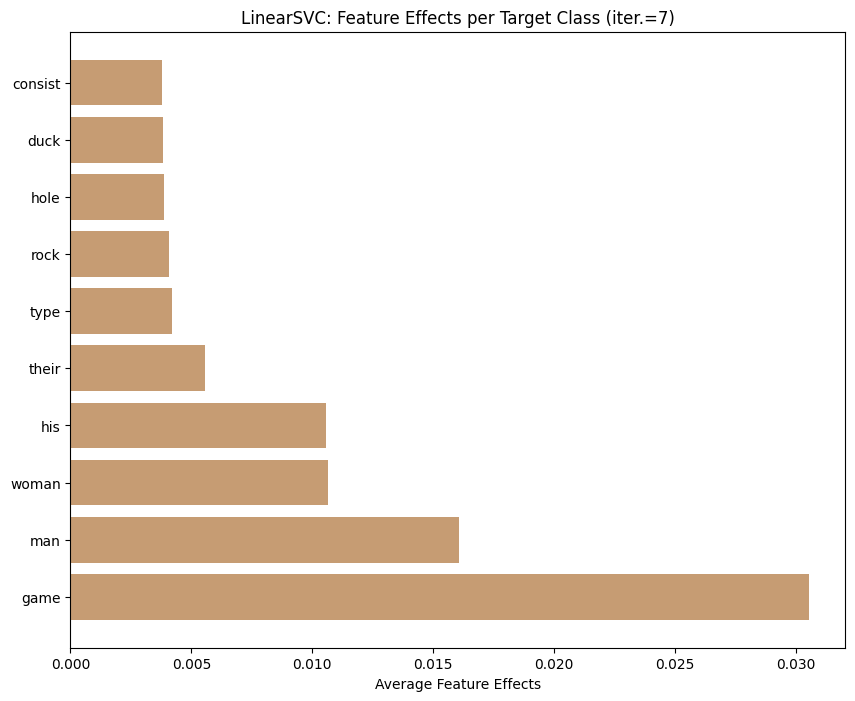

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7372337695663331
              precision    recall  f1-score   support

         220      0.782     0.664     0.719      1967
         226      0.704     0.811     0.754      1930

    accuracy                          0.737      3897
   macro avg      0.743     0.738     0.736      3897
weighted avg      0.743     0.737     0.736      3897



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


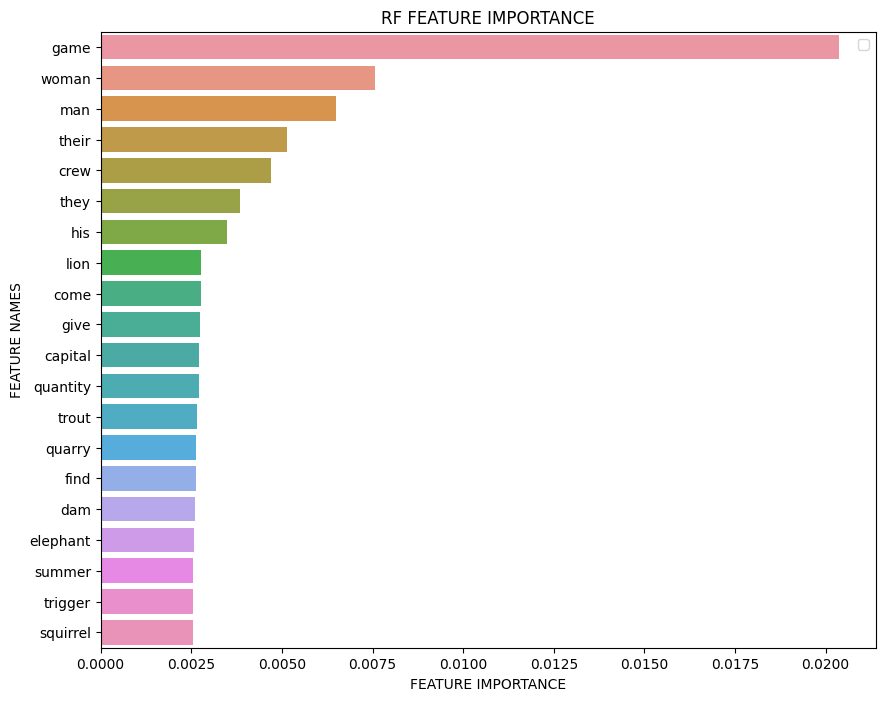

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'crew', 'man'}
Iteration 9
Exclude: {'pool', 'quarry', 'shallow', 'fisherman', 'bird', 'pit', 'deep', 'seal', 'squirrel', 'elephant', 'people', 'ground', 'large', 'give', 'shore', 'shark', 'fox', 'lake', 'bear', 'wild', 'gun', 'basket', 'winter', 'duck', 'method', 'neck', 'fruit', 'coast', 'arrow', 'trigger', 'sell', 'shot', 'high', 'hole', 'brush', 'wound', 'island', 'trap', 'fall', 'leg', 'bait', 'end', 'buffalo', 'right', 'tree', 'informant', 'school', 'poison', 'rat', 'caribou', 'type', 'camp', 'fish', 'weir', 'wood', 'spear', 'rock', 'coral', 'water', 'approach', 'eel', 'current', 'come', 'call', 'great', 'say', 'river', 'fire', 'trail', 'dry', 'stick', 'trout', 'pigeon', 'deadfall', 'net', 'deer', 'mouth', 'hook', 'break', 'beaver', 'stream', 'year', 'gill', 'carcass', 'hold', 'trapper', 'dam', 'night', 'snow', 'stone', 'head', 'meat', 'work', 'boat', 'gather', 'fur', 'low', 'day', 'set', 'mountain', 'chase', 'attack', 'hide', 'skin', 'us

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(12990,) (12990,)
12990 documents - 6.34MB (training set)
2 categories


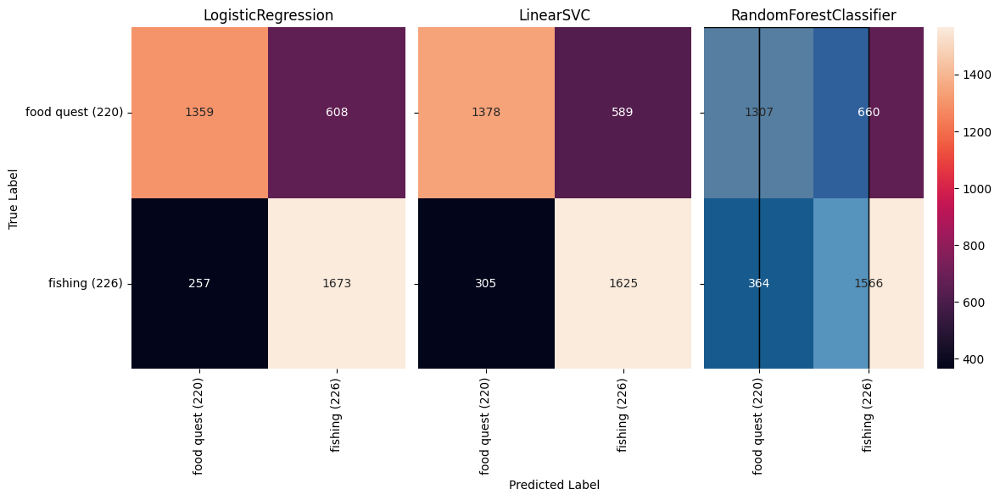

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7744418783679754
              precision    recall  f1-score   support

         220      0.837     0.686     0.754      1967
         226      0.730     0.864     0.791      1930

    accuracy                          0.774      3897
   macro avg      0.784     0.775     0.773      3897
weighted avg      0.784     0.774     0.773      3897



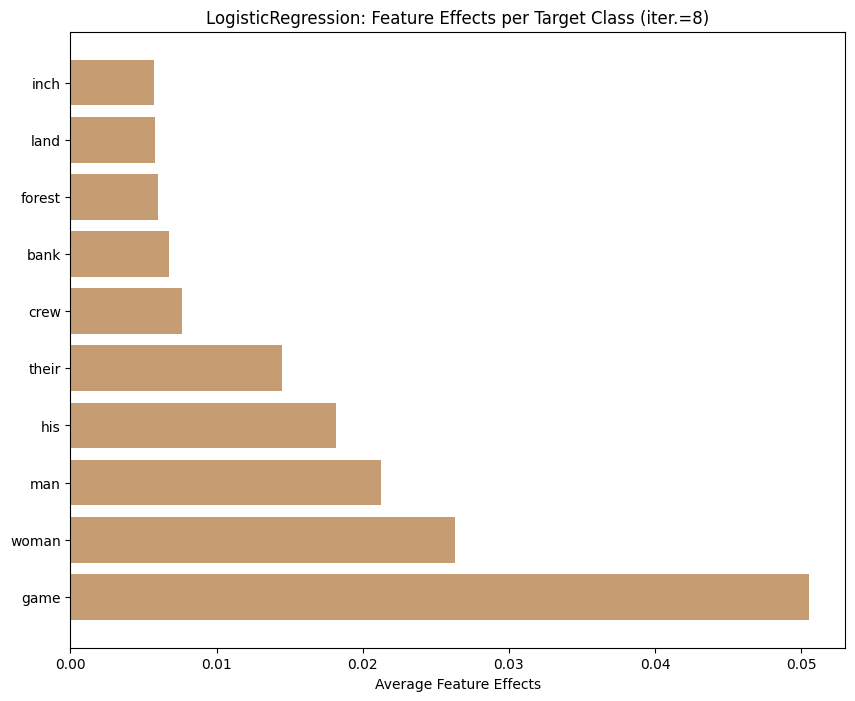

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7654606107261996
              precision    recall  f1-score   support

         220      0.814     0.694     0.749      1967
         226      0.729     0.838     0.780      1930

    accuracy                          0.765      3897
   macro avg      0.771     0.766     0.764      3897
weighted avg      0.772     0.765     0.764      3897



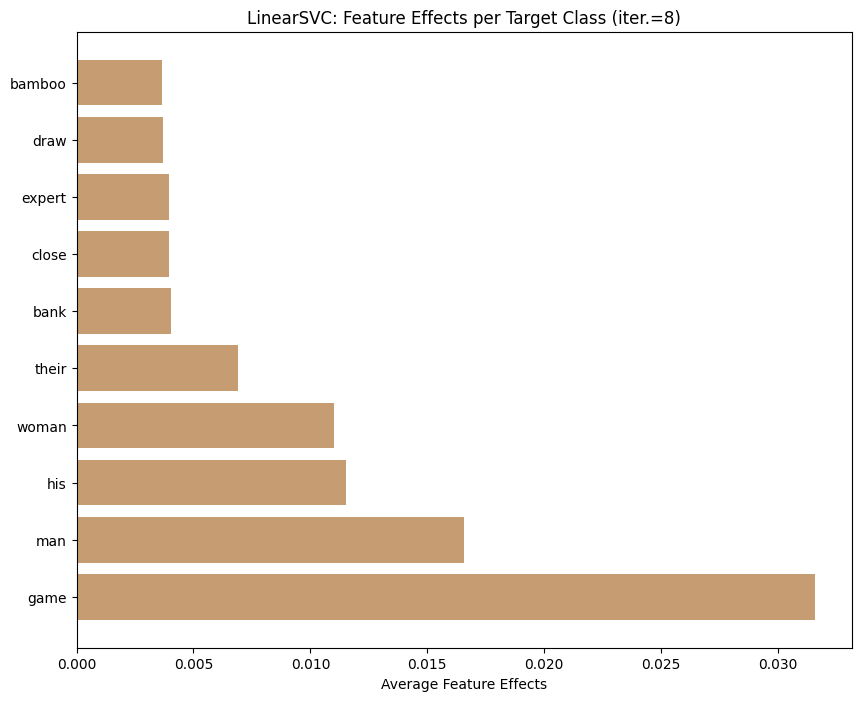

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.729022324865281
              precision    recall  f1-score   support

         220      0.776     0.651     0.708      1967
         226      0.695     0.808     0.747      1930

    accuracy                          0.729      3897
   macro avg      0.735     0.730     0.728      3897
weighted avg      0.736     0.729     0.727      3897



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


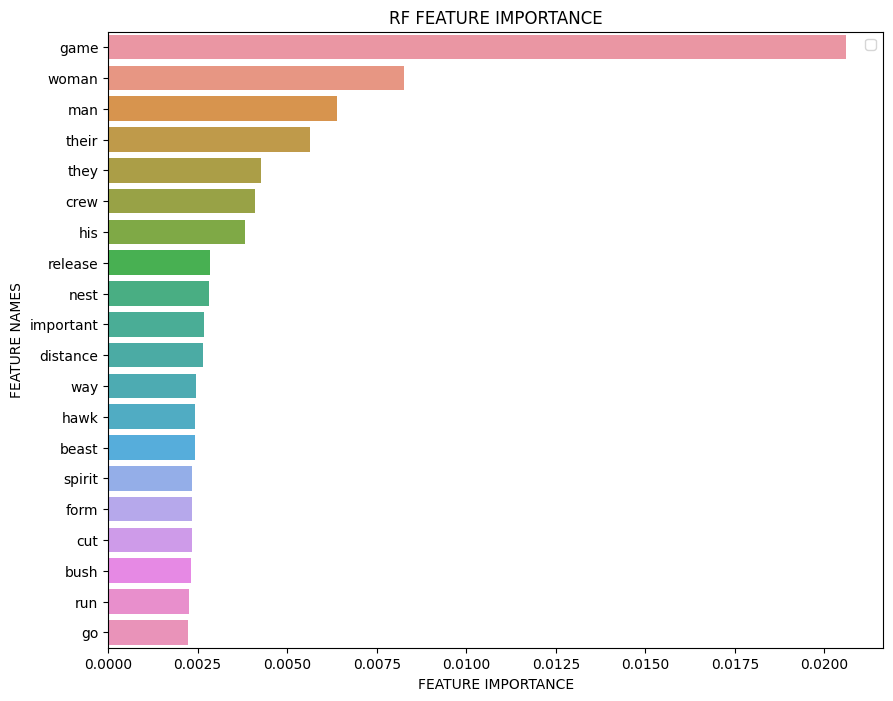

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'crew', 'man'}
Iteration 10
Exclude: {'pool', 'horn', 'inch', 'shallow', 'quarry', 'fisherman', 'bird', 'pit', 'cut', 'deep', 'seal', 'squirrel', 'elephant', 'people', 'ground', 'large', 'give', 'shore', 'shark', 'fox', 'lake', 'bear', 'wild', 'gun', 'basket', 'winter', 'bamboo', 'duck', 'method', 'neck', 'fruit', 'coast', 'arrow', 'trigger', 'sell', 'shot', 'high', 'hole', 'brush', 'hawk', 'go', 'island', 'wound', 'run', 'trap', 'fall', 'leg', 'bait', 'end', 'buffalo', 'right', 'tree', 'informant', 'school', 'poison', 'rat', 'caribou', 'type', 'camp', 'fish', 'weir', 'wood', 'beast', 'spear', 'rock', 'coral', 'water', 'approach', 'eel', 'current', 'come', 'spirit', 'call', 'great', 'say', 'river', 'fire', 'trail', 'dry', 'stick', 'trout', 'pigeon', 'deadfall', 'net', 'deer', 'mouth', 'hook', 'close', 'break', 'distance', 'beaver', 'form', 'stream', 'year', 'gill', 'carcass', 'hold', 'expert', 'trapper', 'dam', 'night', 'snow', 'stone', 'head',

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:134: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alhas\Documents\development\masters-thesis\utils\main.py:135: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(12990,) (12990,)
12990 documents - 6.34MB (training set)
2 categories


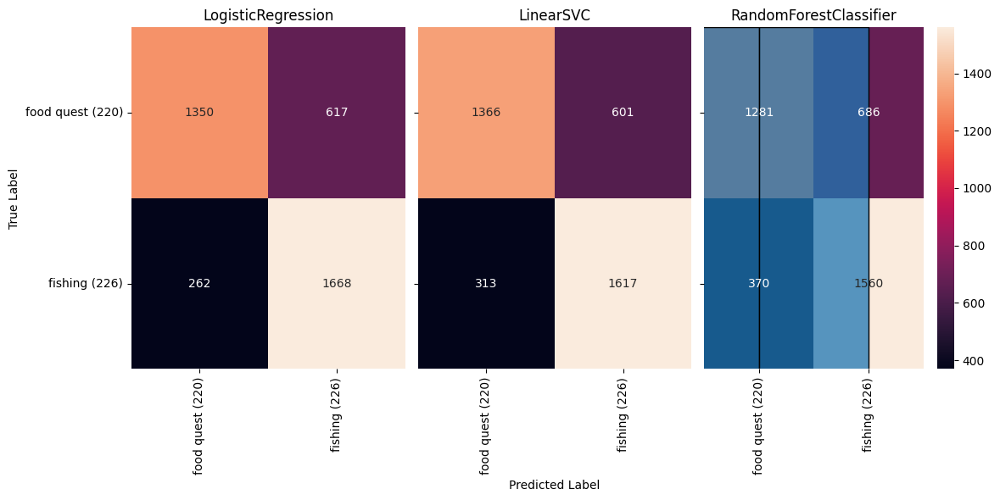

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7508339748524506
              precision    recall  f1-score   support

         220      0.739     0.782     0.760      1967
         226      0.764     0.719     0.741      1930

    accuracy                          0.751      3897
   macro avg      0.752     0.751     0.750      3897
weighted avg      0.752     0.751     0.751      3897



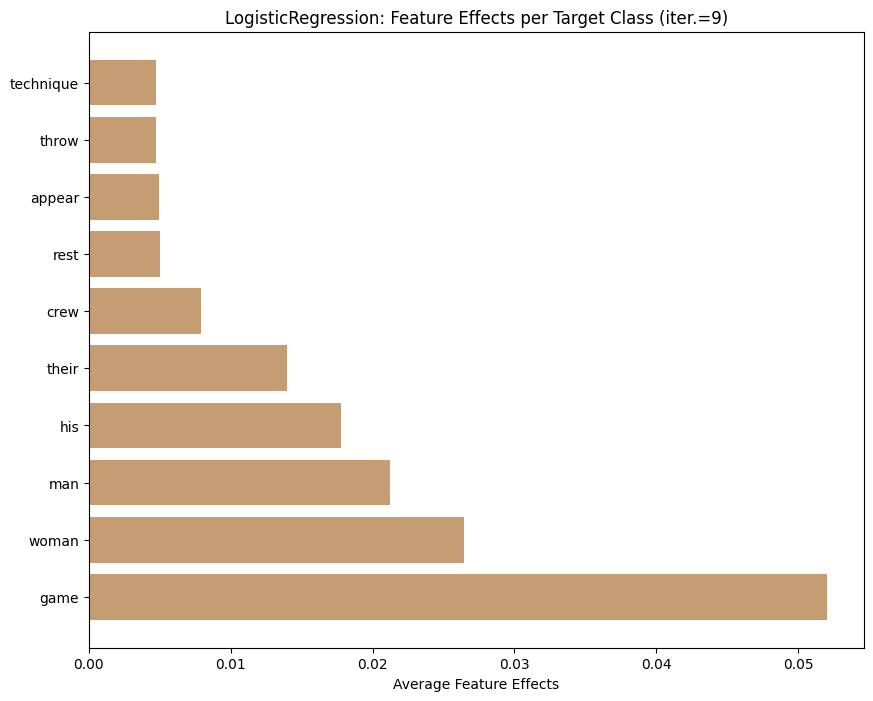

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7590454195535027
              precision    recall  f1-score   support

         220      0.804     0.691     0.743      1967
         226      0.725     0.828     0.773      1930

    accuracy                          0.759      3897
   macro avg      0.764     0.760     0.758      3897
weighted avg      0.765     0.759     0.758      3897



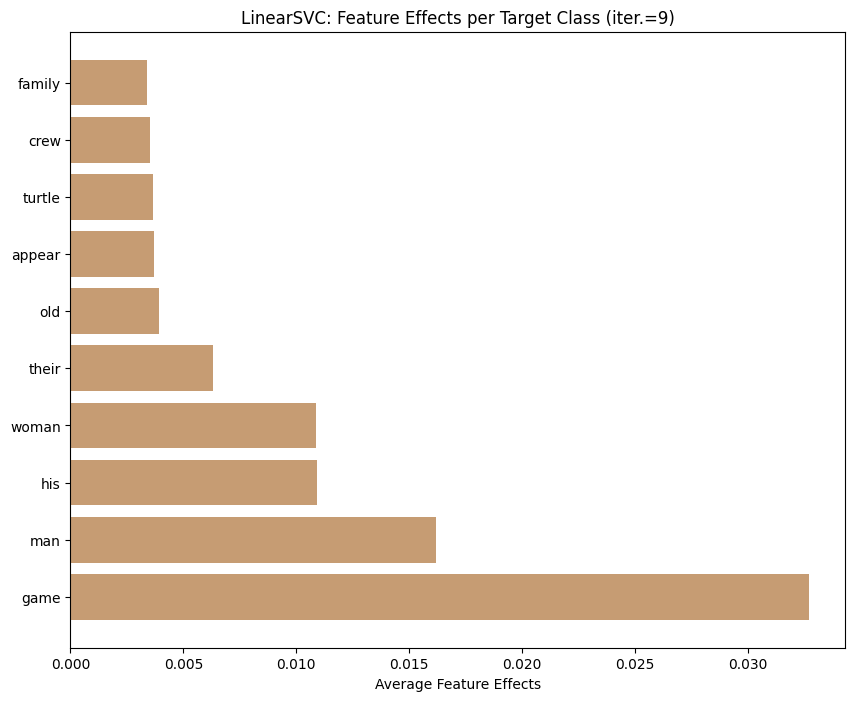

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7323582242750833
              precision    recall  f1-score   support

         220      0.777     0.659     0.713      1967
         226      0.699     0.807     0.749      1930

    accuracy                          0.732      3897
   macro avg      0.738     0.733     0.731      3897
weighted avg      0.738     0.732     0.731      3897



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


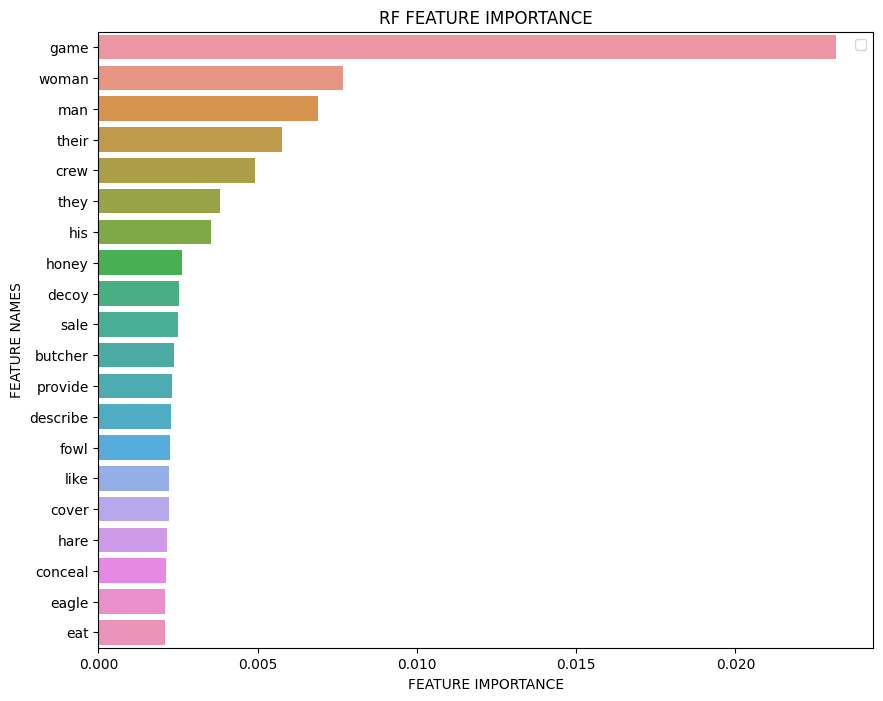

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'crew', 'old', 'man'}


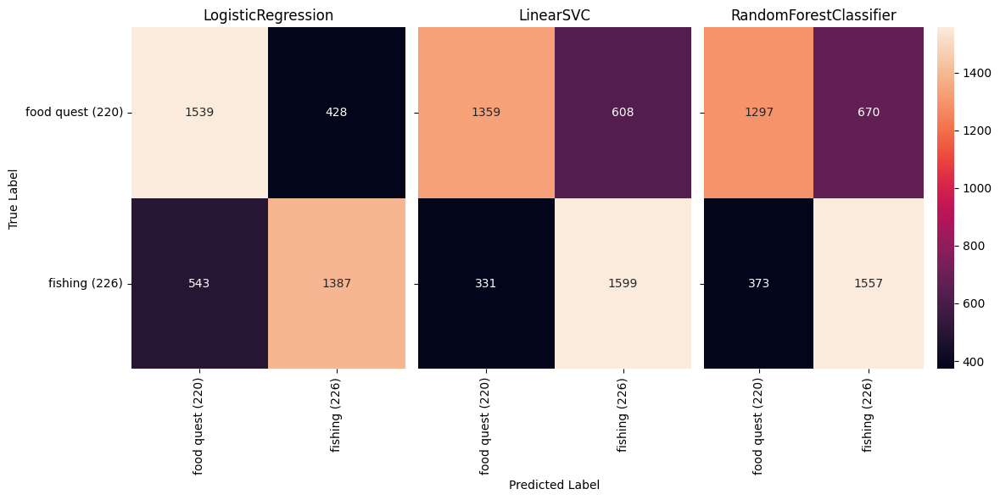

In [18]:
results = defaultdict(dict)
for i in [224, 226]:
    curr_results = iterative_process(common_indicators=False,
                                models=['LR', 'SVM', 'RF'], 
                                specific_cat=i, exact=True, 
                                id=f'2 ({i})',
                                df_performance=df_performance,
                                balanced=True,
                                verbose=True)
    results[i] = curr_results
    save_results(curr_results, f'output/results/{i}_220.pkl')
    

In [19]:

for i in [224, 226]:
    plot_performance(results[i], fig_path=f'output/metric/{i}_220.png')

In [20]:
print(df_performance.to_latex())

\begin{tabular}{lrrr}
\toprule
{} &  precision &    recall &  f1-score \\
\midrule
0\_1 (224, 226)\_LR  &   0.946649 &  0.918209 &  0.929195 \\
0\_1 (224, 226)\_SVM &   0.945181 &  0.926417 &  0.934249 \\
0\_1 (224, 226)\_RF  &   0.942542 &  0.920816 &  0.929648 \\
1\_1 (224, 226)\_LR  &   0.899358 &  0.866671 &  0.878301 \\
1\_1 (224, 226)\_SVM &   0.883793 &  0.866146 &  0.873291 \\
1\_1 (224, 226)\_RF  &   0.883621 &  0.858228 &  0.867728 \\
2\_1 (224, 226)\_LR  &   0.886462 &  0.850958 &  0.863064 \\
2\_1 (224, 226)\_SVM &   0.869056 &  0.853220 &  0.859684 \\
2\_1 (224, 226)\_RF  &   0.859551 &  0.828500 &  0.839125 \\
3\_1 (224, 226)\_LR  &   0.876200 &  0.836653 &  0.849428 \\
3\_1 (224, 226)\_SVM &   0.854744 &  0.837328 &  0.844220 \\
3\_1 (224, 226)\_RF  &   0.824725 &  0.788370 &  0.799308 \\
4\_1 (224, 226)\_LR  &   0.856992 &  0.819464 &  0.831411 \\
4\_1 (224, 226)\_SVM &   0.842609 &  0.825520 &  0.832227 \\
4\_1 (224, 226)\_RF  &   0.829768 &  0.792522 &  0.803744 \\
5\

C:\Users\alhas\AppData\Local\Temp\ipykernel_3880\3683603614.py:1: FutureWarning:

In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.



### 221...226 ~ 225



Balanced: True
Iteration 1
Exclude: set()

(16758,) (16758,)
16758 documents - 8.66MB (training set)
5 categories


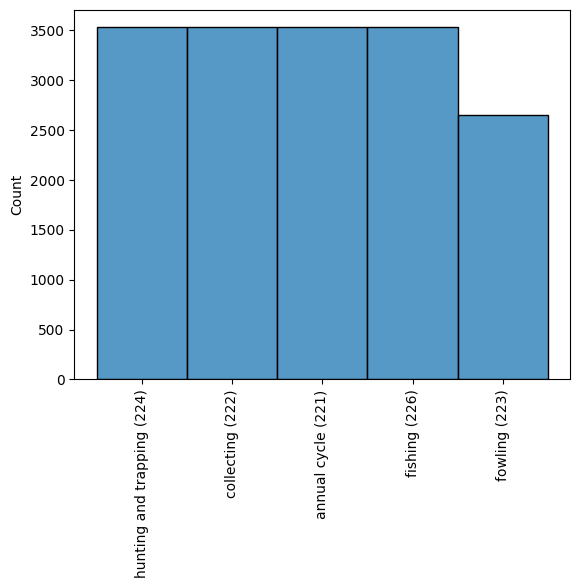

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7826173428798727
              precision    recall  f1-score   support

         221      0.801     0.734     0.766      1090
         222      0.593     0.879     0.708      1050
         223      0.922     0.681     0.783       793
         224      0.852     0.823     0.837      1035
         226      0.926     0.774     0.843      1060

    accuracy                          0.783      5028
   macro avg      0.819     0.778     0.787      5028
weighted avg      0.813     0.783     0.787      5028



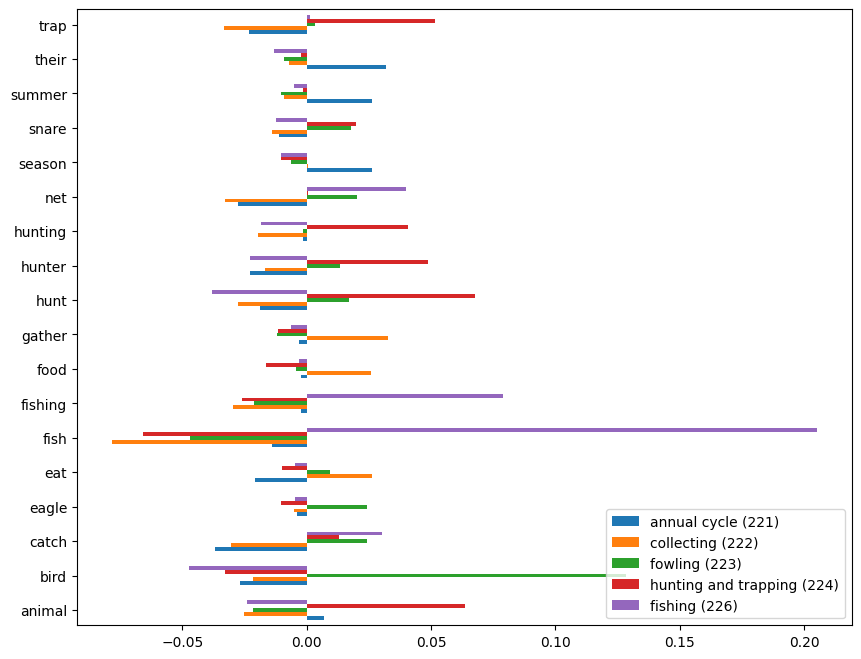

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7742641209228321
              precision    recall  f1-score   support

         221      0.815     0.710     0.759      1090
         222      0.591     0.867     0.703      1050
         223      0.858     0.696     0.769       793
         224      0.845     0.814     0.829      1035
         226      0.906     0.769     0.832      1060

    accuracy                          0.774      5028
   macro avg      0.803     0.771     0.778      5028
weighted avg      0.800     0.774     0.779      5028



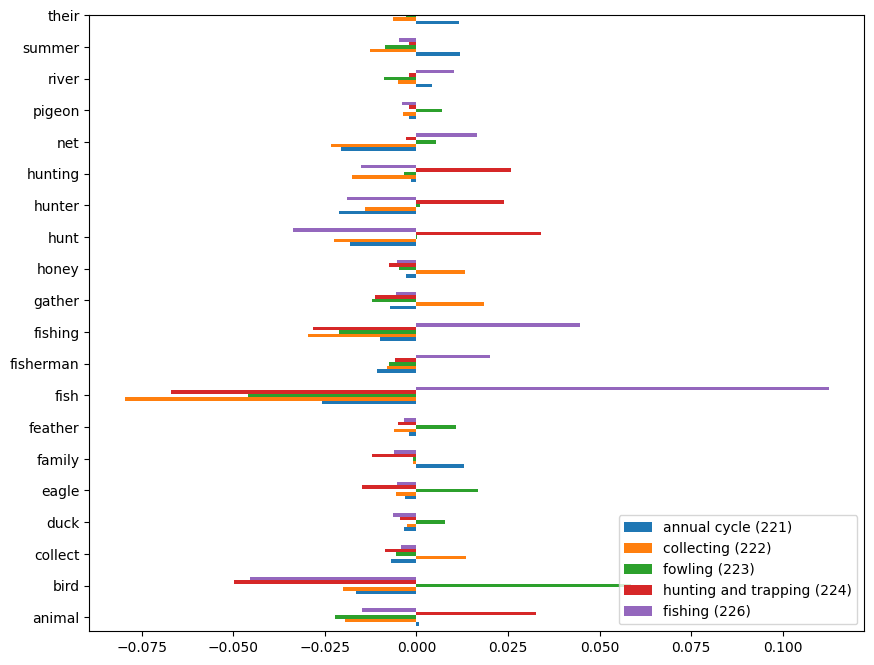

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7553699284009546
              precision    recall  f1-score   support

         221      0.804     0.694     0.745      1090
         222      0.580     0.850     0.690      1050
         223      0.921     0.615     0.738       793
         224      0.788     0.820     0.804      1035
         226      0.863     0.766     0.812      1060

    accuracy                          0.755      5028
   macro avg      0.791     0.749     0.758      5028
weighted avg      0.785     0.755     0.758      5028



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


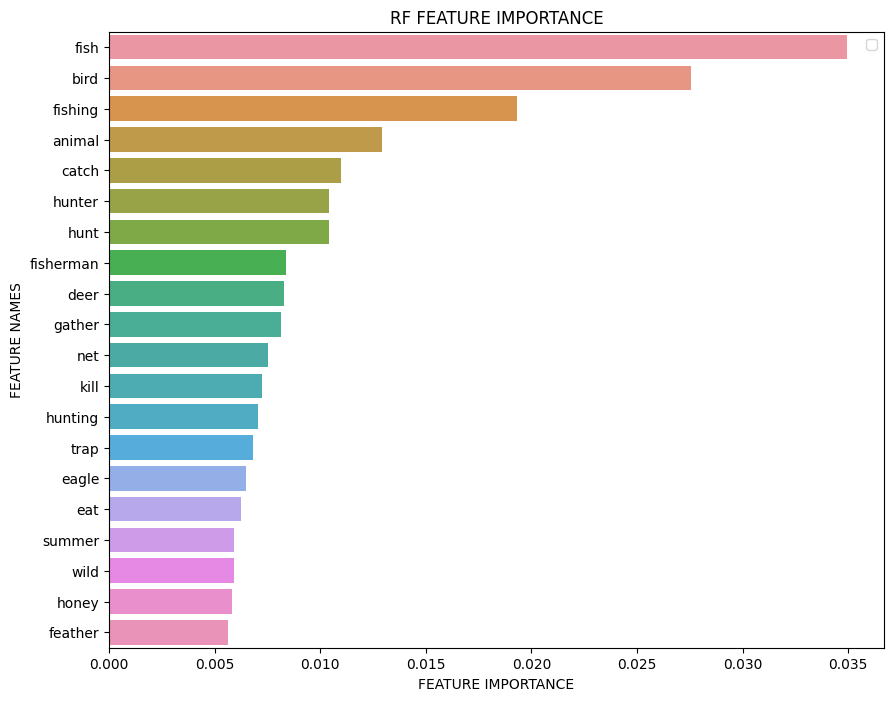

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'their'}
Iteration 2
Exclude: {'hunter', 'honey', 'tree', 'family', 'fisherman', 'bird', 'collect', 'food', 'gather', 'hunting', 'fish', 'water', 'eat', 'river', 'wild', 'feather', 'winter', 'catch', 'duck', 'pigeon', 'season', 'net', 'deer', 'snare', 'animal', 'eagle', 'summer', 'fishing', 'year', 'kill', 'hunt', 'trap'}

(16758,) (16758,)
16758 documents - 8.66MB (training set)
5 categories


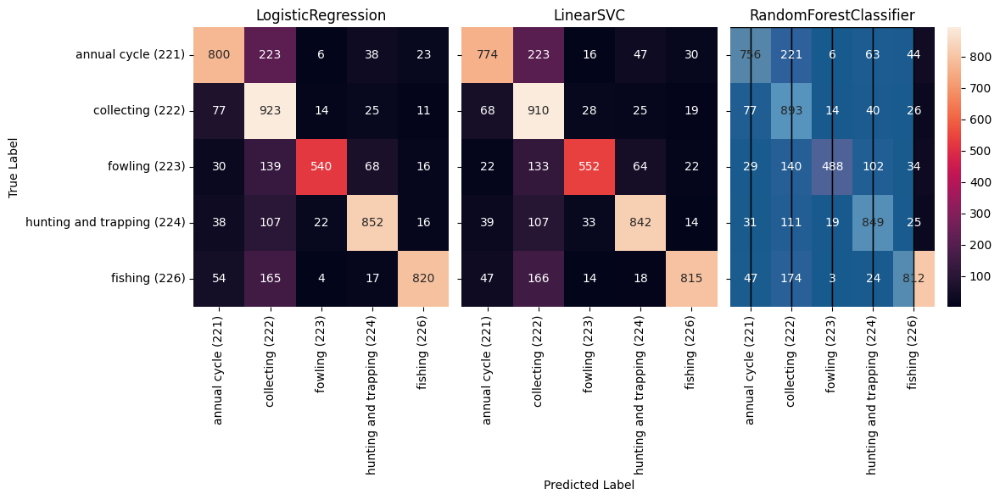

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7153937947494033
              precision    recall  f1-score   support

         221      0.761     0.694     0.726      1090
         222      0.561     0.841     0.673      1050
         223      0.806     0.573     0.670       793
         224      0.787     0.752     0.769      1035
         226      0.798     0.685     0.737      1060

    accuracy                          0.715      5028
   macro avg      0.743     0.709     0.715      5028
weighted avg      0.740     0.715     0.717      5028



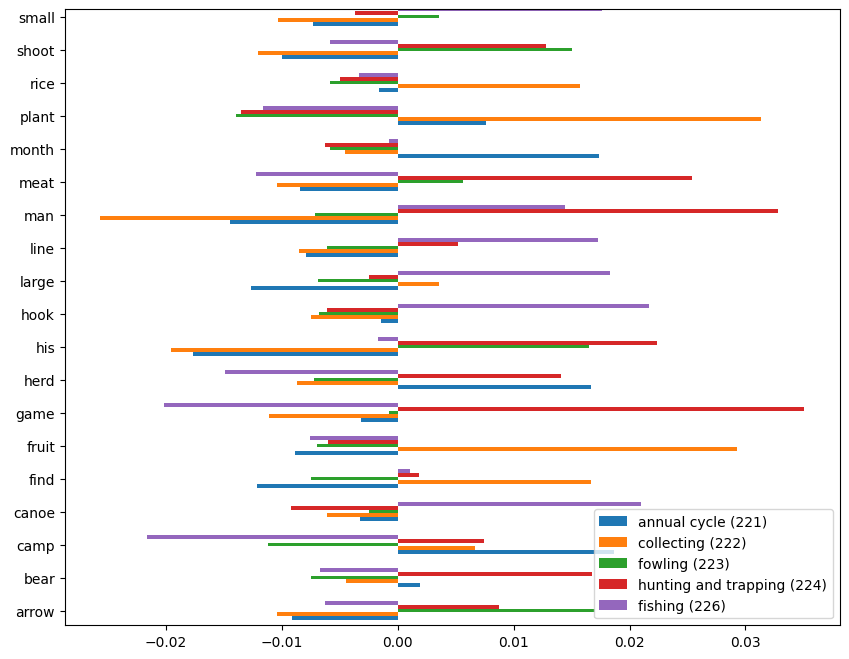

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7052505966587113
              precision    recall  f1-score   support

         221      0.760     0.696     0.727      1090
         222      0.558     0.812     0.661      1050
         223      0.747     0.589     0.659       793
         224      0.767     0.732     0.749      1035
         226      0.799     0.669     0.728      1060

    accuracy                          0.705      5028
   macro avg      0.726     0.700     0.705      5028
weighted avg      0.725     0.705     0.707      5028



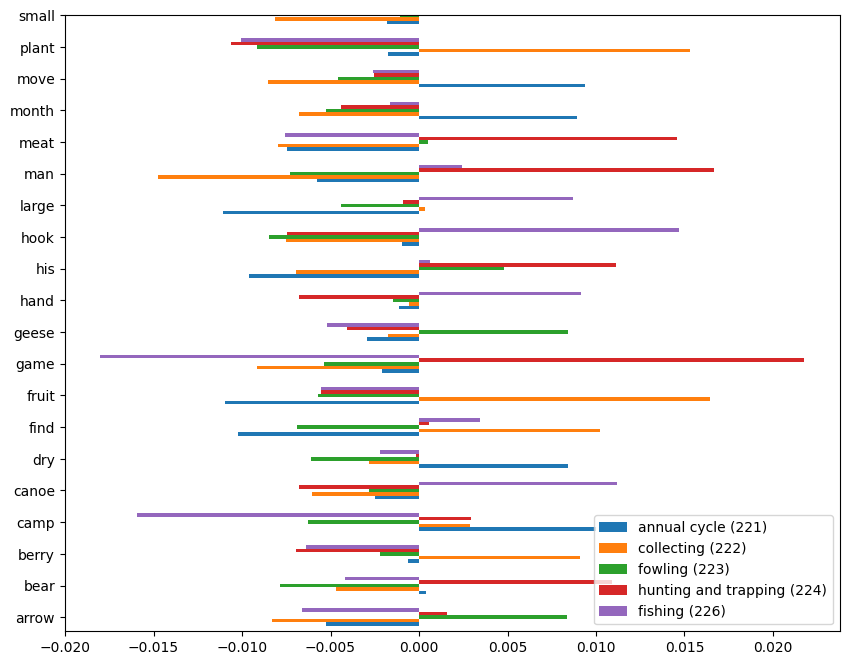

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6519490851233095
              precision    recall  f1-score   support

         221      0.701     0.666     0.683      1090
         222      0.533     0.782     0.634      1050
         223      0.787     0.396     0.527       793
         224      0.669     0.733     0.700      1035
         226      0.717     0.621     0.665      1060

    accuracy                          0.652      5028
   macro avg      0.681     0.640     0.642      5028
weighted avg      0.676     0.652     0.648      5028



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


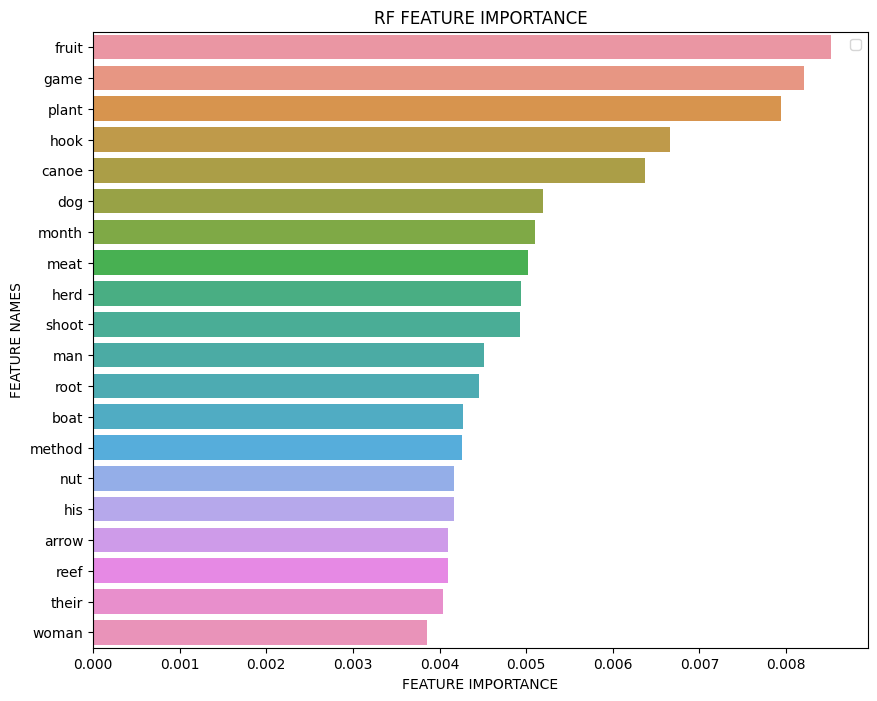

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'man'}
Iteration 3
Exclude: {'hunter', 'honey', 'tree', 'family', 'fisherman', 'bird', 'line', 'herd', 'collect', 'meat', 'boat', 'food', 'gather', 'hunting', 'fish', 'camp', 'nut', 'plant', 'month', 'shoot', 'find', 'water', 'large', 'rice', 'eat', 'river', 'bear', 'wild', 'feather', 'dry', 'winter', 'canoe', 'catch', 'duck', 'pigeon', 'season', 'net', 'deer', 'berry', 'method', 'fruit', 'snare', 'hook', 'specie', 'arrow', 'animal', 'reef', 'eagle', 'summer', 'geese', 'root', 'take', 'dog', 'time', 'fishing', 'move', 'small', 'year', 'hand', 'kill', 'hunt', 'trap'}

(16758,) (16758,)
16758 documents - 8.66MB (training set)
5 categories


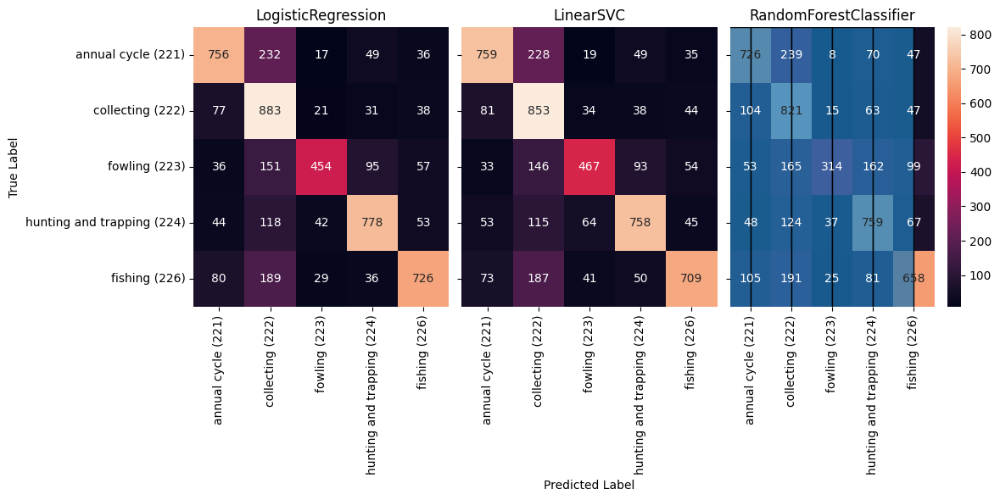

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7020684168655529
              precision    recall  f1-score   support

         221      0.742     0.690     0.715      1090
         222      0.555     0.813     0.659      1050
         223      0.798     0.564     0.661       793
         224      0.760     0.747     0.753      1035
         226      0.784     0.664     0.719      1060

    accuracy                          0.702      5028
   macro avg      0.728     0.696     0.702      5028
weighted avg      0.724     0.702     0.704      5028



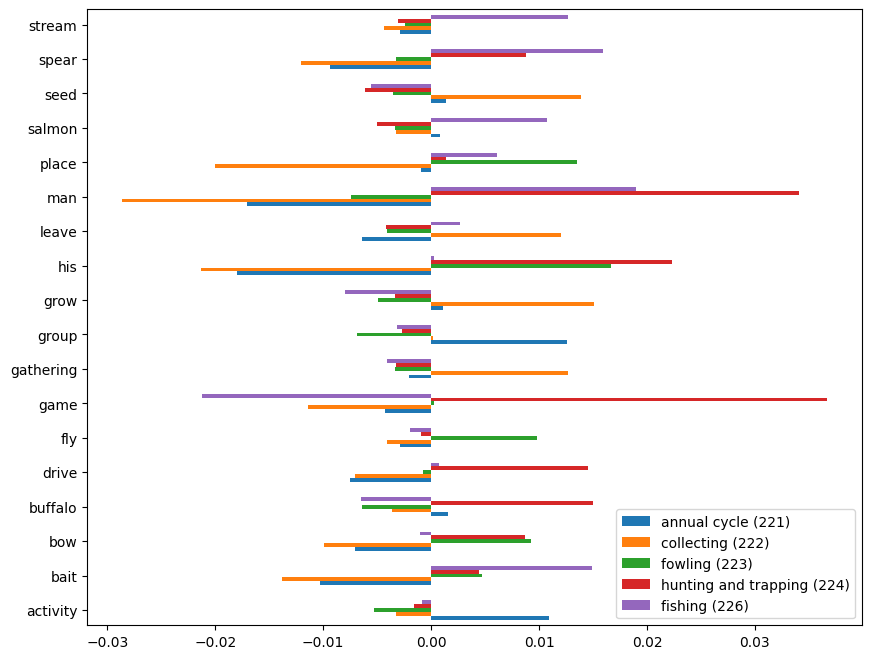

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6903341288782816
              precision    recall  f1-score   support

         221      0.743     0.680     0.710      1090
         222      0.547     0.802     0.650      1050
         223      0.746     0.578     0.651       793
         224      0.754     0.718     0.735      1035
         226      0.770     0.648     0.704      1060

    accuracy                          0.690      5028
   macro avg      0.712     0.685     0.690      5028
weighted avg      0.711     0.690     0.692      5028



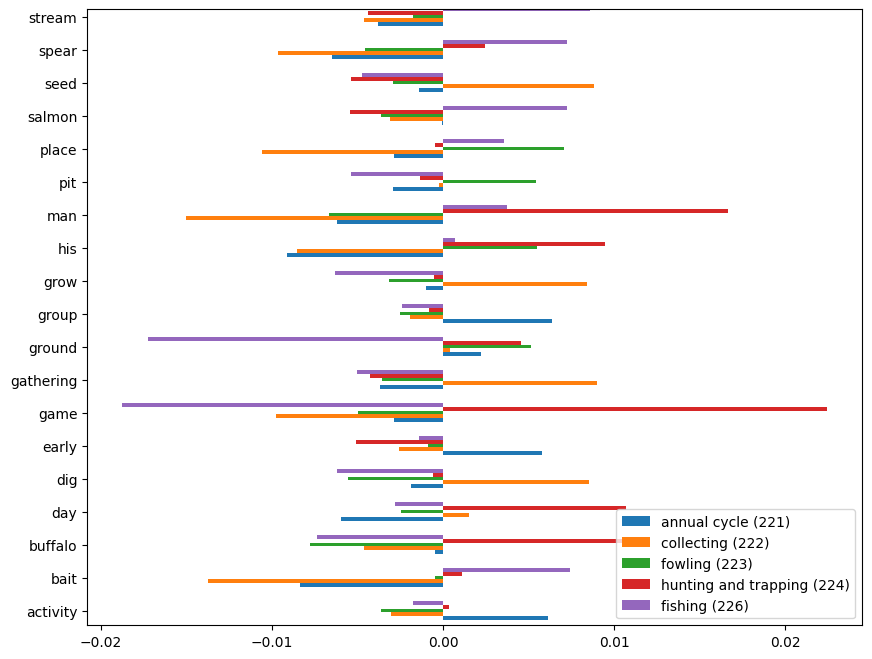

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6247016706443914
              precision    recall  f1-score   support

         221      0.672     0.632     0.652      1090
         222      0.492     0.735     0.590      1050
         223      0.758     0.400     0.524       793
         224      0.648     0.714     0.680      1035
         226      0.712     0.589     0.644      1060

    accuracy                          0.625      5028
   macro avg      0.657     0.614     0.618      5028
weighted avg      0.652     0.625     0.623      5028



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


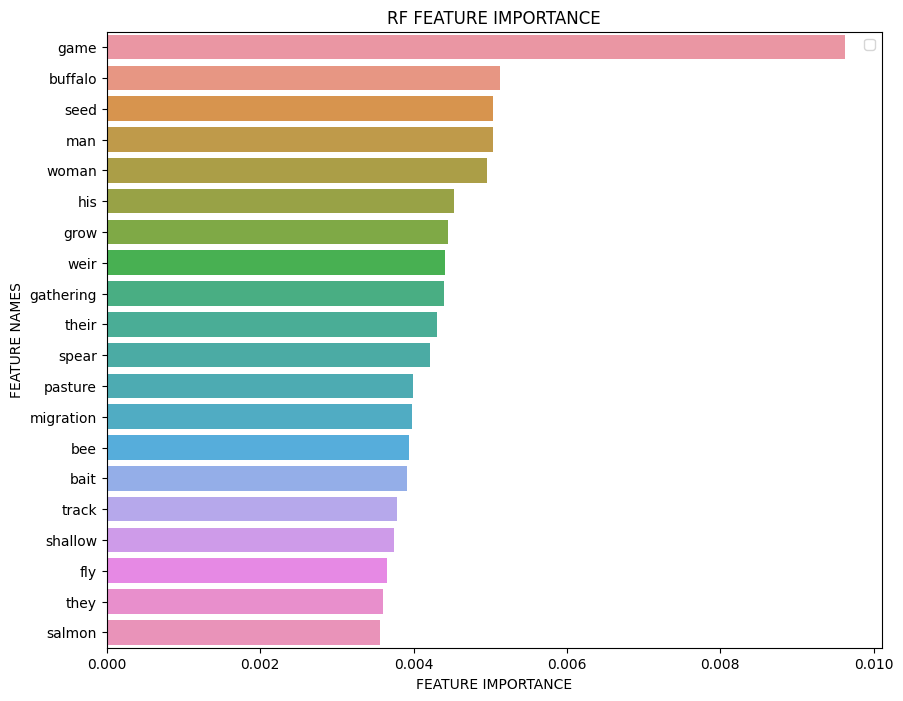

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'woman', 'their', 'they', 'game', 'man'}
Iteration 4
Exclude: {'shallow', 'fisherman', 'bird', 'pit', 'dig', 'food', 'plant', 'month', 'ground', 'large', 'rice', 'bear', 'wild', 'fly', 'winter', 'duck', 'season', 'method', 'fruit', 'arrow', 'trap', 'bait', 'buffalo', 'tree', 'family', 'collect', 'camp', 'fish', 'weir', 'spear', 'water', 'activity', 'seed', 'river', 'feather', 'dry', 'pigeon', 'net', 'deer', 'hook', 'root', 'early', 'stream', 'move', 'year', 'meat', 'work', 'boat', 'gather', 'nut', 'day', 'grow', 'eat', 'catch', 'eagle', 'geese', 'leave', 'dog', 'time', 'small', 'hunter', 'honey', 'village', 'bee', 'pasture', 'migration', 'line', 'herd', 'drive', 'hunting', 'shoot', 'place', 'find', 'gathering', 'bow', 'canoe', 'berry', 'salmon', 'snare', 'specie', 'animal', 'reef', 'summer', 'track', 'take', 'fishing', 'hand', 'kill', 'hunt'}

(16758,) (16758,)
16758 documents - 8.66MB (training set)
5 categories


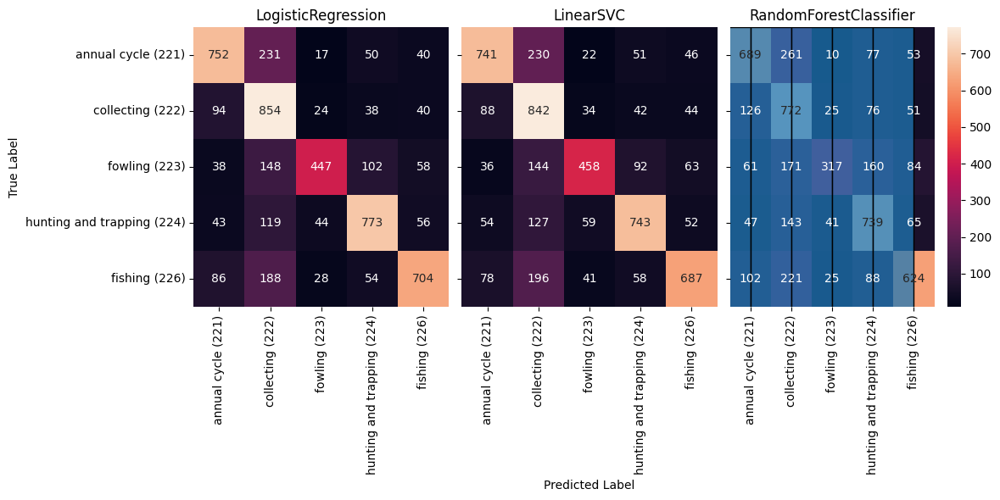

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6937151949085123
              precision    recall  f1-score   support

         221      0.748     0.695     0.721      1090
         222      0.538     0.805     0.645      1050
         223      0.813     0.554     0.659       793
         224      0.754     0.734     0.744      1035
         226      0.766     0.647     0.702      1060

    accuracy                          0.694      5028
   macro avg      0.724     0.687     0.694      5028
weighted avg      0.719     0.694     0.696      5028



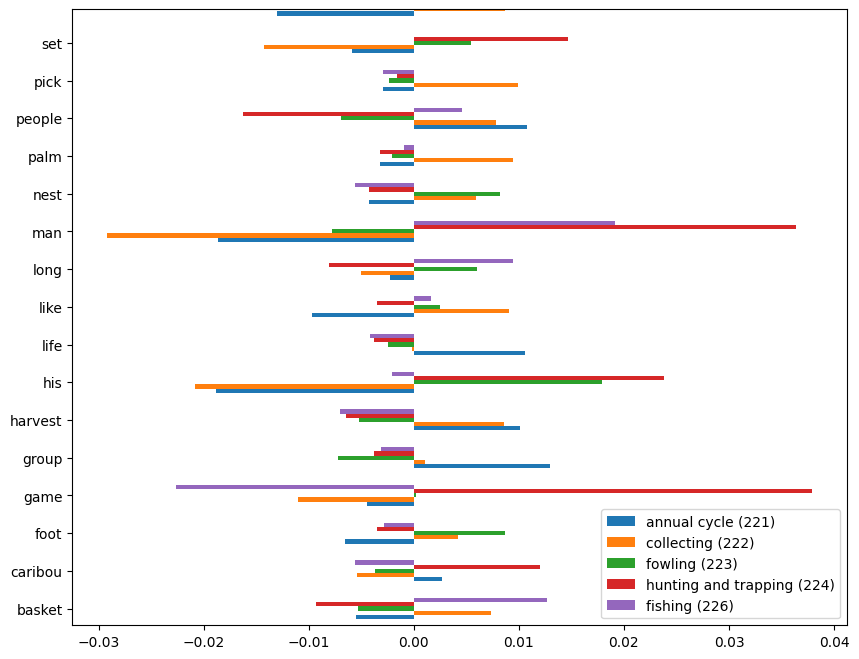

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6778042959427207
              precision    recall  f1-score   support

         221      0.734     0.674     0.703      1090
         222      0.529     0.779     0.630      1050
         223      0.739     0.574     0.646       793
         224      0.739     0.708     0.723      1035
         226      0.763     0.629     0.690      1060

    accuracy                          0.678      5028
   macro avg      0.701     0.673     0.678      5028
weighted avg      0.699     0.678     0.680      5028



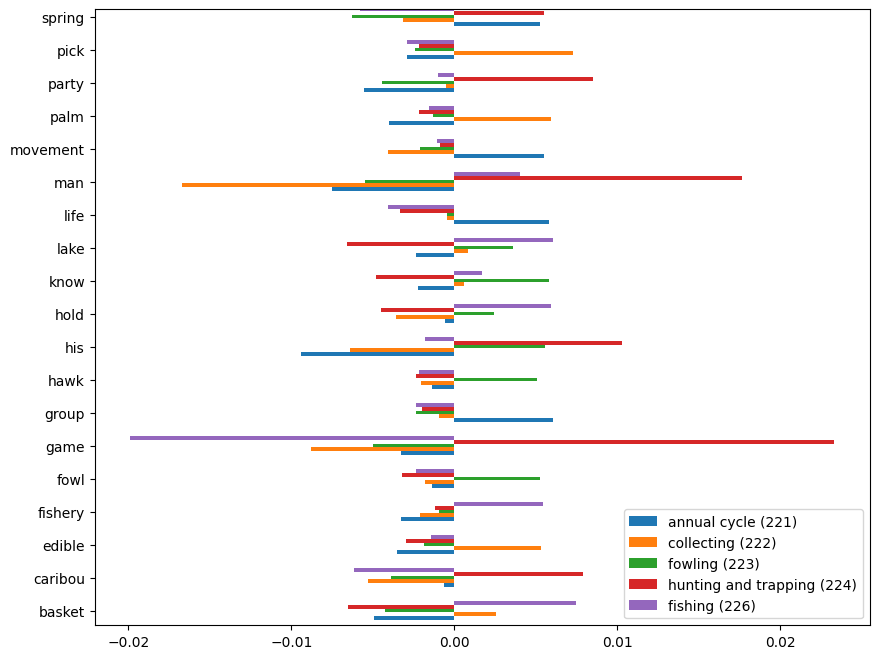

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6089896579156723
              precision    recall  f1-score   support

         221      0.647     0.639     0.643      1090
         222      0.485     0.703     0.574      1050
         223      0.795     0.382     0.516       793
         224      0.613     0.705     0.656      1035
         226      0.694     0.560     0.620      1060

    accuracy                          0.609      5028
   macro avg      0.647     0.598     0.602      5028
weighted avg      0.639     0.609     0.606      5028



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


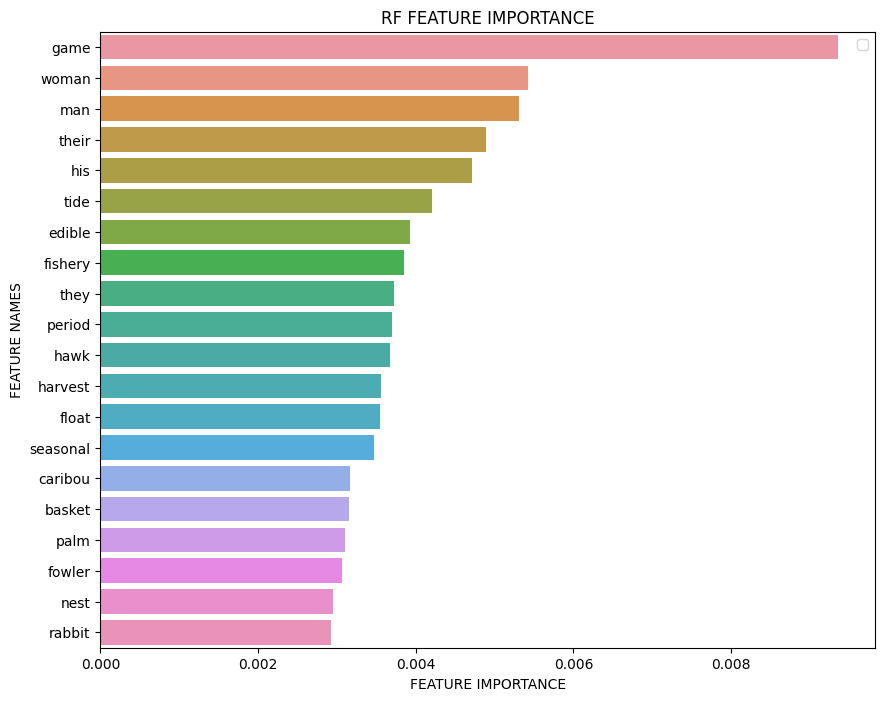

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'woman', 'their', 'they', 'game', 'man'}
Iteration 5
Exclude: {'shallow', 'fisherman', 'bird', 'pit', 'dig', 'edible', 'palm', 'food', 'plant', 'month', 'people', 'ground', 'large', 'rice', 'lake', 'bear', 'wild', 'fly', 'winter', 'basket', 'duck', 'season', 'method', 'fruit', 'arrow', 'hawk', 'trap', 'bait', 'buffalo', 'tree', 'family', 'collect', 'caribou', 'camp', 'fish', 'weir', 'spear', 'water', 'activity', 'period', 'seed', 'river', 'feather', 'dry', 'stick', 'pigeon', 'net', 'deer', 'hook', 'life', 'root', 'early', 'stream', 'move', 'year', 'hold', 'stone', 'like', 'fowl', 'meat', 'work', 'boat', 'gather', 'nut', 'nest', 'day', 'set', 'float', 'grow', 'eat', 'seasonal', 'catch', 'party', 'eagle', 'geese', 'harvest', 'foot', 'leave', 'dog', 'time', 'small', 'hunter', 'honey', 'village', 'bee', 'tide', 'pasture', 'migration', 'line', 'herd', 'drive', 'hunting', 'know', 'pick', 'shoot', 'place', 'find', 'fowler', 'fishery', 'rabbit', 'gathering', 'bow', 'long', 'mo

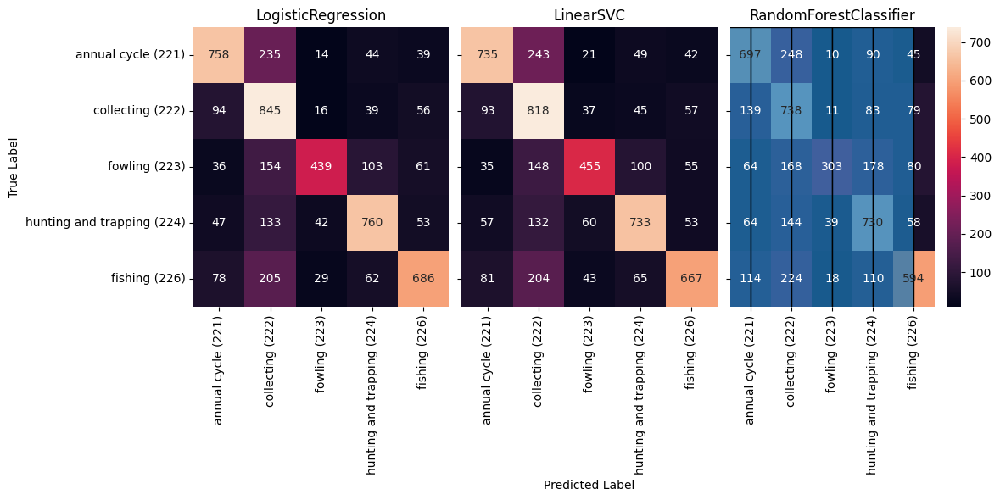

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6811853619729514
              precision    recall  f1-score   support

         221      0.737     0.697     0.717      1090
         222      0.532     0.787     0.635      1050
         223      0.770     0.533     0.630       793
         224      0.736     0.712     0.724      1035
         226      0.760     0.641     0.695      1060

    accuracy                          0.681      5028
   macro avg      0.707     0.674     0.680      5028
weighted avg      0.704     0.681     0.683      5028



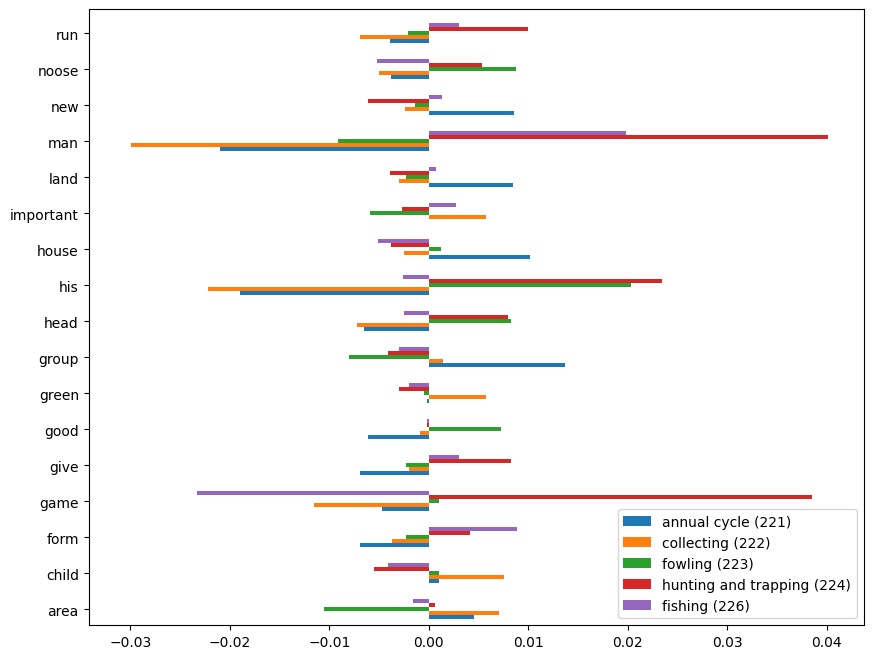

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6618933969769292
              precision    recall  f1-score   support

         221      0.722     0.661     0.690      1090
         222      0.518     0.765     0.617      1050
         223      0.707     0.555     0.622       793
         224      0.717     0.684     0.700      1035
         226      0.754     0.620     0.680      1060

    accuracy                          0.662      5028
   macro avg      0.684     0.657     0.662      5028
weighted avg      0.683     0.662     0.664      5028



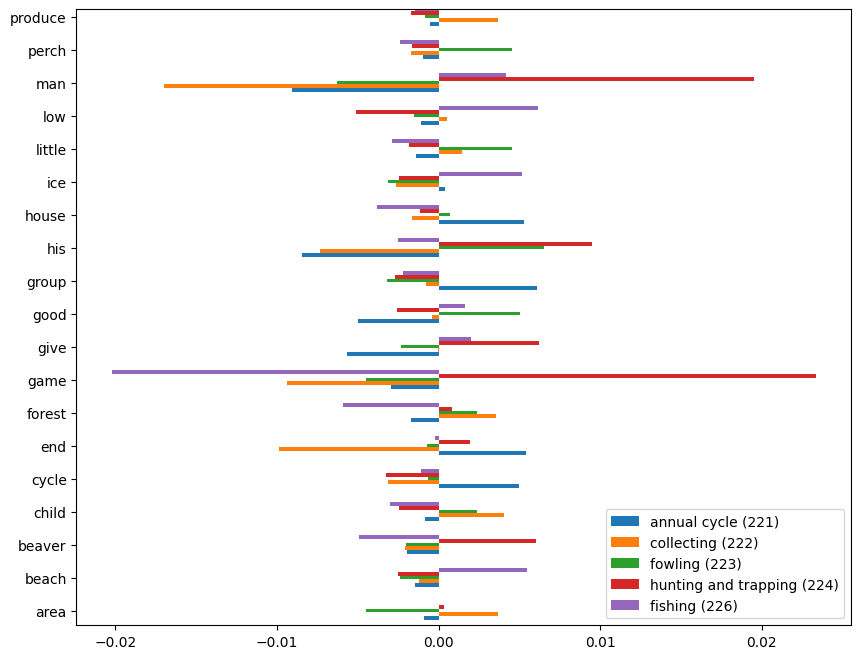

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.5958631662688942
              precision    recall  f1-score   support

         221      0.638     0.619     0.628      1090
         222      0.479     0.704     0.570      1050
         223      0.728     0.351     0.473       793
         224      0.608     0.695     0.648      1035
         226      0.679     0.552     0.609      1060

    accuracy                          0.596      5028
   macro avg      0.626     0.584     0.586      5028
weighted avg      0.621     0.596     0.592      5028



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


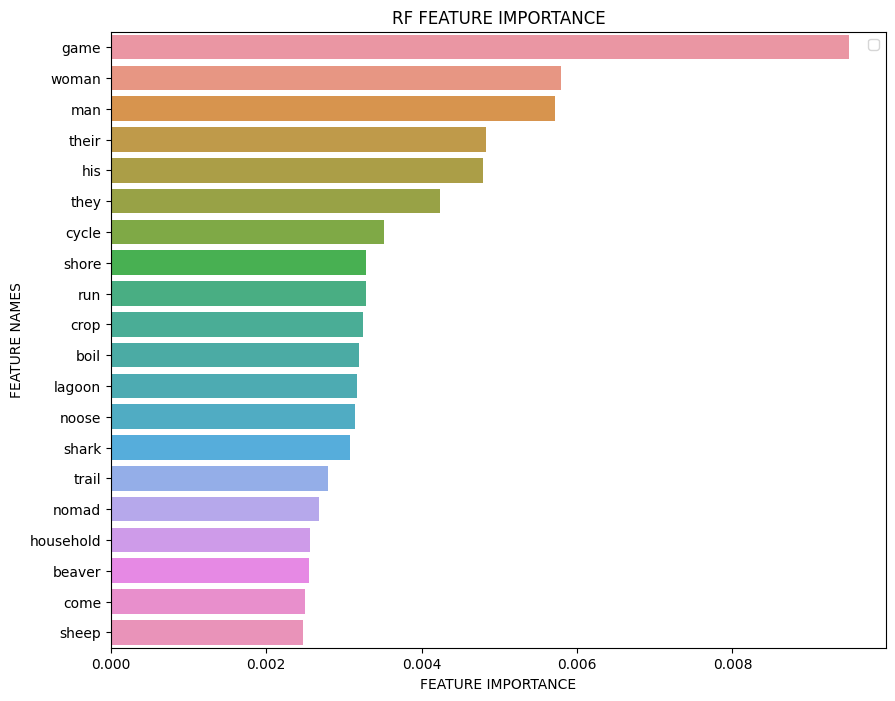

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'woman', 'their', 'they', 'game', 'new', 'man'}
Iteration 6
Exclude: {'shallow', 'fisherman', 'bird', 'pit', 'dig', 'edible', 'palm', 'food', 'plant', 'month', 'people', 'ground', 'large', 'give', 'shore', 'shark', 'rice', 'area', 'lake', 'bear', 'wild', 'fly', 'winter', 'basket', 'duck', 'season', 'method', 'fruit', 'arrow', 'sheep', 'hawk', 'run', 'trap', 'bait', 'end', 'buffalo', 'tree', 'family', 'house', 'collect', 'little', 'caribou', 'camp', 'fish', 'weir', 'spear', 'water', 'activity', 'come', 'period', 'seed', 'river', 'trail', 'feather', 'dry', 'stick', 'pigeon', 'net', 'deer', 'hook', 'life', 'form', 'root', 'beaver', 'early', 'stream', 'child', 'move', 'year', 'boil', 'hold', 'perch', 'stone', 'like', 'fowl', 'head', 'meat', 'work', 'boat', 'gather', 'nut', 'nest', 'low', 'day', 'set', 'float', 'grow', 'eat', 'use', 'seasonal', 'catch', 'crop', 'party', 'noose', 'important', 'produce', 'good', 'eagle', 'geese', 'harvest', 'foot', 'cycle', 'leave', 'dog', 't

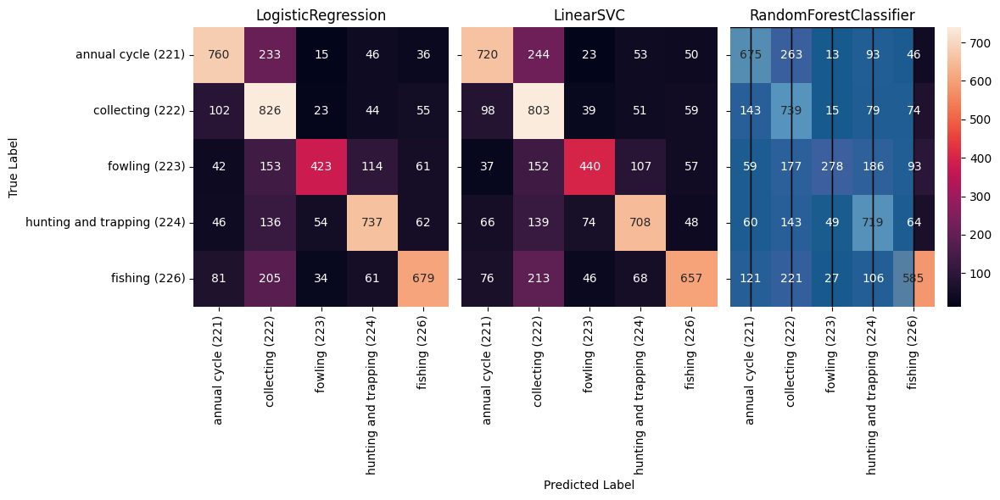

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6742243436754176
              precision    recall  f1-score   support

         221      0.729     0.694     0.711      1090
         222      0.529     0.781     0.631      1050
         223      0.761     0.535     0.628       793
         224      0.733     0.701     0.717      1035
         226      0.743     0.625     0.679      1060

    accuracy                          0.674      5028
   macro avg      0.699     0.667     0.673      5028
weighted avg      0.696     0.674     0.676      5028



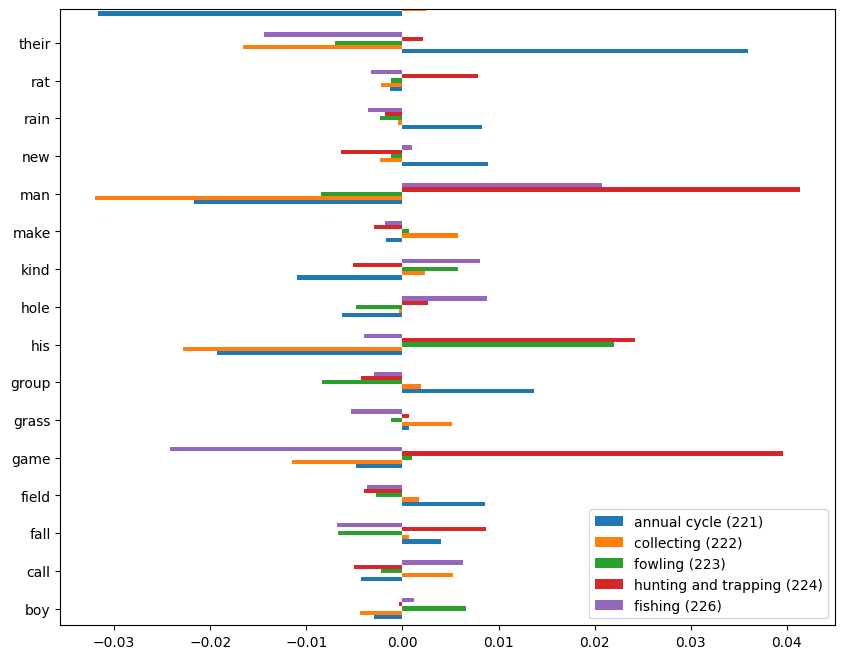

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6523468575974543
              precision    recall  f1-score   support

         221      0.711     0.647     0.677      1090
         222      0.515     0.754     0.612      1050
         223      0.689     0.546     0.609       793
         224      0.719     0.682     0.700      1035
         226      0.724     0.608     0.661      1060

    accuracy                          0.652      5028
   macro avg      0.672     0.647     0.652      5028
weighted avg      0.671     0.652     0.654      5028



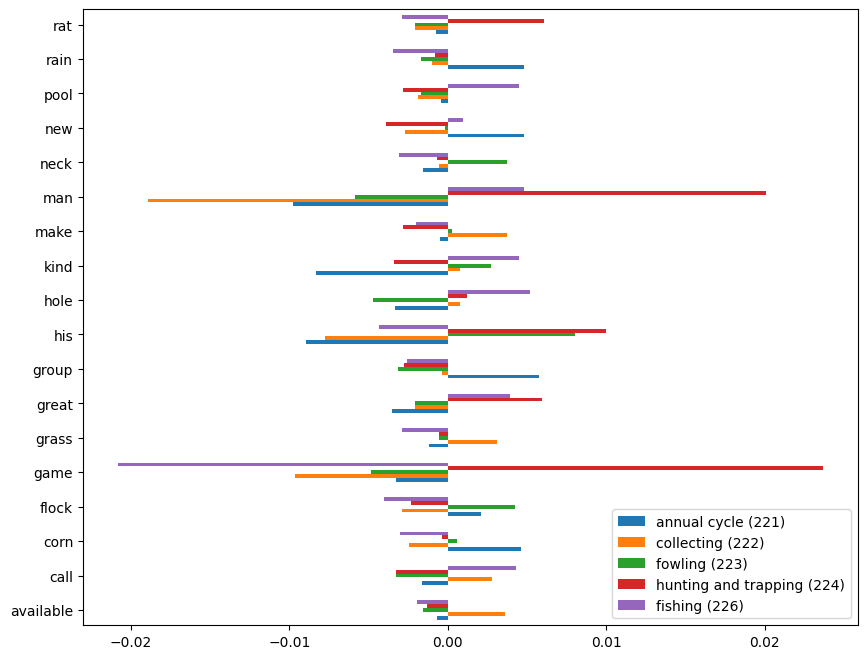

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.5938743038981702
              precision    recall  f1-score   support

         221      0.624     0.638     0.631      1090
         222      0.482     0.700     0.571      1050
         223      0.730     0.362     0.484       793
         224      0.619     0.674     0.646      1035
         226      0.657     0.539     0.592      1060

    accuracy                          0.594      5028
   macro avg      0.623     0.583     0.585      5028
weighted avg      0.617     0.594     0.590      5028



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


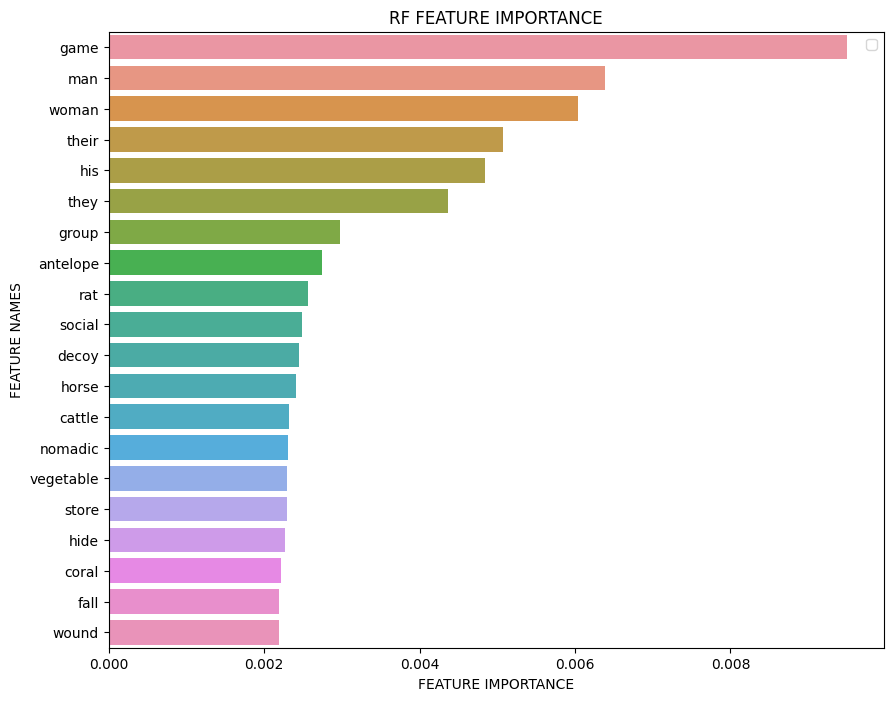

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'young', 'their', 'they', 'boy', 'woman', 'game', 'new', 'man'}
Iteration 7
Exclude: {'pool', 'shallow', 'fisherman', 'bird', 'pit', 'dig', 'edible', 'palm', 'food', 'plant', 'month', 'people', 'ground', 'large', 'give', 'shore', 'shark', 'rice', 'area', 'lake', 'bear', 'store', 'wild', 'fly', 'winter', 'basket', 'duck', 'season', 'method', 'neck', 'fruit', 'arrow', 'sheep', 'hole', 'hawk', 'wound', 'run', 'trap', 'fall', 'bait', 'end', 'buffalo', 'tree', 'family', 'house', 'collect', 'little', 'rat', 'rain', 'caribou', 'camp', 'fish', 'weir', 'vegetable', 'spear', 'make', 'coral', 'water', 'activity', 'come', 'call', 'period', 'seed', 'great', 'river', 'trail', 'feather', 'dry', 'wing', 'stick', 'pigeon', 'net', 'deer', 'hook', 'life', 'nomadic', 'corn', 'form', 'root', 'beaver', 'early', 'stream', 'child', 'move', 'year', 'boil', 'hold', 'perch', 'flock', 'stone', 'like', 'fowl', 'head', 'meat', 'work', 'boat', 'gather', 'nut', 'nest', 'low', 'day', 'set', 'float', '

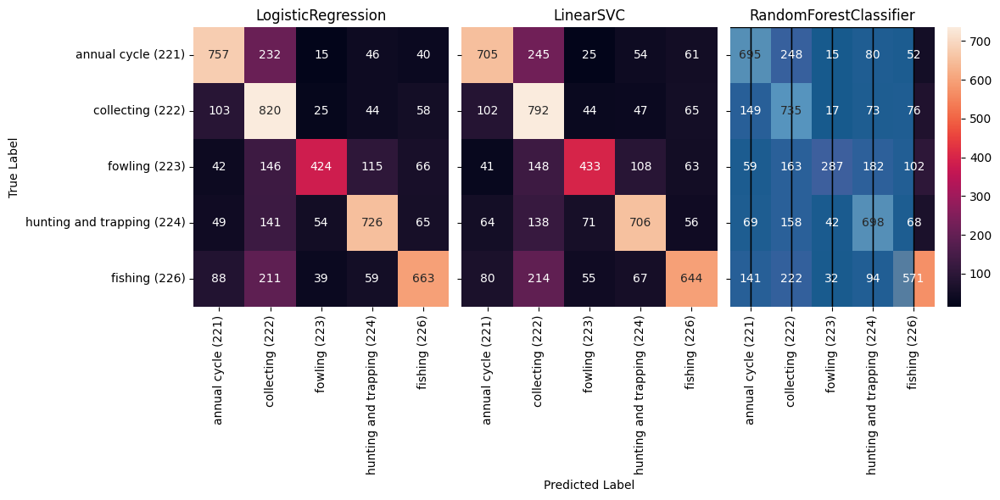

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6666666666666666
              precision    recall  f1-score   support

         221      0.714     0.691     0.702      1090
         222      0.526     0.781     0.628      1050
         223      0.756     0.521     0.617       793
         224      0.716     0.699     0.707      1035
         226      0.749     0.607     0.670      1060

    accuracy                          0.667      5028
   macro avg      0.692     0.660     0.665      5028
weighted avg      0.689     0.667     0.668      5028



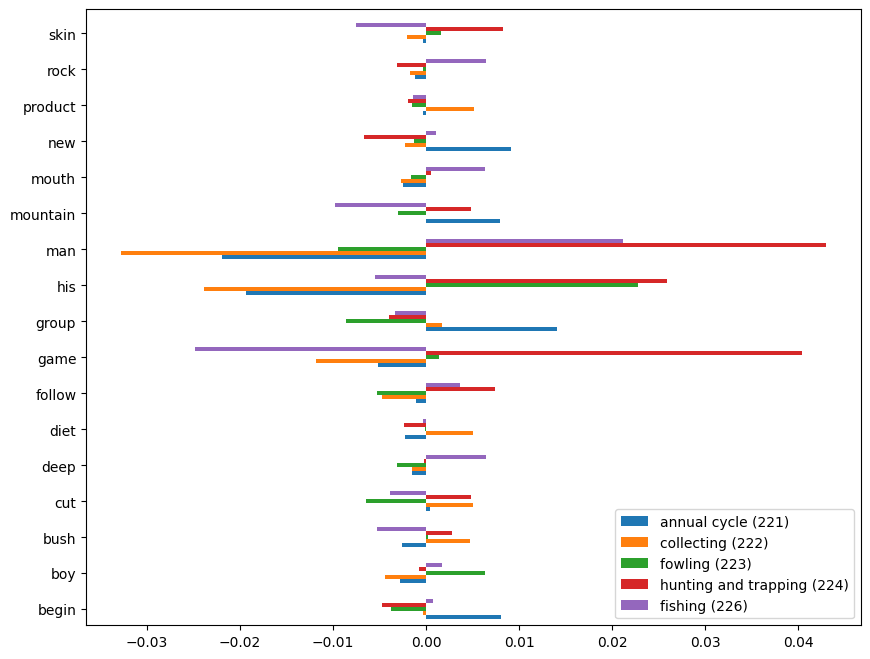

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6471758154335719
              precision    recall  f1-score   support

         221      0.711     0.652     0.680      1090
         222      0.513     0.747     0.608      1050
         223      0.681     0.531     0.597       793
         224      0.709     0.676     0.692      1035
         226      0.714     0.602     0.653      1060

    accuracy                          0.647      5028
   macro avg      0.666     0.642     0.646      5028
weighted avg      0.665     0.647     0.649      5028



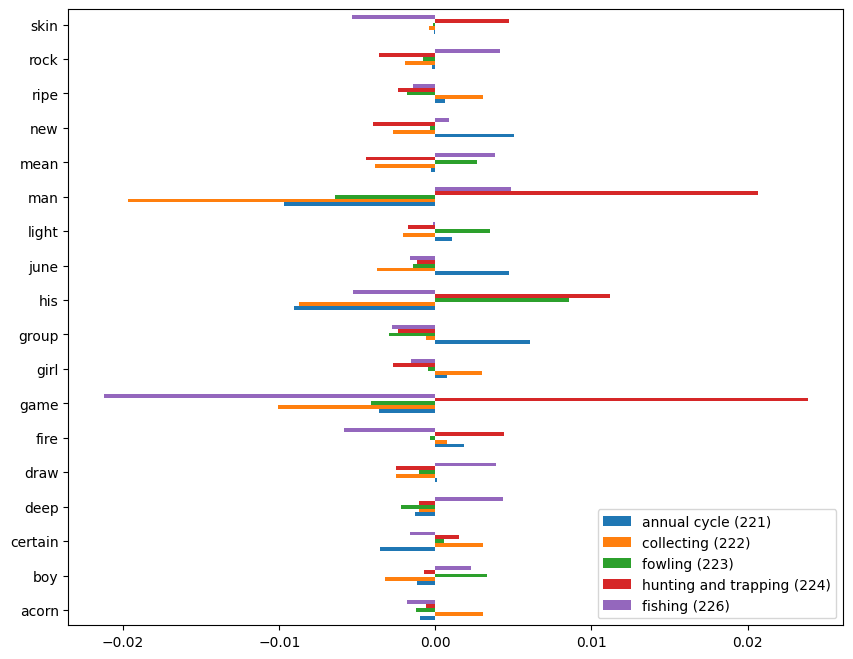

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.580151153540175
              precision    recall  f1-score   support

         221      0.614     0.629     0.622      1090
         222      0.477     0.694     0.565      1050
         223      0.727     0.339     0.463       793
         224      0.589     0.672     0.628      1035
         226      0.647     0.507     0.568      1060

    accuracy                          0.580      5028
   macro avg      0.611     0.568     0.569      5028
weighted avg      0.605     0.580     0.575      5028



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


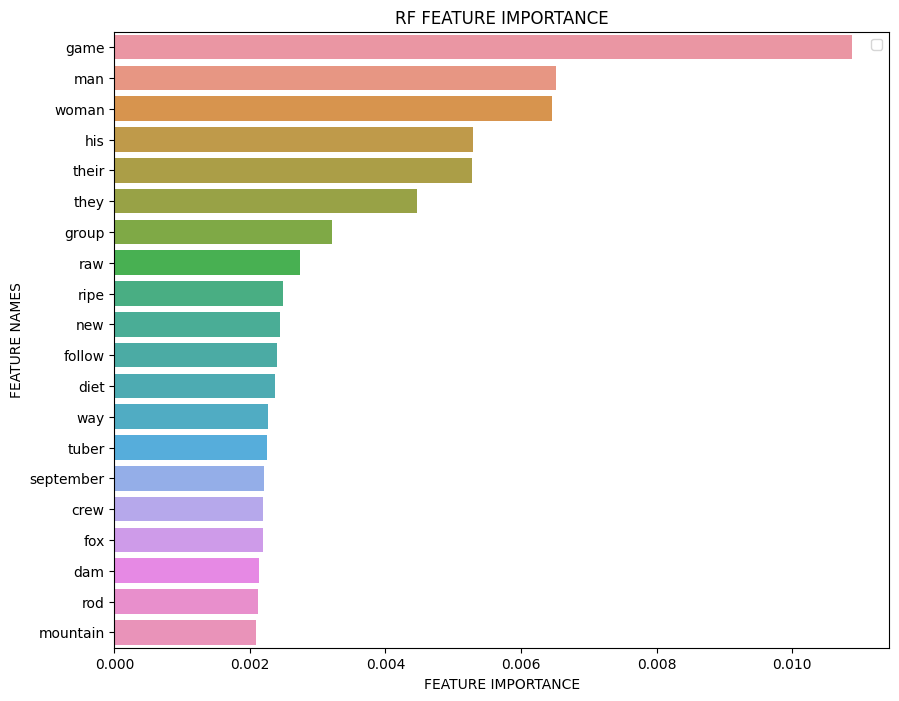

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'young', 'their', 'they', 'boy', 'woman', 'game', 'girl', 'crew', 'new', 'man'}
Iteration 8
Exclude: {'certain', 'pool', 'shallow', 'fisherman', 'bird', 'pit', 'dig', 'edible', 'cut', 'deep', 'palm', 'food', 'string', 'plant', 'month', 'people', 'ground', 'large', 'give', 'shore', 'shark', 'rice', 'area', 'fox', 'lake', 'bear', 'store', 'wild', 'fly', 'winter', 'basket', 'raw', 'duck', 'season', 'method', 'begin', 'neck', 'fruit', 'arrow', 'sheep', 'hole', 'hawk', 'wound', 'run', 'trap', 'fall', 'bait', 'end', 'buffalo', 'tree', 'family', 'house', 'collect', 'little', 'rat', 'rain', 'caribou', 'camp', 'fish', 'weir', 'vegetable', 'spear', 'make', 'travel', 'acorn', 'rock', 'coral', 'water', 'activity', 'come', 'call', 'period', 'seed', 'tuber', 'great', 'river', 'fire', 'trail', 'feather', 'dry', 'wing', 'stick', 'june', 'product', 'pigeon', 'net', 'deer', 'mouth', 'hook', 'life', 'nomadic', 'corn', 'form', 'root', 'beaver', 'early', 'stream', 'child', 'move', 'year', 

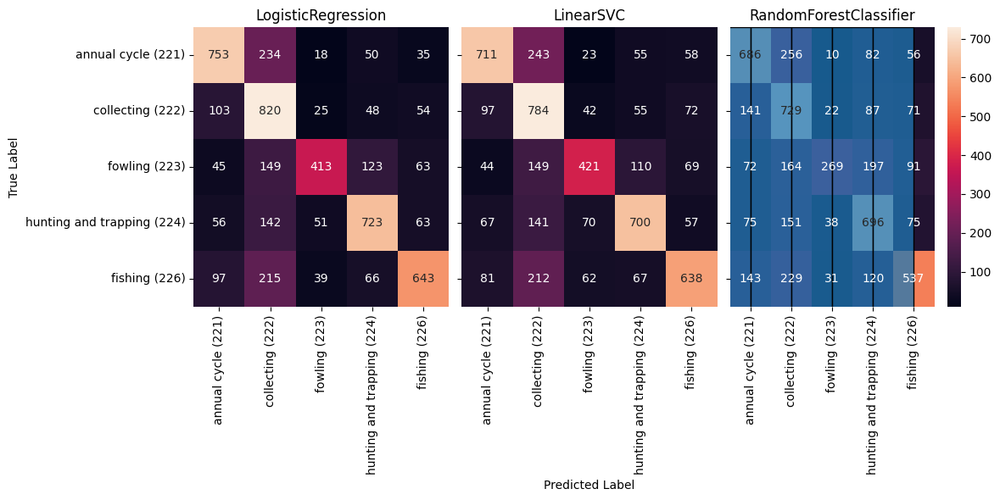

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6626889419252188
              precision    recall  f1-score   support

         221      0.705     0.686     0.695      1090
         222      0.528     0.773     0.627      1050
         223      0.761     0.521     0.618       793
         224      0.703     0.700     0.701      1035
         226      0.743     0.599     0.663      1060

    accuracy                          0.663      5028
   macro avg      0.688     0.656     0.661      5028
weighted avg      0.684     0.663     0.663      5028



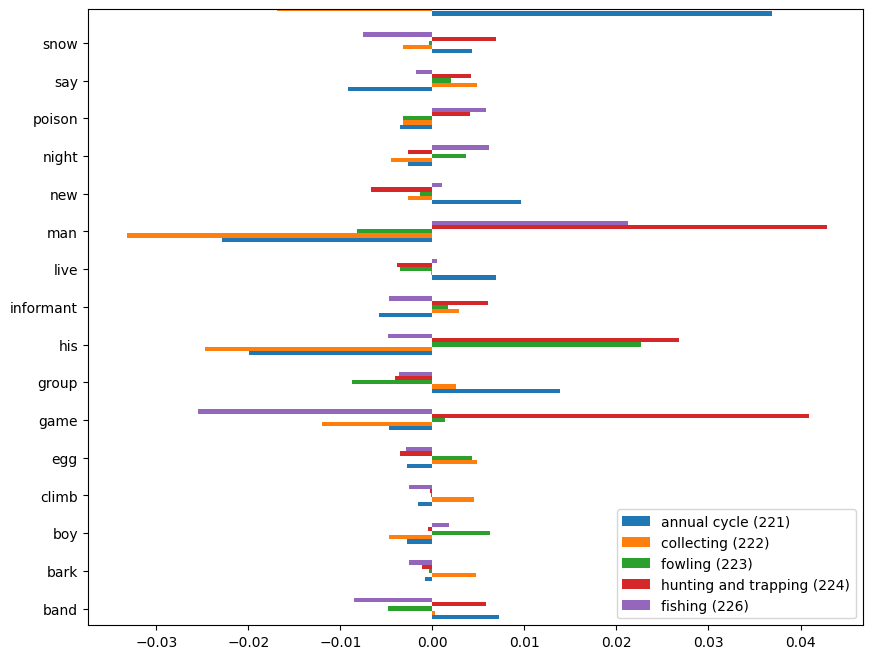

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6431980906921241
              precision    recall  f1-score   support

         221      0.700     0.651     0.675      1090
         222      0.503     0.737     0.598      1050
         223      0.692     0.531     0.601       793
         224      0.709     0.677     0.693      1035
         226      0.715     0.592     0.648      1060

    accuracy                          0.643      5028
   macro avg      0.664     0.638     0.643      5028
weighted avg      0.663     0.643     0.645      5028



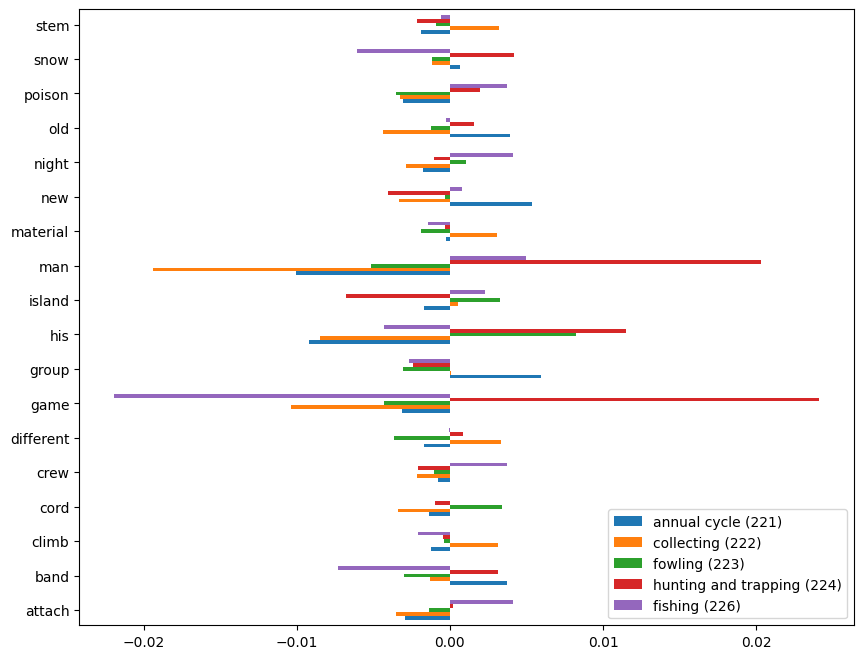

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.5773667462211615
              precision    recall  f1-score   support

         221      0.616     0.639     0.627      1090
         222      0.474     0.680     0.559      1050
         223      0.733     0.353     0.477       793
         224      0.578     0.669     0.620      1035
         226      0.641     0.491     0.556      1060

    accuracy                          0.577      5028
   macro avg      0.608     0.566     0.568      5028
weighted avg      0.602     0.577     0.573      5028



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


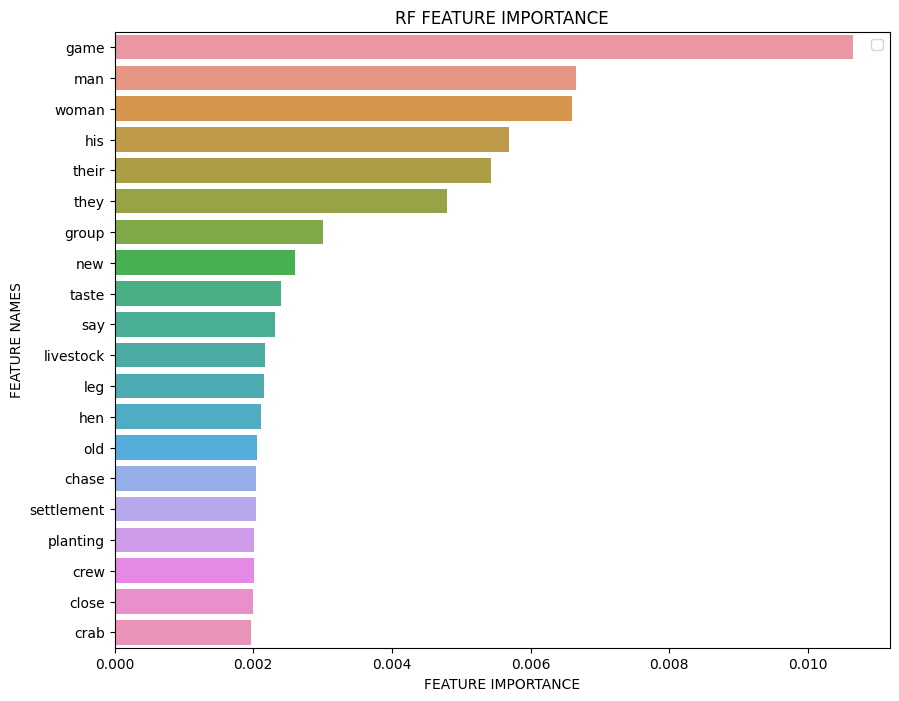

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'young', 'their', 'they', 'boy', 'woman', 'game', 'crew', 'new', 'old', 'man'}
Iteration 9
Exclude: {'certain', 'pool', 'shallow', 'fisherman', 'bird', 'pit', 'dig', 'edible', 'cut', 'deep', 'palm', 'food', 'string', 'plant', 'month', 'hen', 'people', 'ground', 'live', 'large', 'stem', 'give', 'shore', 'shark', 'rice', 'egg', 'area', 'fox', 'lake', 'bear', 'store', 'wild', 'fly', 'winter', 'basket', 'raw', 'duck', 'season', 'method', 'begin', 'neck', 'fruit', 'arrow', 'sheep', 'hole', 'hawk', 'island', 'wound', 'run', 'trap', 'fall', 'bait', 'leg', 'end', 'buffalo', 'tree', 'family', 'house', 'informant', 'poison', 'collect', 'little', 'rat', 'rain', 'caribou', 'camp', 'fish', 'weir', 'vegetable', 'spear', 'make', 'travel', 'acorn', 'rock', 'coral', 'water', 'activity', 'come', 'call', 'period', 'seed', 'tuber', 'great', 'say', 'river', 'fire', 'trail', 'feather', 'dry', 'wing', 'stick', 'june', 'product', 'pigeon', 'net', 'bark', 'deer', 'mouth', 'hook', 'life', 'clos

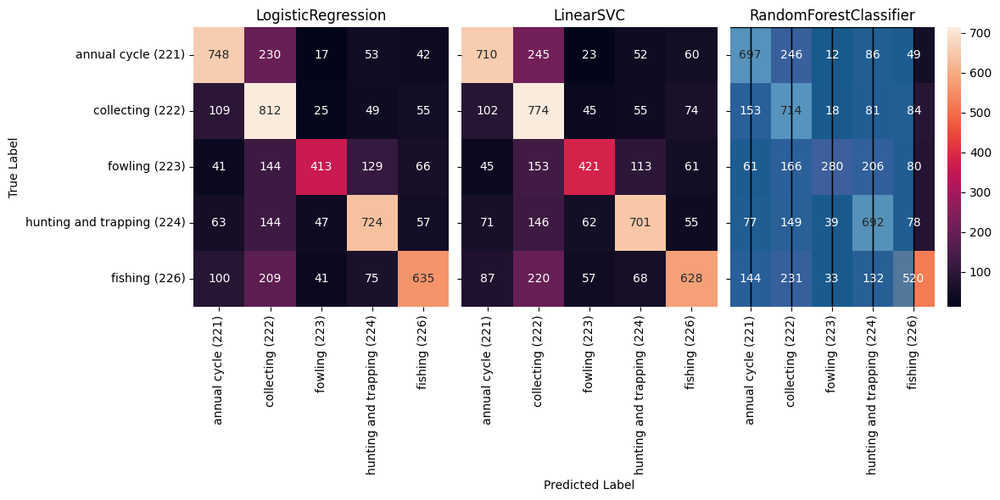

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6553301511535402
              precision    recall  f1-score   support

         221      0.703     0.690     0.697      1090
         222      0.521     0.760     0.618      1050
         223      0.757     0.511     0.610       793
         224      0.697     0.695     0.696      1035
         226      0.722     0.586     0.647      1060

    accuracy                          0.655      5028
   macro avg      0.680     0.648     0.653      5028
weighted avg      0.676     0.655     0.656      5028



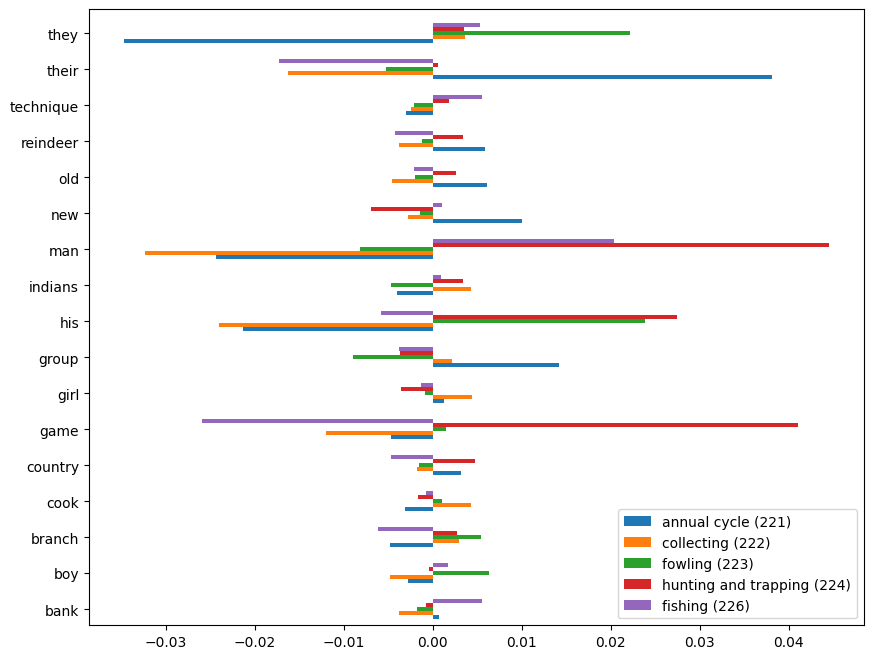

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.640612569610183
              precision    recall  f1-score   support

         221      0.695     0.652     0.673      1090
         222      0.499     0.730     0.593      1050
         223      0.693     0.536     0.605       793
         224      0.710     0.682     0.696      1035
         226      0.711     0.578     0.638      1060

    accuracy                          0.641      5028
   macro avg      0.662     0.636     0.641      5028
weighted avg      0.660     0.641     0.643      5028



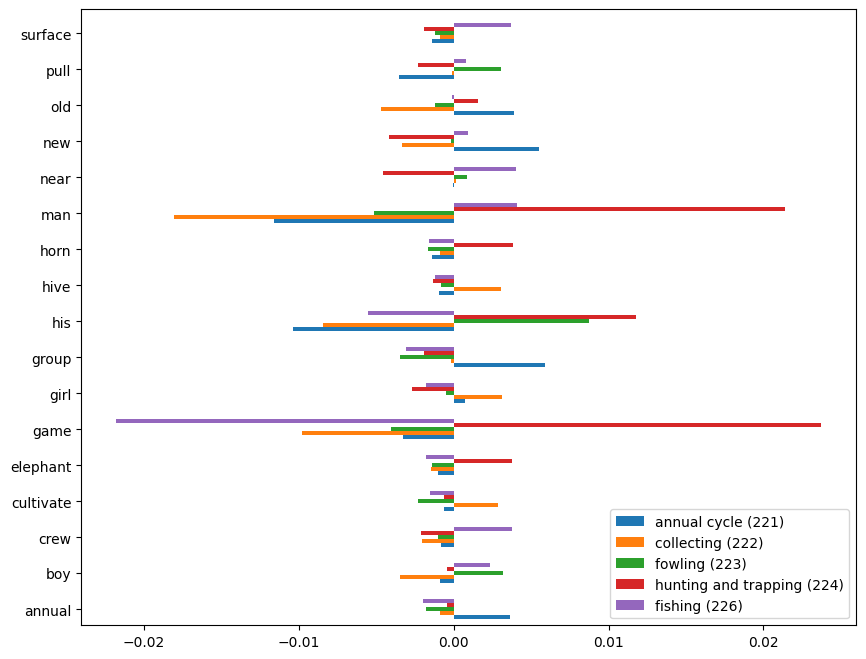

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.5666268894192522
              precision    recall  f1-score   support

         221      0.592     0.624     0.608      1090
         222      0.464     0.677     0.551      1050
         223      0.741     0.346     0.471       793
         224      0.581     0.662     0.619      1035
         226      0.625     0.471     0.537      1060

    accuracy                          0.567      5028
   macro avg      0.600     0.556     0.557      5028
weighted avg      0.593     0.567     0.562      5028



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


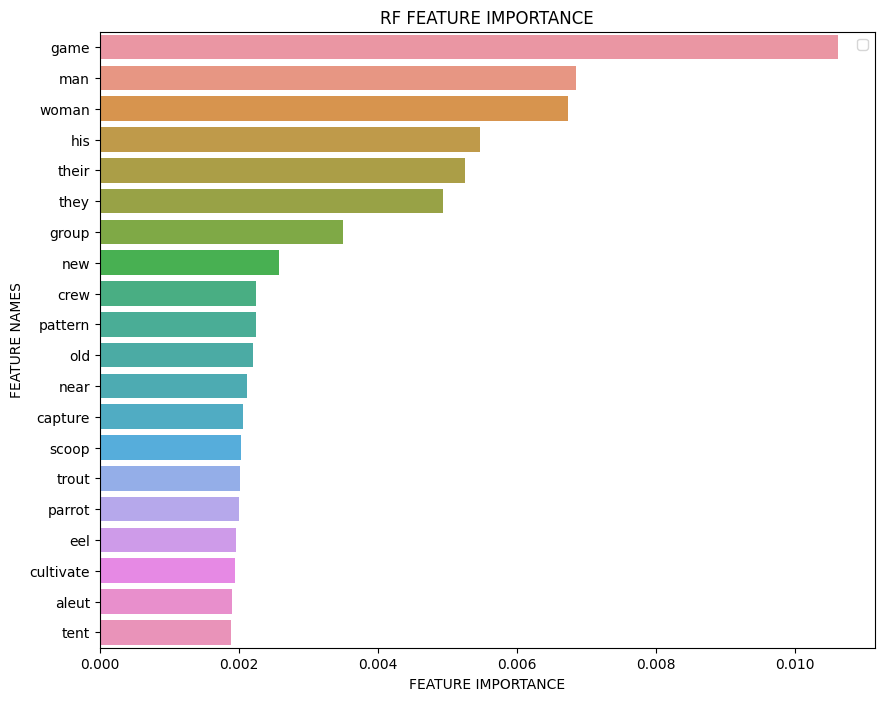

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'young', 'their', 'they', 'boy', 'woman', 'game', 'girl', 'crew', 'new', 'old', 'man'}
Iteration 10
Exclude: {'certain', 'pool', 'shallow', 'fisherman', 'bird', 'pit', 'dig', 'edible', 'cut', 'country', 'deep', 'pull', 'palm', 'food', 'string', 'plant', 'month', 'variety', 'hen', 'elephant', 'surface', 'people', 'indians', 'ground', 'live', 'large', 'stem', 'give', 'tent', 'shore', 'shark', 'rice', 'annual', 'egg', 'area', 'fox', 'lake', 'bear', 'store', 'wild', 'fly', 'winter', 'basket', 'raw', 'duck', 'season', 'method', 'begin', 'neck', 'fruit', 'arrow', 'scoop', 'sheep', 'hole', 'hawk', 'wound', 'island', 'run', 'trap', 'fall', 'bait', 'leg', 'end', 'buffalo', 'tree', 'family', 'house', 'informant', 'poison', 'collect', 'little', 'rat', 'technique', 'rain', 'caribou', 'type', 'camp', 'fish', 'weir', 'vegetable', 'spear', 'make', 'travel', 'acorn', 'rock', 'coral', 'water', 'activity', 'eel', 'come', 'call', 'turn', 'period', 'seed', 'tuber', 'great', 'say', 'river'

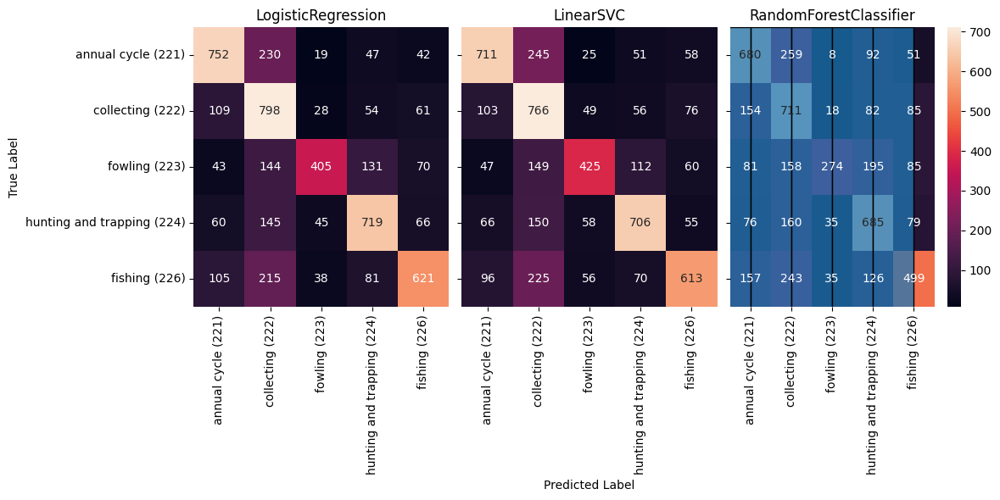

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6453858392999204
              precision    recall  f1-score   support

         221      0.699     0.679     0.689      1090
         222      0.513     0.753     0.610      1050
         223      0.735     0.494     0.591       793
         224      0.693     0.688     0.691      1035
         226      0.704     0.575     0.633      1060

    accuracy                          0.645      5028
   macro avg      0.669     0.638     0.643      5028
weighted avg      0.666     0.645     0.646      5028



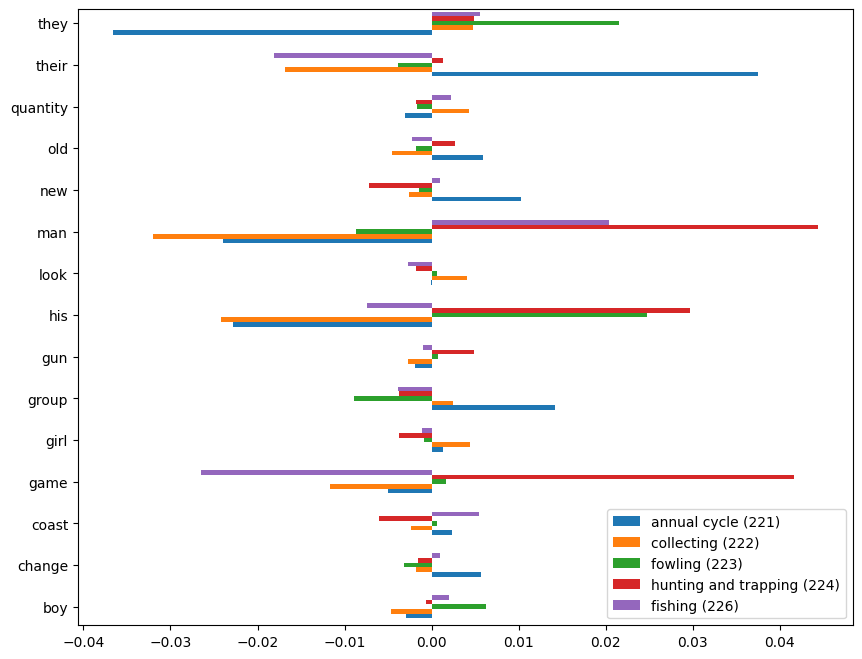

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6274860779634049
              precision    recall  f1-score   support

         221      0.686     0.633     0.658      1090
         222      0.491     0.717     0.583      1050
         223      0.668     0.525     0.588       793
         224      0.689     0.675     0.682      1035
         226      0.702     0.563     0.625      1060

    accuracy                          0.627      5028
   macro avg      0.647     0.623     0.627      5028
weighted avg      0.646     0.627     0.629      5028



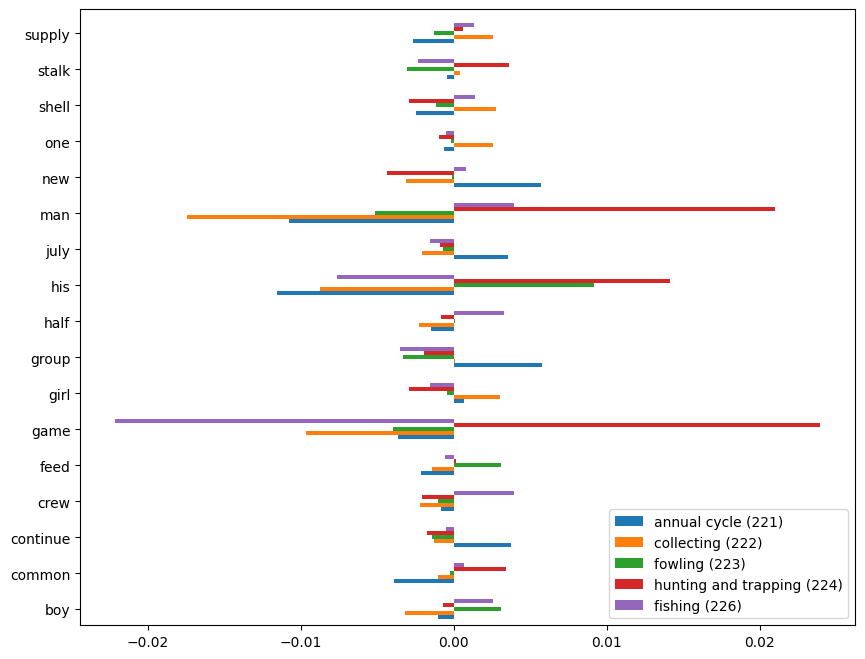

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.5612569610182976
              precision    recall  f1-score   support

         221      0.588     0.612     0.600      1090
         222      0.467     0.678     0.553      1050
         223      0.707     0.338     0.457       793
         224      0.561     0.670     0.610      1035
         226      0.638     0.455     0.531      1060

    accuracy                          0.561      5028
   macro avg      0.592     0.550     0.550      5028
weighted avg      0.587     0.561     0.555      5028



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


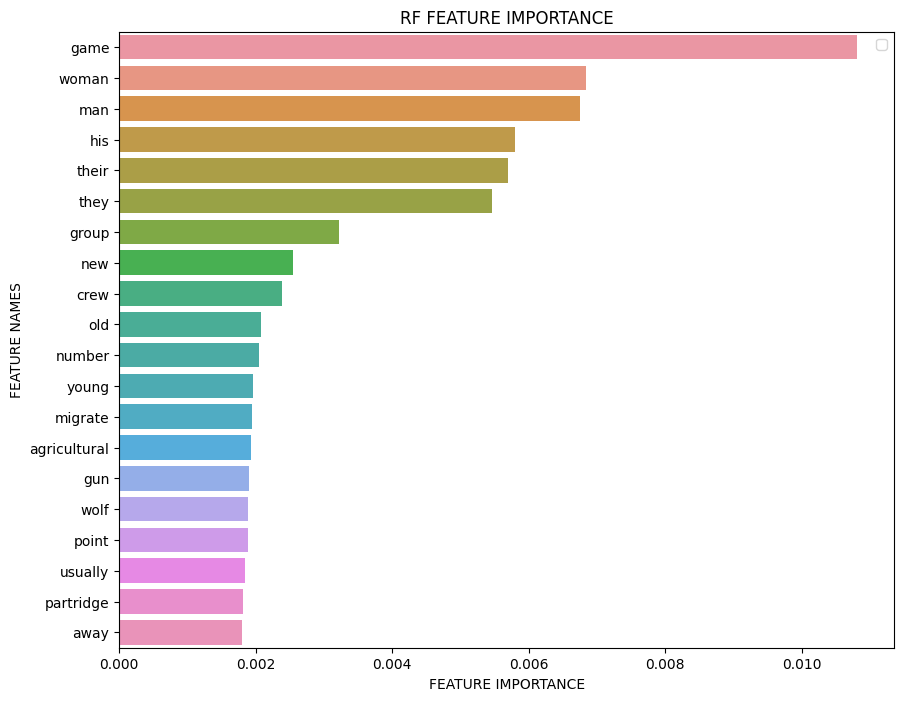

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'young', 'their', 'they', 'boy', 'woman', 'game', 'girl', 'crew', 'one', 'new', 'old', 'man'}


Balanced: False
Iteration 1
Exclude: set()

(7402,) (7402,)
7402 documents - 3.24MB (training set)
5 categories


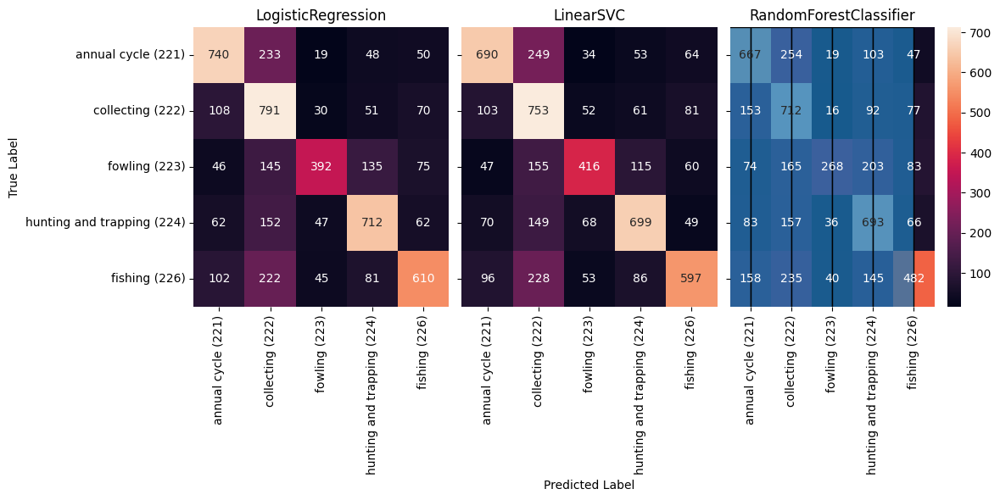

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8343088698784331
              precision    recall  f1-score   support

         221      0.821     0.416     0.552       154
         222      0.932     0.523     0.670       132
         223      0.904     0.580     0.707       212
         224      0.778     0.968     0.863      1087
         226      0.938     0.857     0.896       636

    accuracy                          0.834      2221
   macro avg      0.875     0.669     0.737      2221
weighted avg      0.848     0.834     0.824      2221



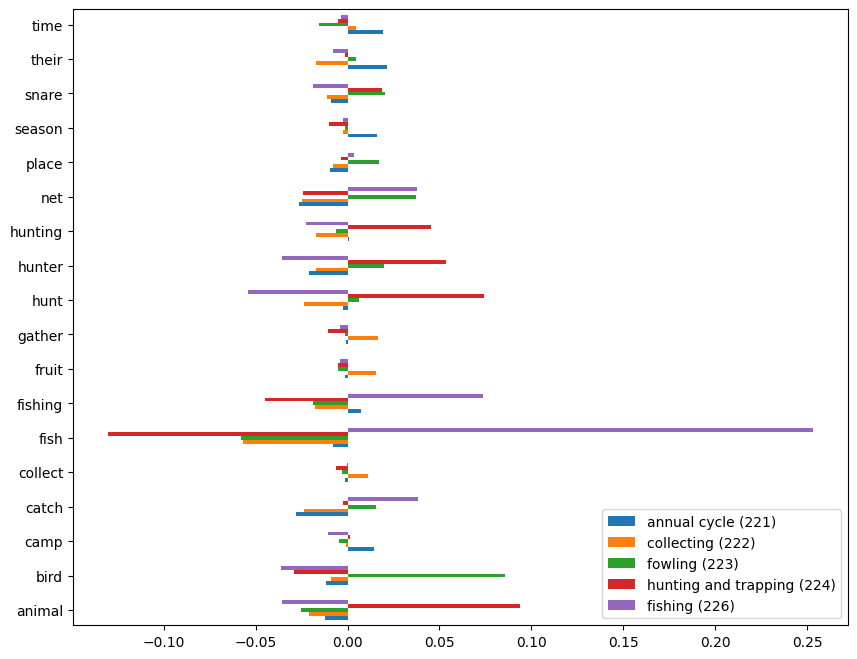

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8496172895092301
              precision    recall  f1-score   support

         221      0.713     0.468     0.565       154
         222      0.821     0.697     0.754       132
         223      0.856     0.703     0.772       212
         224      0.820     0.946     0.878      1087
         226      0.941     0.858     0.898       636

    accuracy                          0.850      2221
   macro avg      0.830     0.734     0.773      2221
weighted avg      0.851     0.850     0.845      2221



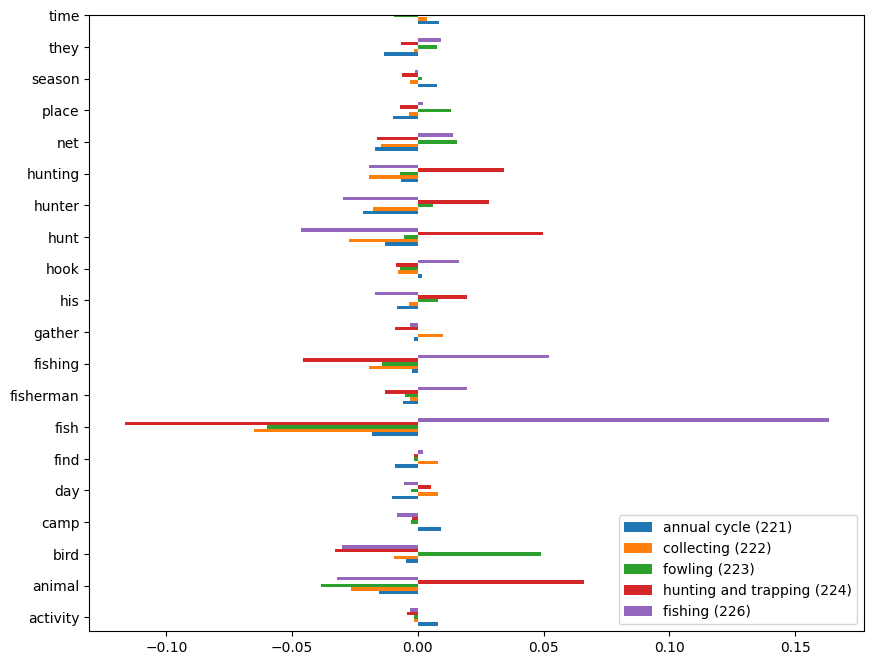

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.8117964880684376
              precision    recall  f1-score   support

         221      0.790     0.318     0.454       154
         222      0.904     0.500     0.644       132
         223      0.908     0.420     0.574       212
         224      0.766     0.961     0.853      1087
         226      0.888     0.871     0.879       636

    accuracy                          0.812      2221
   macro avg      0.851     0.614     0.681      2221
weighted avg      0.824     0.812     0.794      2221



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


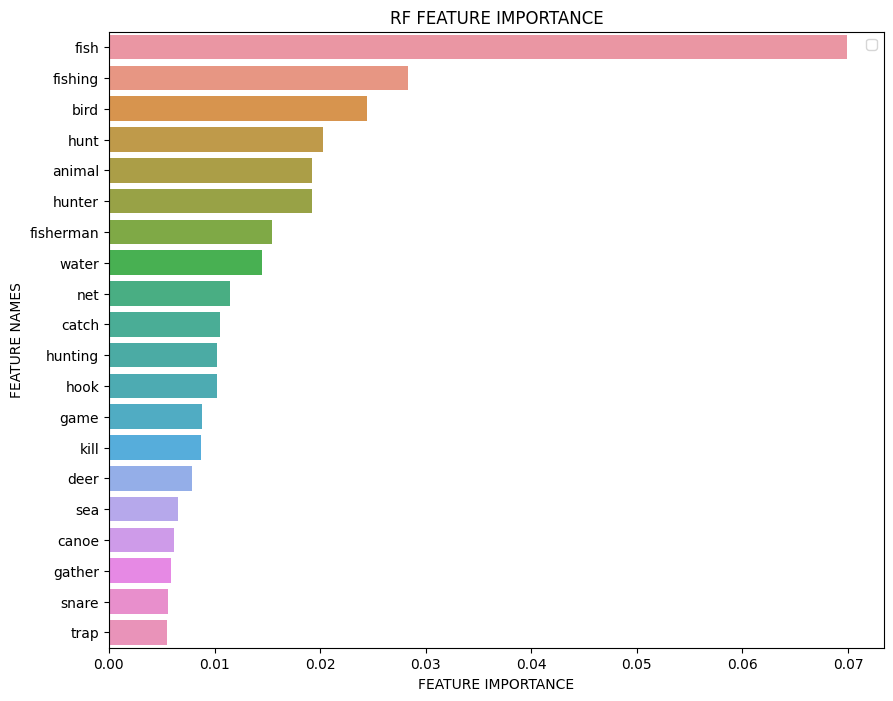

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'their', 'they', 'his', 'game'}
Iteration 2
Exclude: {'hunter', 'tree', 'fisherman', 'bird', 'collect', 'gather', 'hunting', 'camp', 'fish', 'place', 'find', 'water', 'activity', 'day', 'wild', 'winter', 'canoe', 'catch', 'season', 'net', 'deer', 'fruit', 'snare', 'hook', 'animal', 'time', 'fishing', 'sea', 'kill', 'hunt', 'trap'}

(7402,) (7402,)
7402 documents - 3.24MB (training set)
5 categories


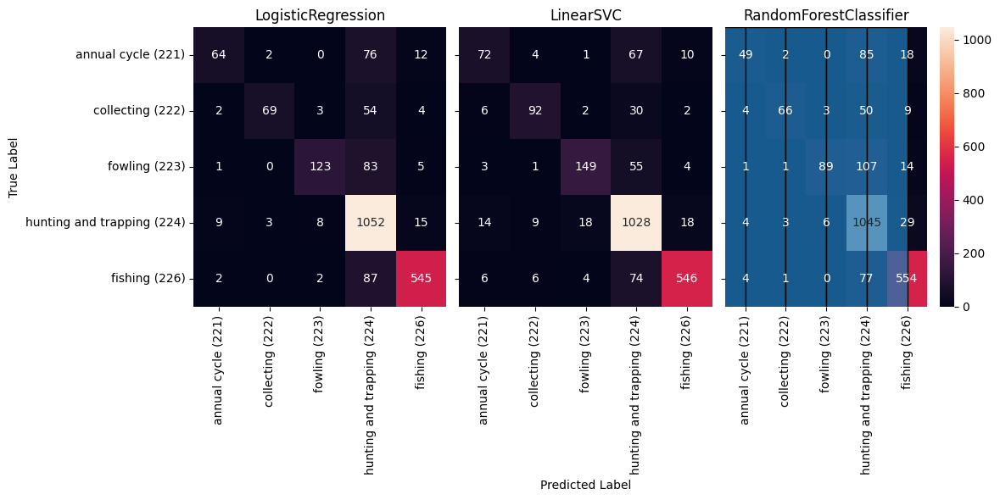

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.764970733903647
              precision    recall  f1-score   support

         221      0.797     0.331     0.468       154
         222      0.891     0.371     0.524       132
         223      0.904     0.354     0.508       212
         224      0.727     0.945     0.822      1087
         226      0.820     0.781     0.800       636

    accuracy                          0.765      2221
   macro avg      0.828     0.556     0.624      2221
weighted avg      0.785     0.765     0.743      2221



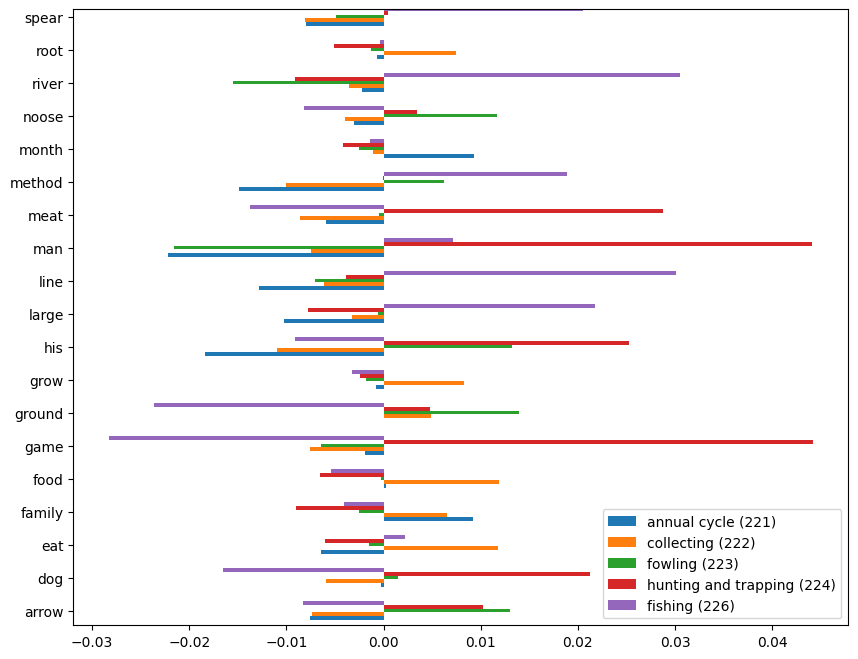

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7915353444394417
              precision    recall  f1-score   support

         221      0.685     0.396     0.502       154
         222      0.809     0.576     0.673       132
         223      0.835     0.547     0.661       212
         224      0.774     0.918     0.840      1087
         226      0.833     0.797     0.814       636

    accuracy                          0.792      2221
   macro avg      0.787     0.647     0.698      2221
weighted avg      0.792     0.792     0.782      2221



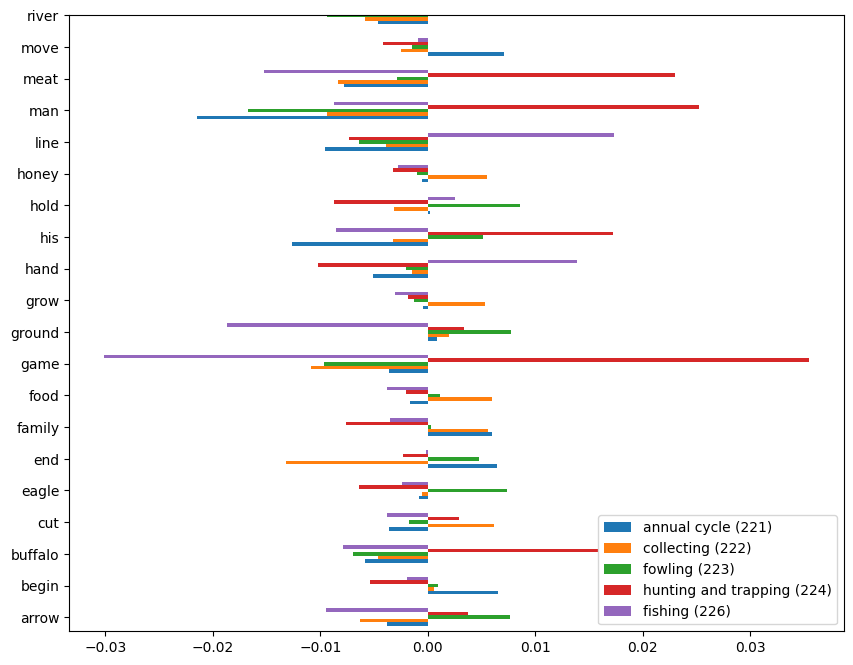

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7393066186402522
              precision    recall  f1-score   support

         221      0.789     0.292     0.427       154
         222      0.797     0.386     0.520       132
         223      0.933     0.264     0.412       212
         224      0.709     0.934     0.806      1087
         226      0.780     0.747     0.763       636

    accuracy                          0.739      2221
   macro avg      0.802     0.525     0.586      2221
weighted avg      0.762     0.739     0.713      2221



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


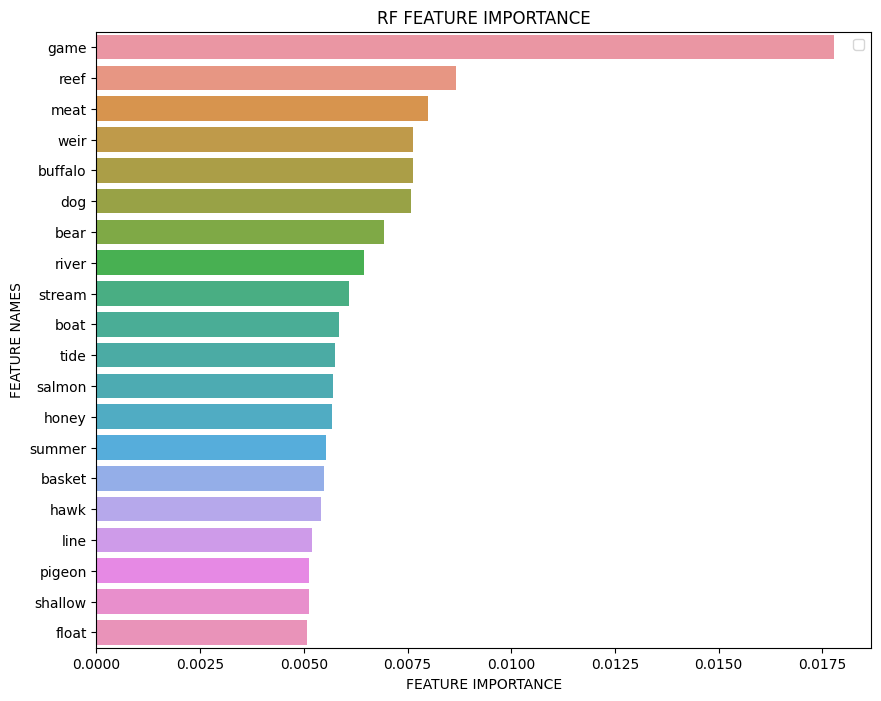

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'man'}
Iteration 3
Exclude: {'end', 'buffalo', 'hunter', 'honey', 'tree', 'shallow', 'family', 'fisherman', 'bird', 'tide', 'line', 'cut', 'meat', 'collect', 'boat', 'gather', 'food', 'hunting', 'camp', 'fish', 'month', 'weir', 'place', 'spear', 'sea', 'find', 'ground', 'day', 'large', 'water', 'activity', 'float', 'grow', 'eat', 'river', 'bear', 'wild', 'basket', 'winter', 'canoe', 'catch', 'noose', 'pigeon', 'season', 'method', 'begin', 'net', 'salmon', 'fruit', 'deer', 'hook', 'snare', 'arrow', 'animal', 'hold', 'reef', 'eagle', 'summer', 'spring', 'root', 'stream', 'dog', 'time', 'fishing', 'move', 'small', 'hawk', 'hand', 'kill', 'hunt', 'trap'}

(7402,) (7402,)
7402 documents - 3.24MB (training set)
5 categories


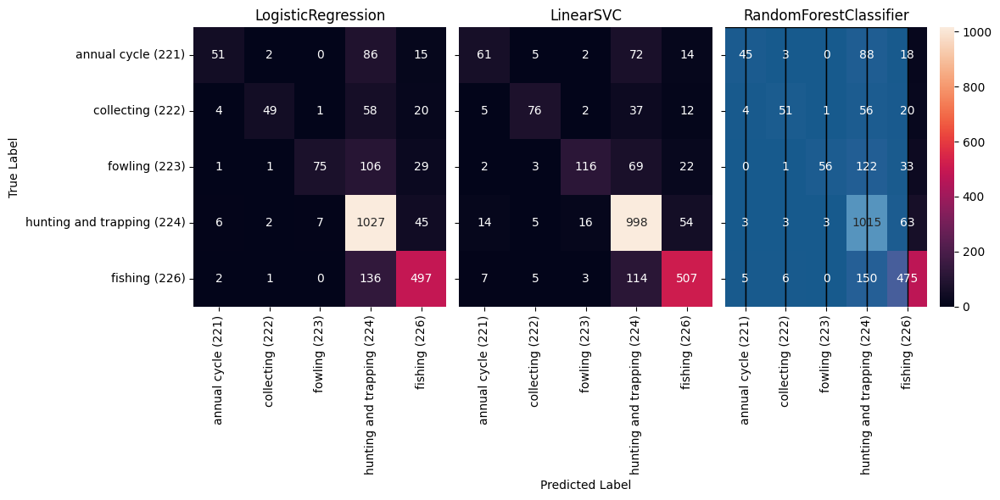

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7406573615488519
              precision    recall  f1-score   support

         221      0.807     0.299     0.436       154
         222      0.872     0.311     0.458       132
         223      0.909     0.283     0.432       212
         224      0.705     0.942     0.806      1087
         226      0.793     0.745     0.768       636

    accuracy                          0.741      2221
   macro avg      0.817     0.516     0.580      2221
weighted avg      0.766     0.741     0.713      2221



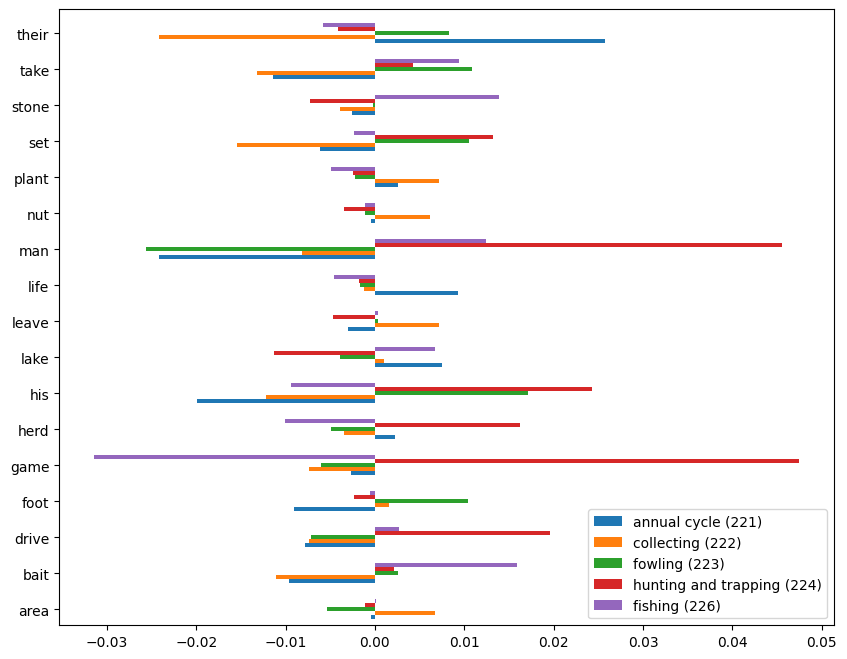

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7663214768122467
              precision    recall  f1-score   support

         221      0.738     0.403     0.521       154
         222      0.811     0.553     0.658       132
         223      0.803     0.481     0.602       212
         224      0.747     0.905     0.819      1087
         226      0.798     0.756     0.776       636

    accuracy                          0.766      2221
   macro avg      0.779     0.620     0.675      2221
weighted avg      0.770     0.766     0.756      2221



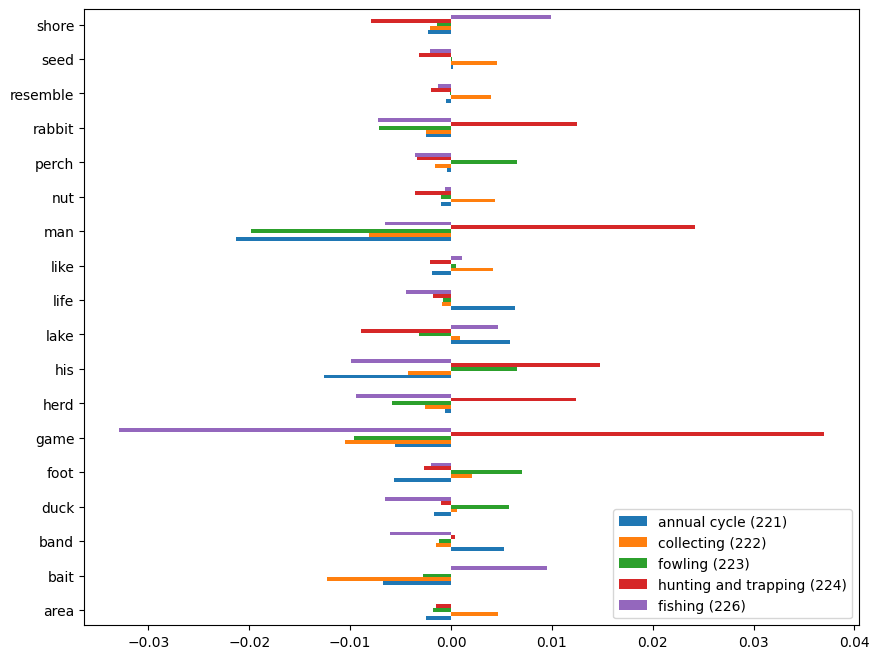

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7109410175596578
              precision    recall  f1-score   support

         221      0.759     0.266     0.394       154
         222      0.739     0.386     0.507       132
         223      0.804     0.212     0.336       212
         224      0.690     0.925     0.790      1087
         226      0.748     0.686     0.715       636

    accuracy                          0.711      2221
   macro avg      0.748     0.495     0.549      2221
weighted avg      0.725     0.711     0.681      2221



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


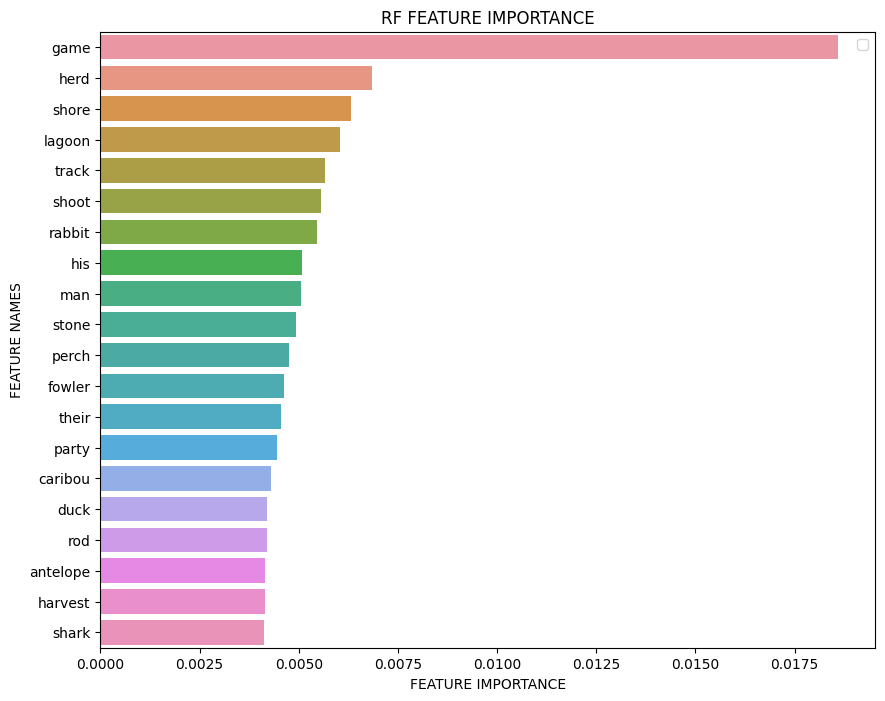

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'man'}
Iteration 4
Exclude: {'shallow', 'fisherman', 'bird', 'cut', 'food', 'plant', 'month', 'ground', 'large', 'shore', 'shark', 'area', 'lake', 'bear', 'wild', 'basket', 'winter', 'duck', 'season', 'method', 'begin', 'fruit', 'arrow', 'hawk', 'trap', 'bait', 'end', 'buffalo', 'tree', 'family', 'collect', 'caribou', 'camp', 'fish', 'weir', 'spear', 'water', 'activity', 'seed', 'river', 'pigeon', 'net', 'deer', 'hook', 'life', 'root', 'stream', 'move', 'year', 'hold', 'perch', 'stone', 'rod', 'like', 'meat', 'boat', 'gather', 'nut', 'day', 'set', 'float', 'grow', 'eat', 'use', 'catch', 'noose', 'party', 'eagle', 'harvest', 'foot', 'antelope', 'leave', 'dog', 'time', 'small', 'hunter', 'honey', 'village', 'tide', 'line', 'herd', 'resemble', 'band', 'drive', 'lagoon', 'hunting', 'place', 'shoot', 'find', 'fowler', 'rabbit', 'canoe', 'salmon', 'snare', 'animal', 'reef', 'summer', 'track', 'spring', 'take', 'fishing', 'hand', 'sea', 'kill', 'hunt'

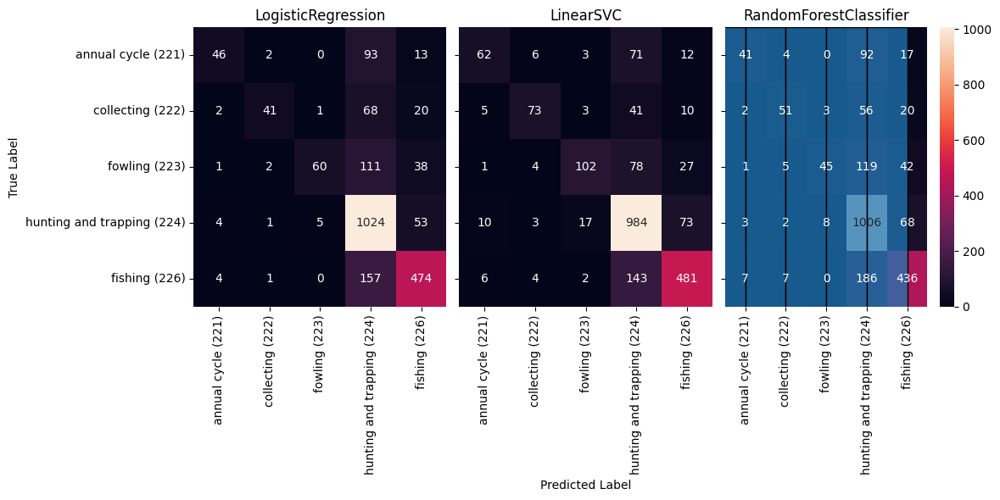

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7276001800990545
              precision    recall  f1-score   support

         221      0.851     0.260     0.398       154
         222      0.880     0.333     0.484       132
         223      0.862     0.236     0.370       212
         224      0.697     0.937     0.799      1087
         226      0.768     0.728     0.747       636

    accuracy                          0.728      2221
   macro avg      0.811     0.499     0.560      2221
weighted avg      0.754     0.728     0.697      2221



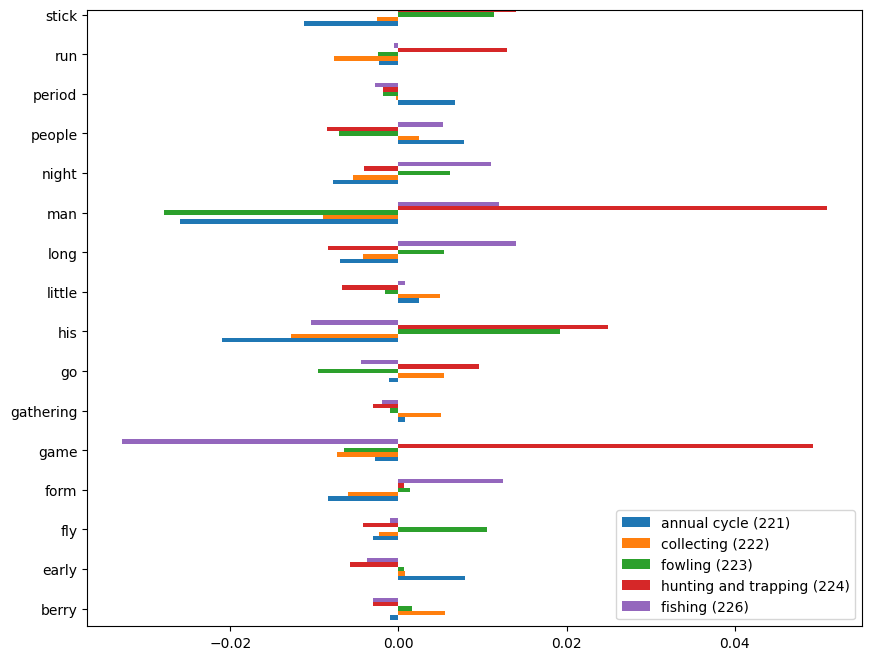

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.754615038271049
              precision    recall  f1-score   support

         221      0.721     0.403     0.517       154
         222      0.795     0.530     0.636       132
         223      0.752     0.443     0.558       212
         224      0.745     0.896     0.814      1087
         226      0.774     0.748     0.761       636

    accuracy                          0.755      2221
   macro avg      0.758     0.604     0.657      2221
weighted avg      0.755     0.755     0.743      2221



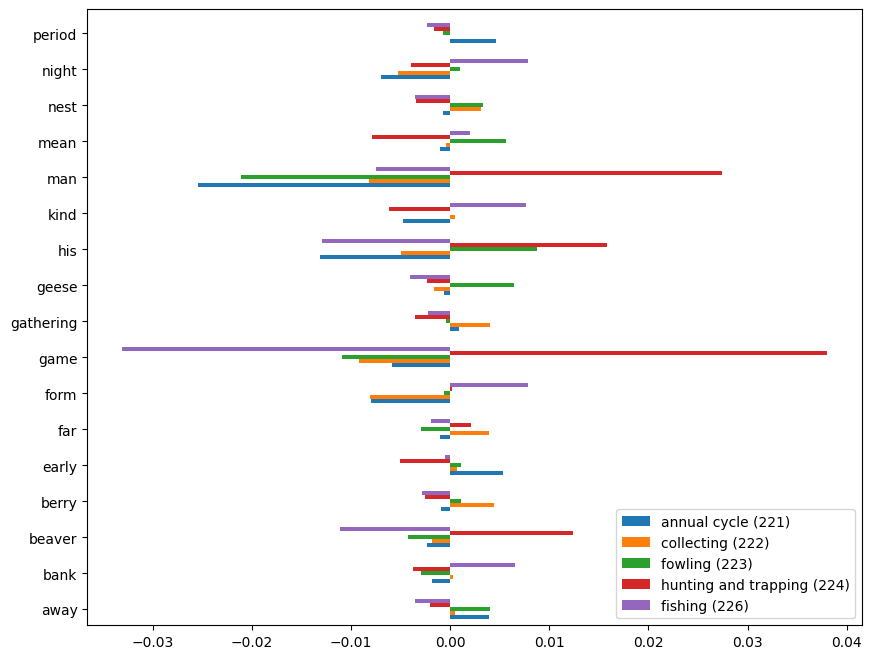

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6902296262944619
              precision    recall  f1-score   support

         221      0.772     0.286     0.417       154
         222      0.737     0.318     0.444       132
         223      0.805     0.156     0.261       212
         224      0.677     0.908     0.776      1087
         226      0.701     0.671     0.686       636

    accuracy                          0.690      2221
   macro avg      0.738     0.468     0.517      2221
weighted avg      0.706     0.690     0.656      2221



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


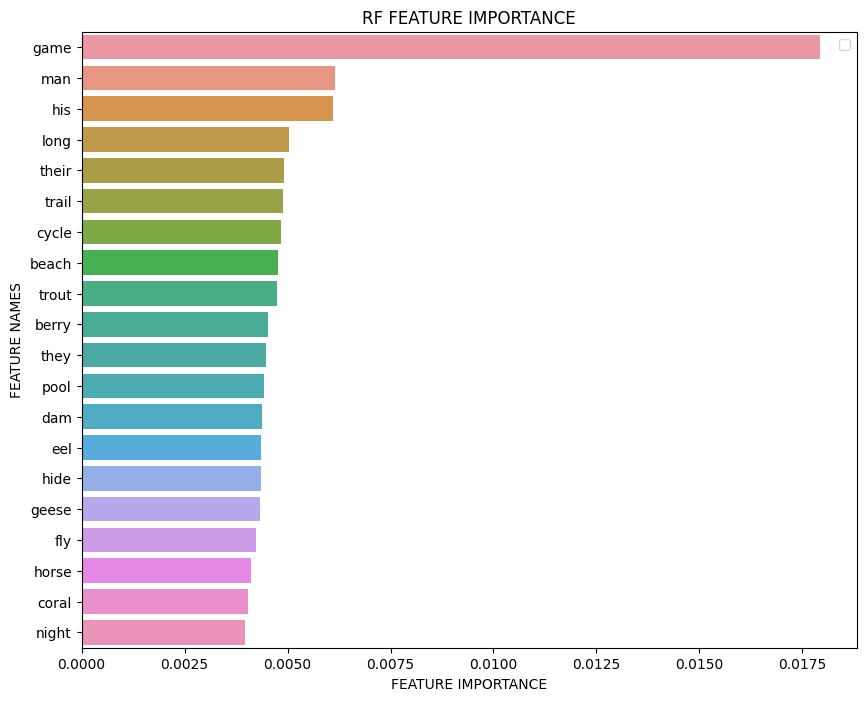

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'woman', 'their', 'they', 'game', 'man'}
Iteration 5
Exclude: {'pool', 'shallow', 'fisherman', 'bird', 'cut', 'food', 'plant', 'month', 'people', 'ground', 'large', 'shore', 'shark', 'rice', 'area', 'lake', 'bear', 'wild', 'basket', 'winter', 'fly', 'duck', 'season', 'method', 'begin', 'fruit', 'arrow', 'hawk', 'go', 'run', 'trap', 'bait', 'end', 'buffalo', 'tree', 'family', 'collect', 'little', 'caribou', 'camp', 'fish', 'weir', 'return', 'spear', 'coral', 'water', 'activity', 'eel', 'far', 'period', 'seed', 'river', 'trail', 'stick', 'trout', 'pigeon', 'net', 'deer', 'hook', 'life', 'form', 'root', 'beaver', 'early', 'stream', 'move', 'year', 'hold', 'perch', 'dam', 'night', 'stone', 'rod', 'like', 'meat', 'work', 'boat', 'gather', 'nut', 'nest', 'day', 'away', 'set', 'float', 'grow', 'hide', 'eat', 'use', 'catch', 'noose', 'party', 'eagle', 'harvest', 'cycle', 'foot', 'antelope', 'geese', 'leave', 'dog', 'time', 'horse', 'small', 'hunter', 'honey', 'village', 'tide', 'line',

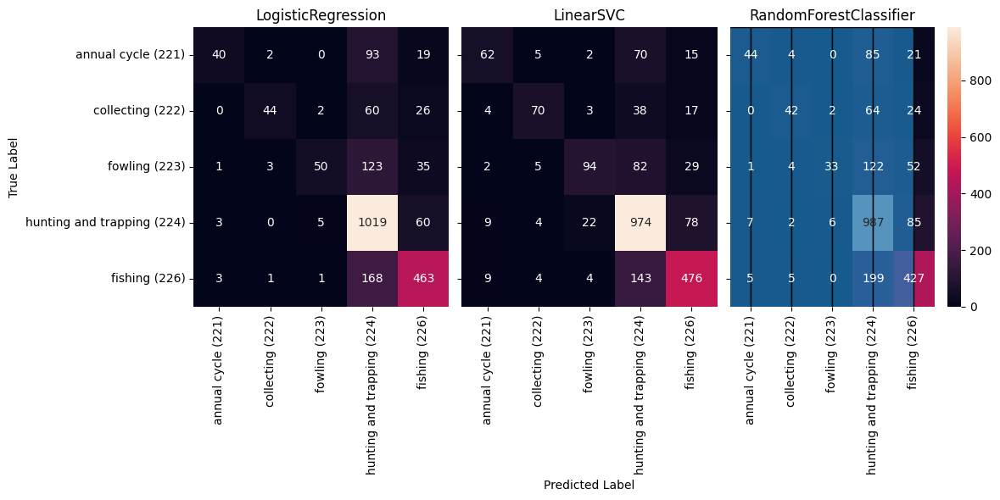

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7109410175596578
              precision    recall  f1-score   support

         221      0.830     0.253     0.388       154
         222      0.939     0.235     0.376       132
         223      0.865     0.212     0.341       212
         224      0.686     0.927     0.788      1087
         226      0.737     0.717     0.727       636

    accuracy                          0.711      2221
   macro avg      0.811     0.469     0.524      2221
weighted avg      0.743     0.711     0.676      2221



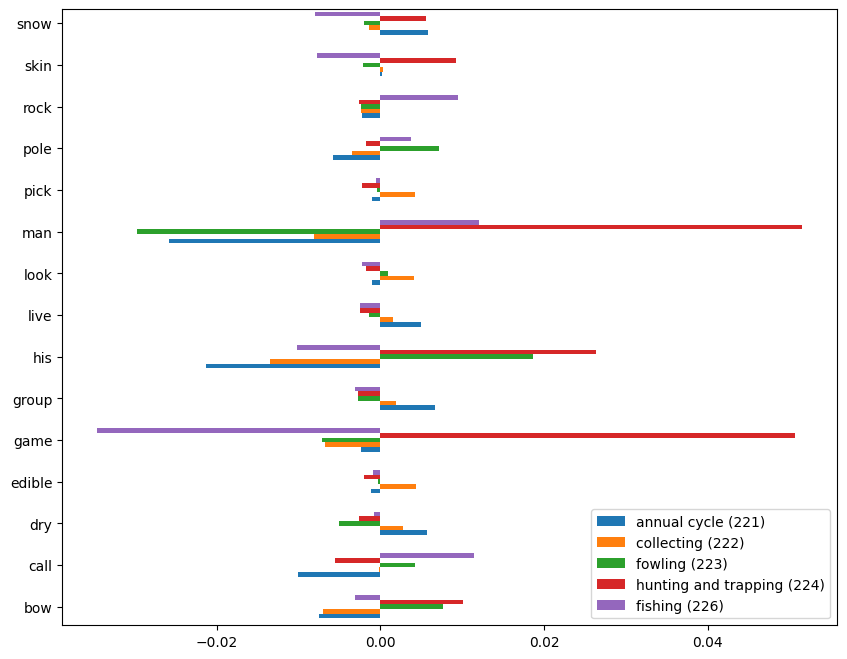

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7321026564610535
              precision    recall  f1-score   support

         221      0.701     0.396     0.506       154
         222      0.843     0.447     0.584       132
         223      0.701     0.387     0.498       212
         224      0.722     0.888     0.797      1087
         226      0.751     0.722     0.736       636

    accuracy                          0.732      2221
   macro avg      0.744     0.568     0.624      2221
weighted avg      0.734     0.732     0.718      2221



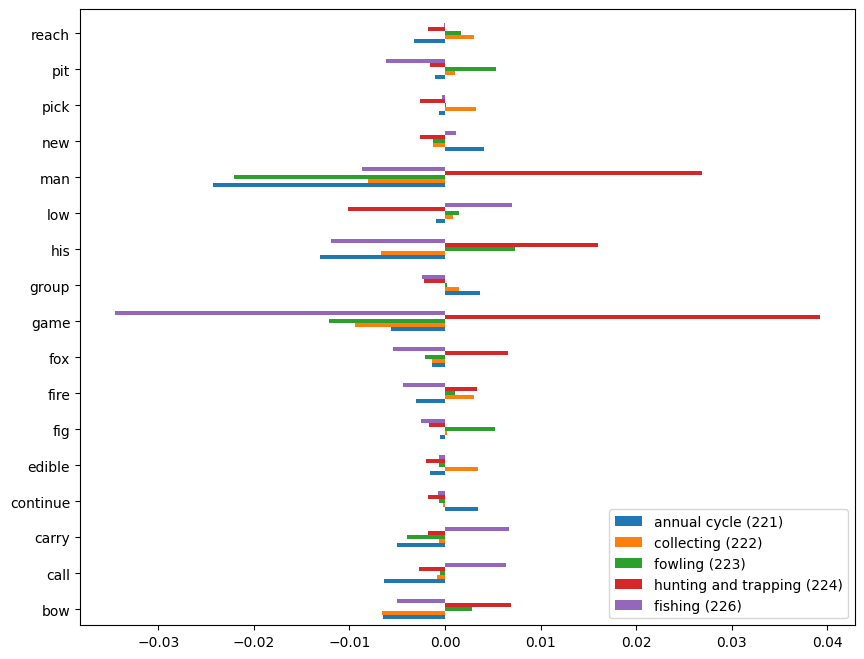

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6789734353894642
              precision    recall  f1-score   support

         221      0.702     0.260     0.379       154
         222      0.804     0.280     0.416       132
         223      0.676     0.108     0.187       212
         224      0.663     0.917     0.770      1087
         226      0.709     0.646     0.676       636

    accuracy                          0.679      2221
   macro avg      0.711     0.442     0.485      2221
weighted avg      0.688     0.679     0.639      2221



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


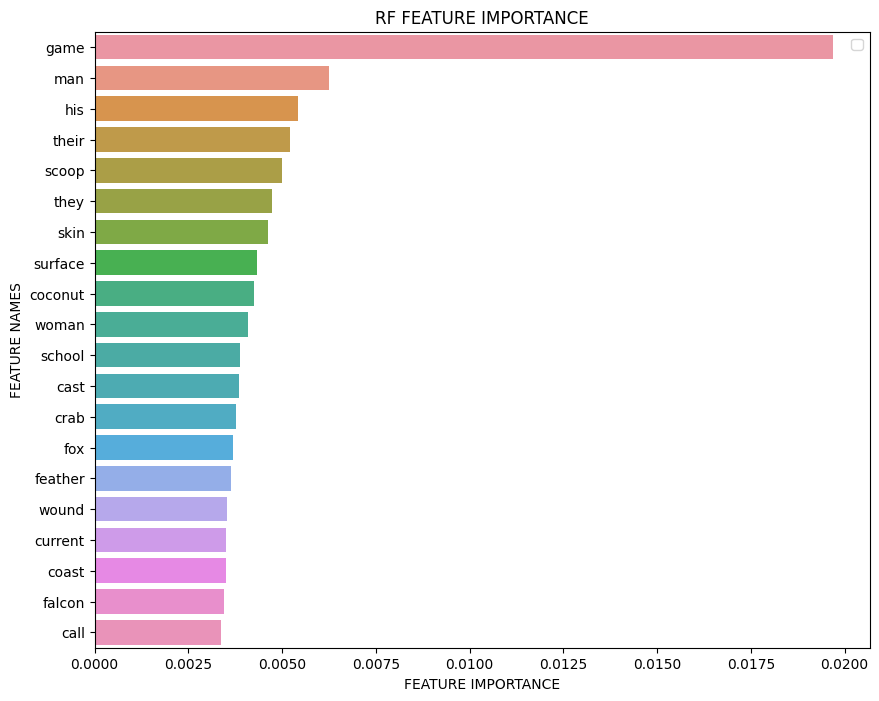

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'woman', 'their', 'they', 'game', 'new', 'man'}
Iteration 6
Exclude: {'continue', 'pool', 'shallow', 'fisherman', 'bird', 'pit', 'edible', 'cut', 'food', 'plant', 'month', 'variety', 'surface', 'people', 'ground', 'live', 'large', 'cast', 'coconut', 'shore', 'shark', 'rice', 'area', 'fox', 'lake', 'bear', 'wild', 'basket', 'winter', 'fly', 'duck', 'season', 'method', 'begin', 'fruit', 'coast', 'arrow', 'scoop', 'hawk', 'go', 'wound', 'run', 'trap', 'bait', 'end', 'buffalo', 'tree', 'family', 'school', 'collect', 'little', 'caribou', 'camp', 'fish', 'weir', 'return', 'spear', 'rock', 'coral', 'water', 'activity', 'eel', 'current', 'call', 'far', 'period', 'seed', 'river', 'fire', 'trail', 'dry', 'feather', 'stick', 'trout', 'pigeon', 'net', 'deer', 'hook', 'life', 'form', 'root', 'beaver', 'early', 'stream', 'move', 'rise', 'year', 'hold', 'perch', 'dam', 'night', 'snow', 'stone', 'rod', 'pole', 'like', 'meat', 'work', 'carry', 'falcon', 'boat', 'gather', 'nut', 'nest',

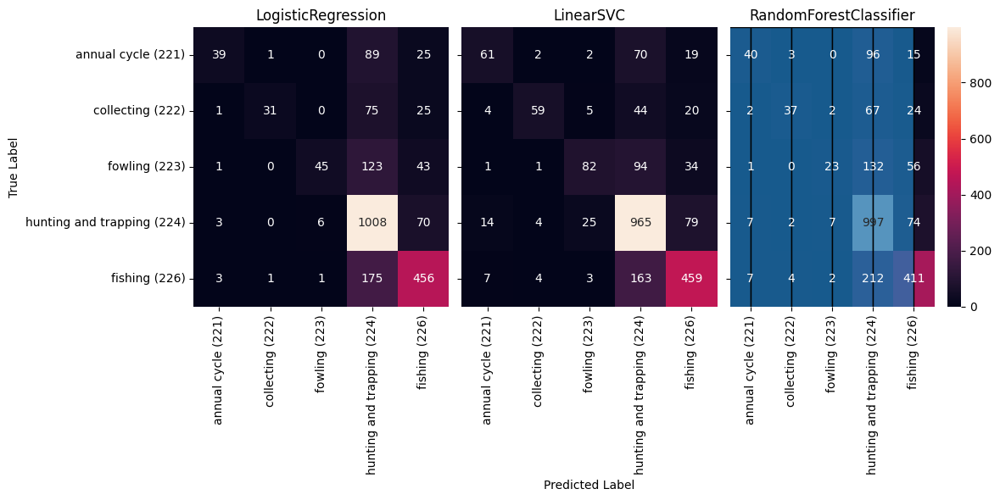

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.70013507429086
              precision    recall  f1-score   support

         221      0.818     0.234     0.364       154
         222      0.900     0.205     0.333       132
         223      0.902     0.217     0.350       212
         224      0.677     0.925     0.782      1087
         226      0.722     0.692     0.707       636

    accuracy                          0.700      2221
   macro avg      0.804     0.455     0.507      2221
weighted avg      0.734     0.700     0.663      2221



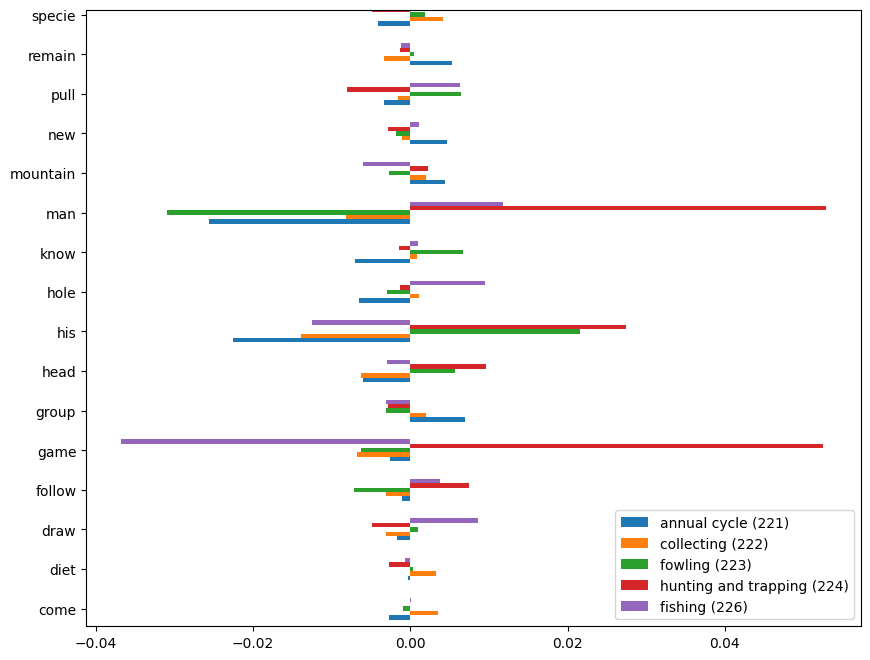

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7239981990094552
              precision    recall  f1-score   support

         221      0.656     0.396     0.494       154
         222      0.789     0.424     0.552       132
         223      0.700     0.396     0.506       212
         224      0.723     0.884     0.796      1087
         226      0.734     0.701     0.717       636

    accuracy                          0.724      2221
   macro avg      0.720     0.560     0.613      2221
weighted avg      0.723     0.724     0.710      2221



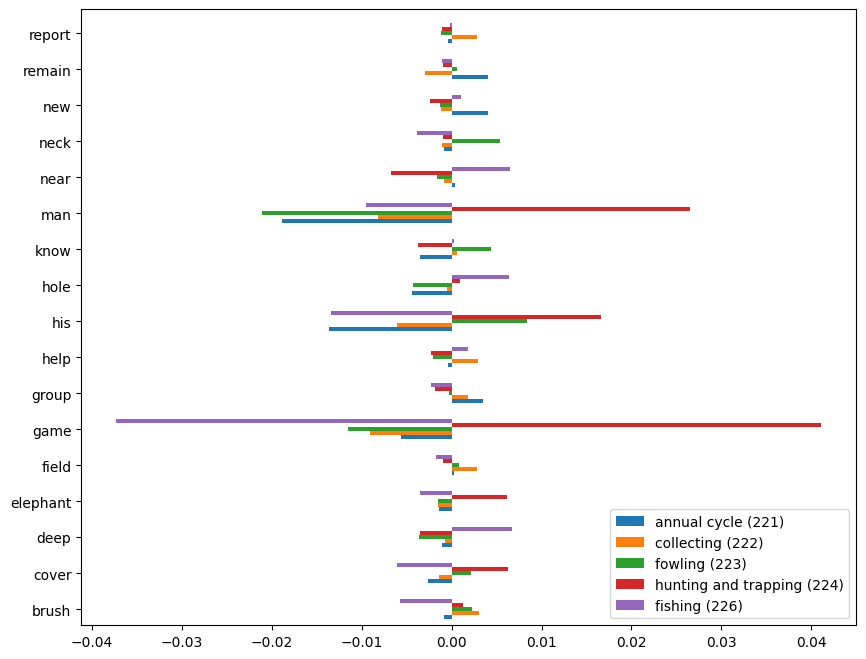

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6636650157586673
              precision    recall  f1-score   support

         221      0.732     0.266     0.390       154
         222      0.756     0.258     0.384       132
         223      0.677     0.099     0.173       212
         224      0.650     0.908     0.758      1087
         226      0.685     0.615     0.648       636

    accuracy                          0.664      2221
   macro avg      0.700     0.429     0.471      2221
weighted avg      0.675     0.664     0.623      2221



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


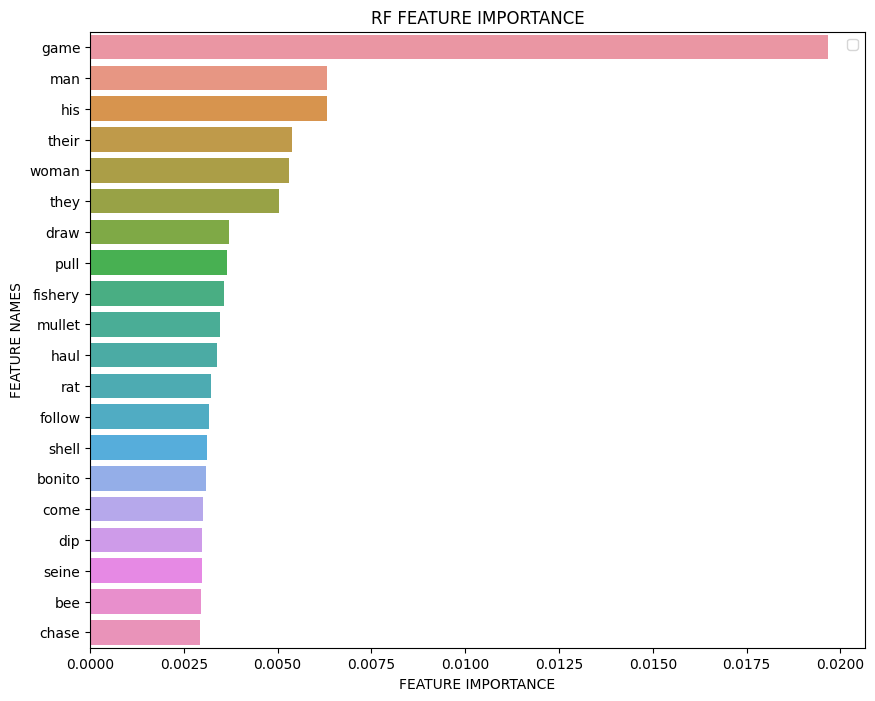

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'young', 'their', 'they', 'woman', 'game', 'new', 'man'}
Iteration 7
Exclude: {'continue', 'pool', 'bonito', 'shallow', 'fisherman', 'bird', 'pit', 'edible', 'cut', 'deep', 'pull', 'food', 'plant', 'month', 'variety', 'elephant', 'surface', 'people', 'ground', 'live', 'large', 'cast', 'coconut', 'shore', 'shark', 'rice', 'rest', 'area', 'fox', 'lake', 'bear', 'wild', 'basket', 'winter', 'fly', 'duck', 'help', 'haul', 'season', 'method', 'begin', 'neck', 'fruit', 'coast', 'arrow', 'scoop', 'hole', 'cover', 'brush', 'hawk', 'go', 'wound', 'run', 'trap', 'bait', 'end', 'buffalo', 'tree', 'family', 'dip', 'school', 'collect', 'little', 'remain', 'rat', 'caribou', 'camp', 'fish', 'weir', 'return', 'spear', 'rock', 'coral', 'water', 'activity', 'eel', 'current', 'come', 'call', 'far', 'period', 'seed', 'seine', 'river', 'fire', 'trail', 'dry', 'feather', 'wing', 'stick', 'trout', 'report', 'pigeon', 'net', 'deer', 'hook', 'life', 'form', 'root', 'beaver', 'early', 'stream', 

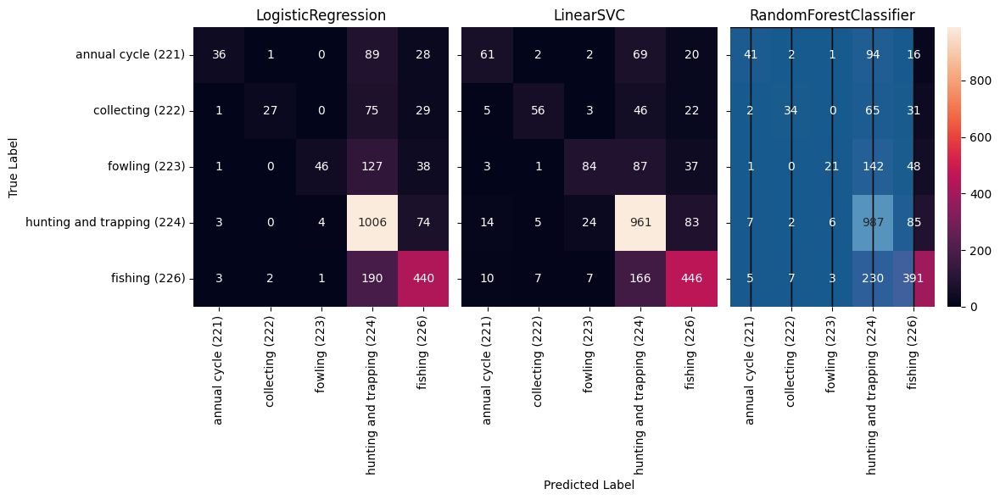

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6906798739306619
              precision    recall  f1-score   support

         221      0.786     0.214     0.337       154
         222      0.875     0.159     0.269       132
         223      0.875     0.198     0.323       212
         224      0.671     0.921     0.777      1087
         226      0.709     0.687     0.698       636

    accuracy                          0.691      2221
   macro avg      0.783     0.436     0.481      2221
weighted avg      0.722     0.691     0.650      2221



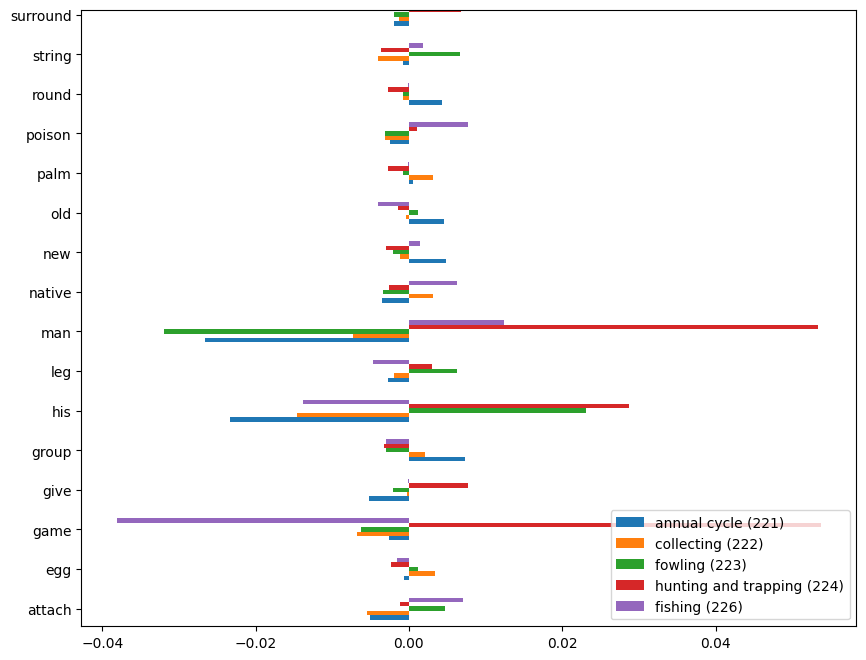

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7190454750112562
              precision    recall  f1-score   support

         221      0.697     0.403     0.510       154
         222      0.831     0.409     0.548       132
         223      0.731     0.373     0.494       212
         224      0.716     0.879     0.789      1087
         226      0.715     0.701     0.708       636

    accuracy                          0.719      2221
   macro avg      0.738     0.553     0.610      2221
weighted avg      0.723     0.719     0.704      2221



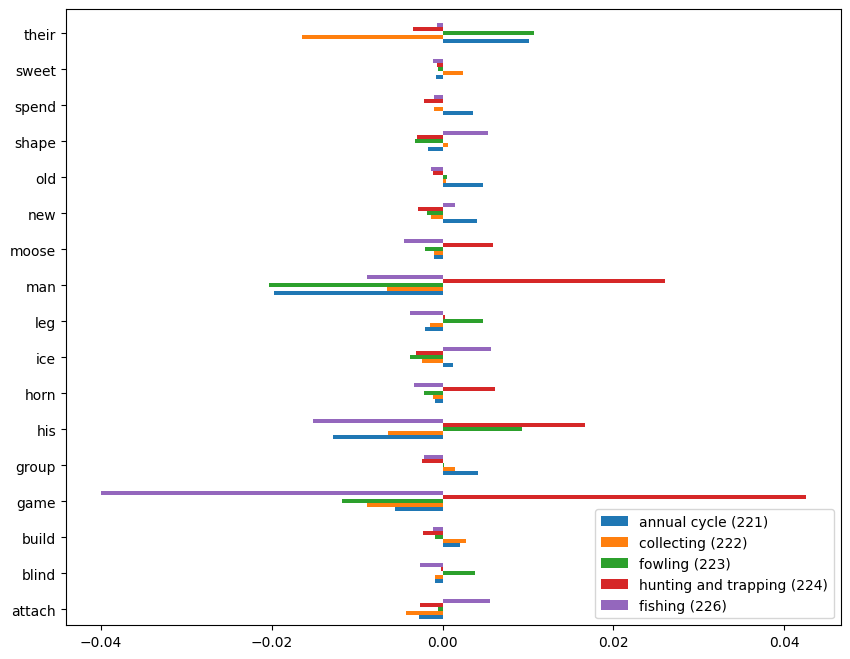

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6506078343088699
              precision    recall  f1-score   support

         221      0.635     0.260     0.369       154
         222      0.794     0.205     0.325       132
         223      0.794     0.127     0.220       212
         224      0.641     0.894     0.747      1087
         226      0.661     0.596     0.627       636

    accuracy                          0.651      2221
   macro avg      0.705     0.416     0.457      2221
weighted avg      0.670     0.651     0.611      2221



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


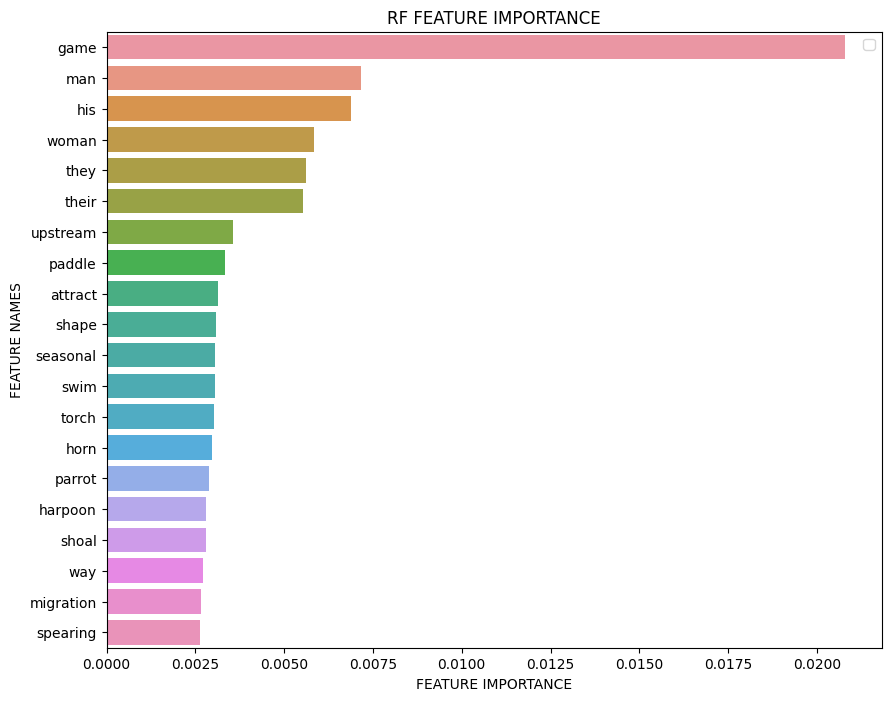

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'young', 'their', 'they', 'woman', 'game', 'new', 'old', 'man'}
Iteration 8
Exclude: {'native', 'continue', 'pool', 'bonito', 'shallow', 'fisherman', 'bird', 'pit', 'blind', 'edible', 'cut', 'deep', 'pull', 'palm', 'food', 'string', 'plant', 'month', 'variety', 'elephant', 'build', 'surface', 'people', 'ground', 'live', 'large', 'cast', 'coconut', 'give', 'shore', 'shark', 'rice', 'swim', 'rest', 'egg', 'area', 'fox', 'lake', 'bear', 'wild', 'basket', 'winter', 'fly', 'duck', 'help', 'haul', 'season', 'method', 'begin', 'neck', 'fruit', 'coast', 'arrow', 'scoop', 'hole', 'cover', 'brush', 'hawk', 'go', 'wound', 'run', 'trap', 'bait', 'leg', 'end', 'harpoon', 'buffalo', 'tree', 'family', 'dip', 'school', 'white', 'poison', 'collect', 'little', 'remain', 'rat', 'caribou', 'camp', 'fish', 'weir', 'return', 'attract', 'spear', 'rock', 'coral', 'water', 'activity', 'eel', 'sweet', 'current', 'come', 'call', 'far', 'period', 'seed', 'seine', 'river', 'fire', 'trail', 'dry', 

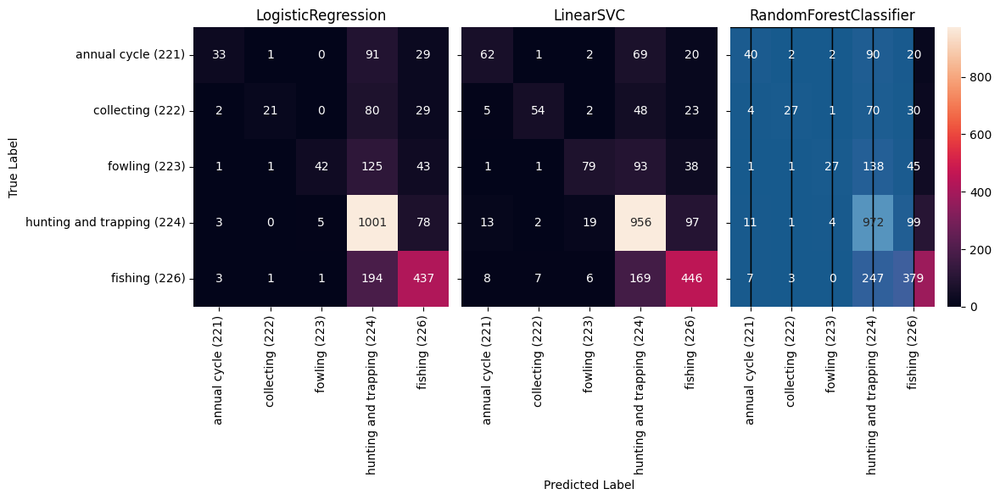

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6807744259342638
              precision    recall  f1-score   support

         221      0.780     0.208     0.328       154
         222      0.950     0.144     0.250       132
         223      0.868     0.156     0.264       212
         224      0.666     0.918     0.772      1087
         226      0.690     0.676     0.683       636

    accuracy                          0.681      2221
   macro avg      0.791     0.420     0.459      2221
weighted avg      0.717     0.681     0.636      2221



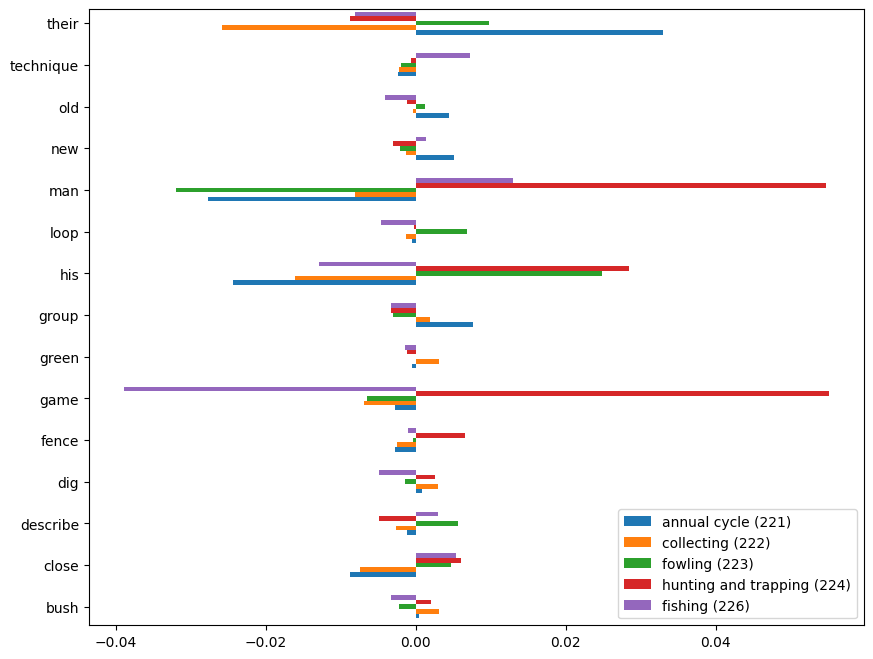

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7118415128320577
              precision    recall  f1-score   support

         221      0.718     0.396     0.510       154
         222      0.788     0.394     0.525       132
         223      0.750     0.396     0.519       212
         224      0.707     0.876     0.783      1087
         226      0.706     0.679     0.692       636

    accuracy                          0.712      2221
   macro avg      0.734     0.548     0.606      2221
weighted avg      0.716     0.712     0.697      2221



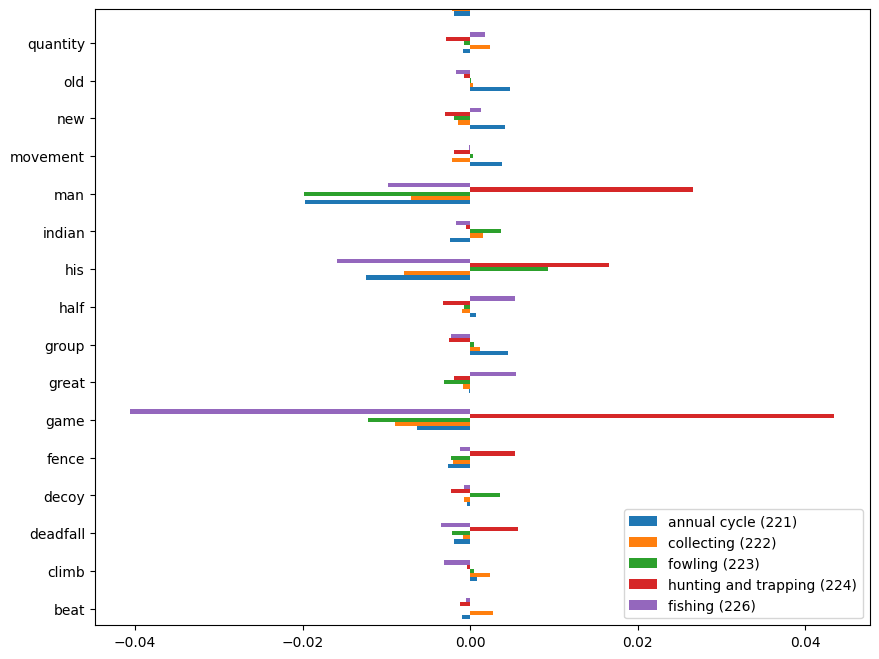

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6438541197658713
              precision    recall  f1-score   support

         221      0.682     0.195     0.303       154
         222      0.694     0.189     0.298       132
         223      0.705     0.146     0.242       212
         224      0.639     0.886     0.743      1087
         226      0.645     0.599     0.621       636

    accuracy                          0.644      2221
   macro avg      0.673     0.403     0.441      2221
weighted avg      0.653     0.644     0.603      2221



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


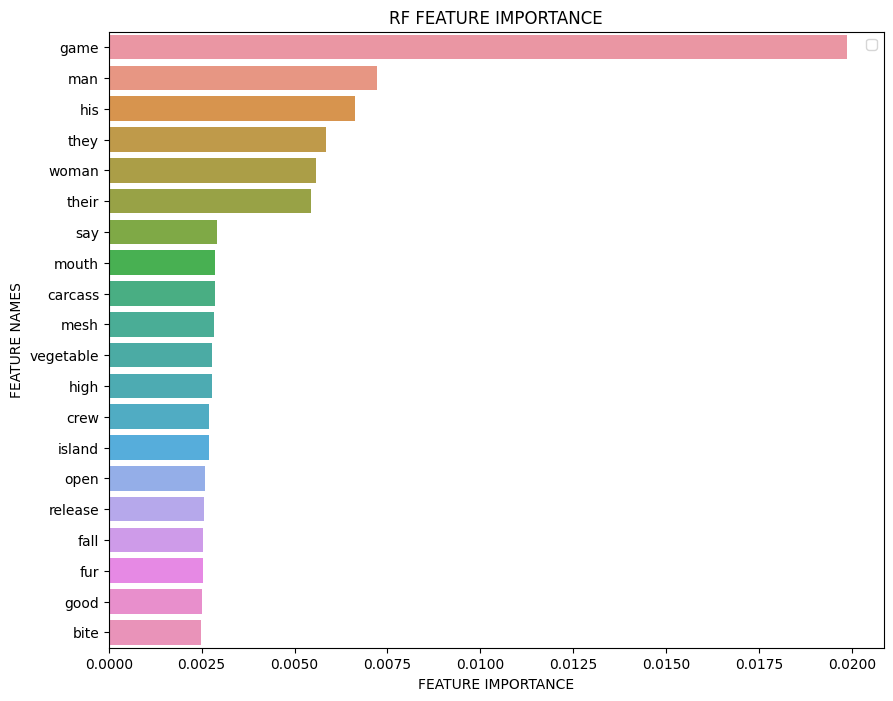

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'young', 'their', 'they', 'woman', 'game', 'crew', 'new', 'old', 'man'}
Iteration 9
Exclude: {'native', 'continue', 'pool', 'bonito', 'shallow', 'fisherman', 'bird', 'pit', 'dig', 'blind', 'edible', 'cut', 'deep', 'pull', 'palm', 'food', 'string', 'plant', 'month', 'variety', 'elephant', 'build', 'surface', 'people', 'ground', 'live', 'large', 'cast', 'coconut', 'give', 'shore', 'shark', 'rice', 'swim', 'rest', 'egg', 'area', 'fox', 'lake', 'bear', 'wild', 'basket', 'winter', 'fly', 'duck', 'help', 'haul', 'season', 'method', 'begin', 'neck', 'fruit', 'coast', 'arrow', 'loop', 'scoop', 'hole', 'cover', 'brush', 'hawk', 'go', 'high', 'island', 'wound', 'run', 'trap', 'fall', 'bait', 'leg', 'end', 'harpoon', 'buffalo', 'tree', 'family', 'dip', 'school', 'white', 'poison', 'collect', 'little', 'remain', 'rat', 'technique', 'caribou', 'type', 'camp', 'fish', 'weir', 'return', 'attract', 'spear', 'vegetable', 'rock', 'coral', 'water', 'activity', 'eel', 'sweet', 'describe',

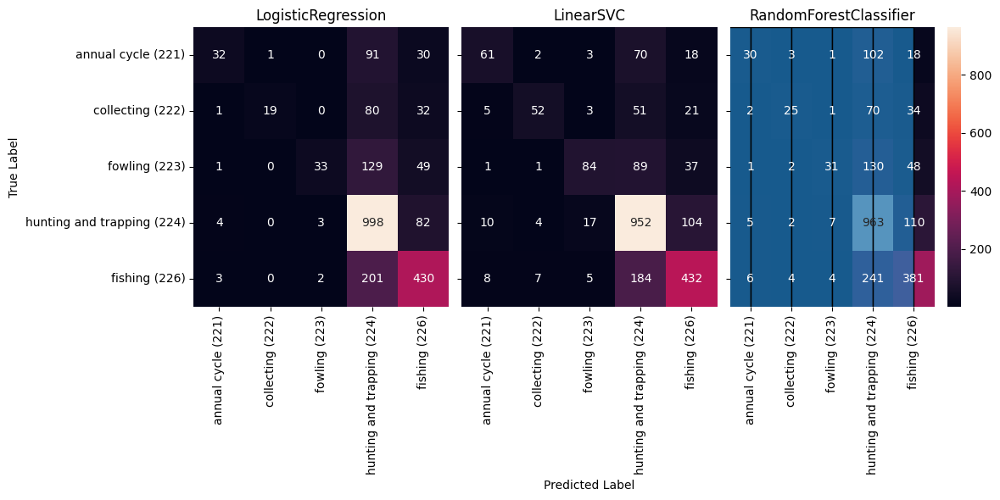

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6758217019360648
              precision    recall  f1-score   support

         221      0.786     0.214     0.337       154
         222      1.000     0.136     0.240       132
         223      0.857     0.142     0.243       212
         224      0.657     0.920     0.767      1087
         226      0.694     0.660     0.677       636

    accuracy                          0.676      2221
   macro avg      0.799     0.414     0.453      2221
weighted avg      0.716     0.676     0.630      2221



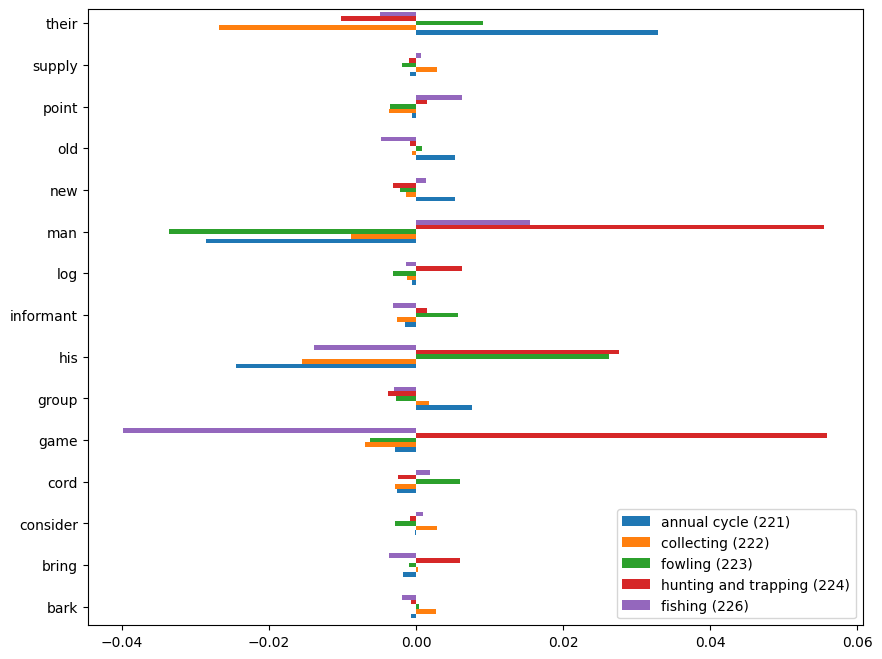

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.7077892841062584
              precision    recall  f1-score   support

         221      0.732     0.390     0.508       154
         222      0.766     0.371     0.500       132
         223      0.757     0.382     0.508       212
         224      0.703     0.883     0.783      1087
         226      0.701     0.664     0.682       636

    accuracy                          0.708      2221
   macro avg      0.732     0.538     0.596      2221
weighted avg      0.713     0.708     0.692      2221



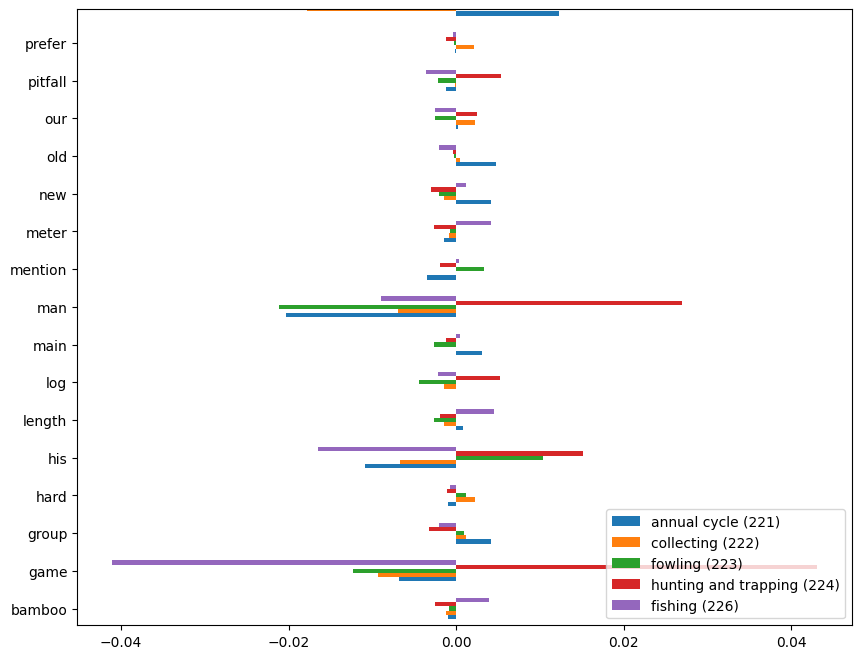

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.644754615038271
              precision    recall  f1-score   support

         221      0.685     0.240     0.356       154
         222      0.917     0.167     0.282       132
         223      0.769     0.142     0.239       212
         224      0.630     0.896     0.740      1087
         226      0.660     0.580     0.618       636

    accuracy                          0.645      2221
   macro avg      0.732     0.405     0.447      2221
weighted avg      0.673     0.645     0.603      2221



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


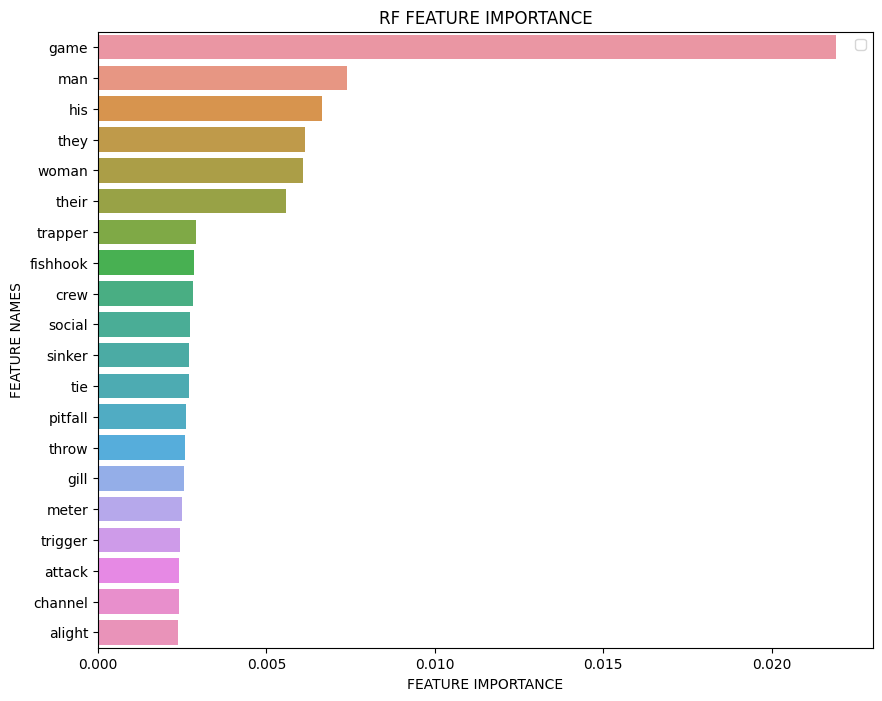

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'young', 'their', 'they', 'woman', 'game', 'main', 'crew', 'new', 'our', 'old', 'man'}
Iteration 10
Exclude: {'native', 'fishhook', 'continue', 'pool', 'bonito', 'shallow', 'fisherman', 'bird', 'pit', 'dig', 'blind', 'edible', 'cut', 'deep', 'pull', 'palm', 'food', 'string', 'plant', 'month', 'variety', 'consider', 'elephant', 'build', 'surface', 'people', 'ground', 'live', 'large', 'cast', 'coconut', 'give', 'shore', 'shark', 'rice', 'pitfall', 'swim', 'rest', 'egg', 'throw', 'area', 'fox', 'lake', 'bear', 'length', 'wild', 'basket', 'winter', 'fly', 'bamboo', 'duck', 'help', 'haul', 'season', 'method', 'begin', 'hard', 'neck', 'fruit', 'coast', 'arrow', 'trigger', 'loop', 'scoop', 'hole', 'cover', 'brush', 'hawk', 'go', 'high', 'wound', 'island', 'meter', 'run', 'trap', 'fall', 'bait', 'leg', 'end', 'harpoon', 'buffalo', 'tree', 'family', 'dip', 'alight', 'school', 'informant', 'white', 'poison', 'collect', 'little', 'remain', 'rat', 'technique', 'caribou', 'type', '

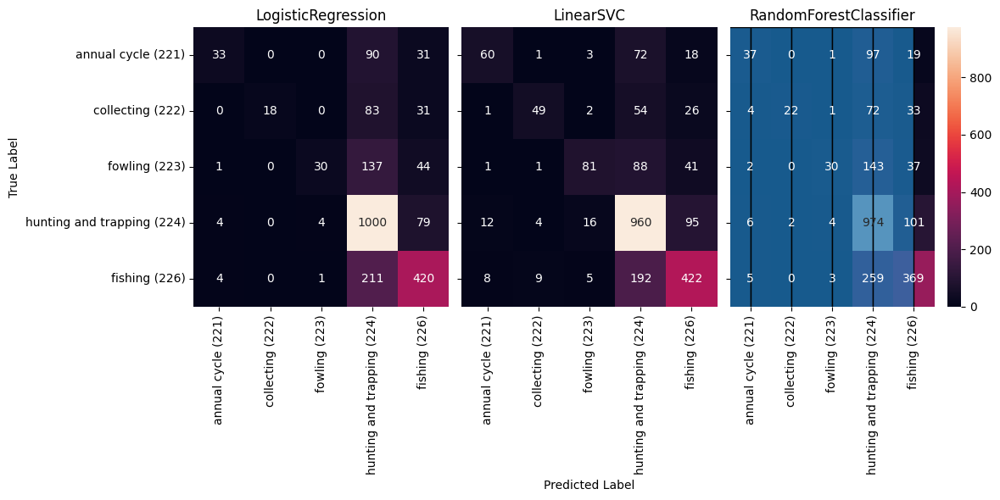

########## None LR 

########## Training LogisticRegression



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6668167492120667
              precision    recall  f1-score   support

         221      0.784     0.188     0.304       154
         222      1.000     0.121     0.216       132
         223      0.882     0.142     0.244       212
         224      0.652     0.919     0.763      1087
         226      0.677     0.640     0.658       636

    accuracy                          0.667      2221
   macro avg      0.799     0.402     0.437      2221
weighted avg      0.711     0.667     0.619      2221



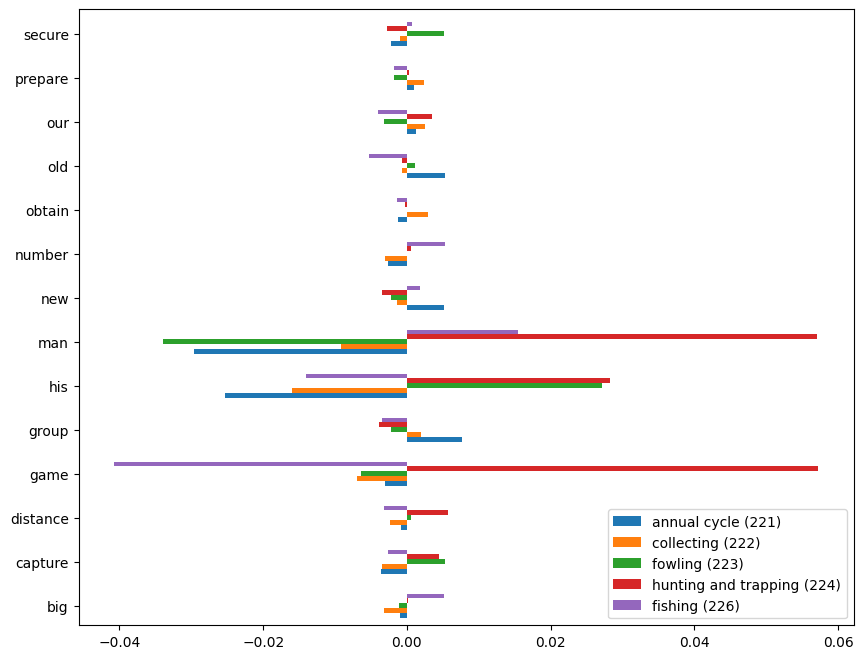

########## None SVM 

########## Training LinearSVC



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6969833408374606
              precision    recall  f1-score   support

         221      0.718     0.364     0.483       154
         222      0.722     0.394     0.510       132
         223      0.727     0.377     0.497       212
         224      0.695     0.875     0.774      1087
         226      0.691     0.643     0.666       636

    accuracy                          0.697      2221
   macro avg      0.711     0.531     0.586      2221
weighted avg      0.700     0.697     0.681      2221



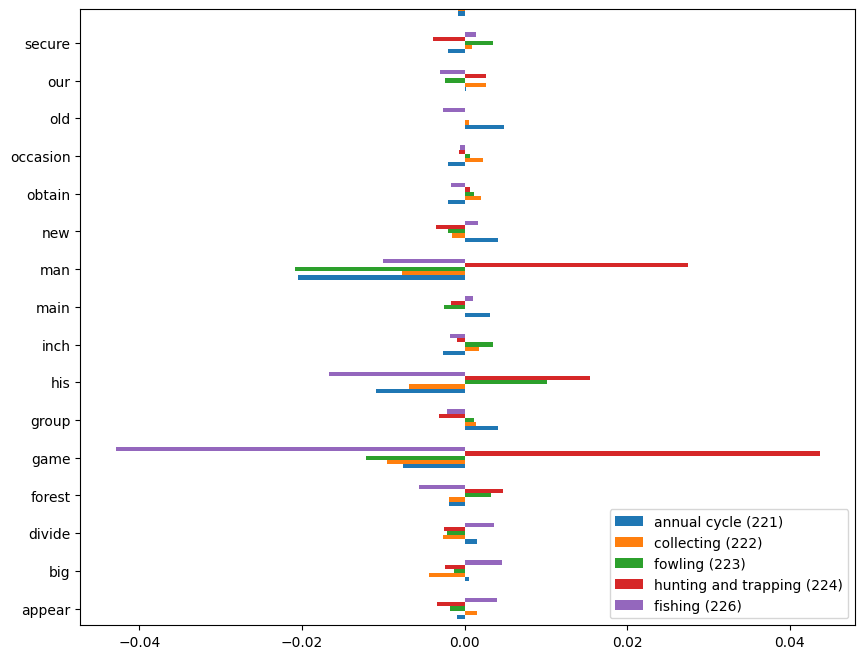

########## None RF 

########## Training RandomForestClassifier



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## 0.6334984241332733
              precision    recall  f1-score   support

         221      0.674     0.201     0.310       154
         222      0.769     0.152     0.253       132
         223      0.674     0.137     0.227       212
         224      0.627     0.891     0.736      1087
         226      0.639     0.564     0.599       636

    accuracy                          0.633      2221
   macro avg      0.677     0.389     0.425      2221
weighted avg      0.647     0.633     0.590      2221



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


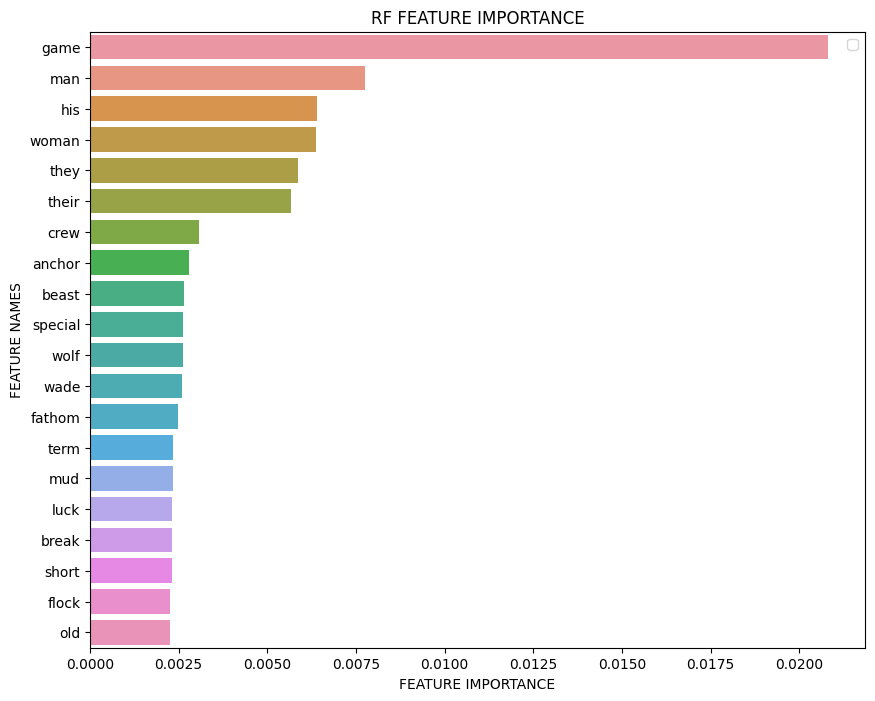

C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:55: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



{'his', 'group', 'young', 'their', 'they', 'woman', 'game', 'big', 'main', 'crew', 'new', 'our', 'old', 'man'}


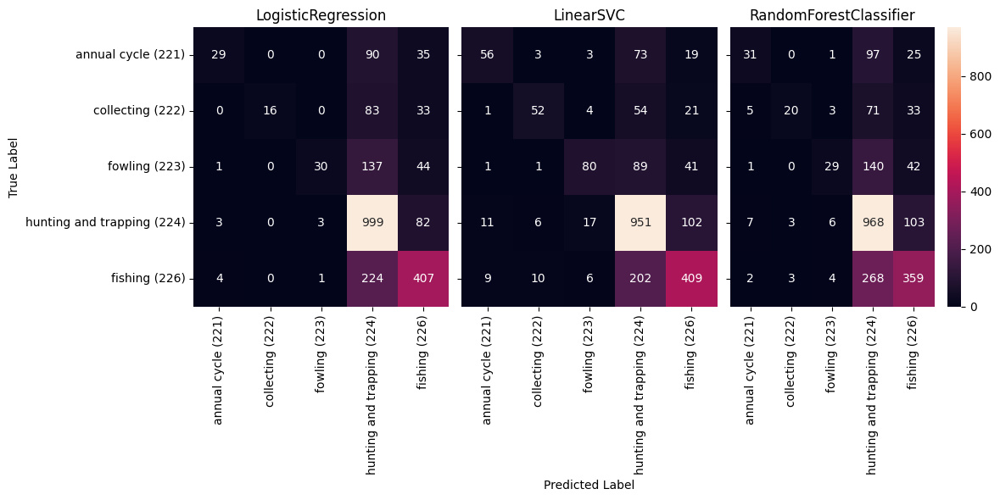

In [29]:
results = defaultdict(dict)
for b in [True, False]:
    print('\n\nBalanced:', b)
    curr_results = iterative_process(models=['LR', 'SVM', 'RF'], 
                            common_indicators=False,
                            chosen_categories=[221, 222, 223, 224, 226],
                            id='1 (221..226)',
                            df_performance=df_performance,
                            balanced=b,
                            verbose=True)
    results["balanced" if b else "imbalanced"] = curr_results
    save_results(curr_results, f'output/results/221..226_{"balanced" if b else "imbalanced"}.pkl')
    

In [30]:
for b in [True, False]:
    print('\n\nBalanced:', b, results[f'{i}'])
    plot_performance(results["balanced" if b else "imbalanced"], 
                     fig_path=f'output/metric/221..226_{"balanced" if b else "imbalanced"}.png',)



Balanced: True {}




Balanced: False {}


In [31]:
print(df_performance.to_latex())

\begin{tabular}{lrrr}
\toprule
{} &  precision &    recall &  f1-score \\
\midrule
0\_1 (224, 226)\_LR  &   0.946649 &  0.918209 &  0.929195 \\
0\_1 (224, 226)\_SVM &   0.945181 &  0.926417 &  0.934249 \\
0\_1 (224, 226)\_RF  &   0.942542 &  0.920816 &  0.929648 \\
1\_1 (224, 226)\_LR  &   0.899358 &  0.866671 &  0.878301 \\
1\_1 (224, 226)\_SVM &   0.883793 &  0.866146 &  0.873291 \\
1\_1 (224, 226)\_RF  &   0.883621 &  0.858228 &  0.867728 \\
2\_1 (224, 226)\_LR  &   0.886462 &  0.850958 &  0.863064 \\
2\_1 (224, 226)\_SVM &   0.869056 &  0.853220 &  0.859684 \\
2\_1 (224, 226)\_RF  &   0.859551 &  0.828500 &  0.839125 \\
3\_1 (224, 226)\_LR  &   0.876200 &  0.836653 &  0.849428 \\
3\_1 (224, 226)\_SVM &   0.854744 &  0.837328 &  0.844220 \\
3\_1 (224, 226)\_RF  &   0.824725 &  0.788370 &  0.799308 \\
4\_1 (224, 226)\_LR  &   0.856992 &  0.819464 &  0.831411 \\
4\_1 (224, 226)\_SVM &   0.842609 &  0.825520 &  0.832227 \\
4\_1 (224, 226)\_RF  &   0.829768 &  0.792522 &  0.803744 \\
5\

C:\Users\alhas\AppData\Local\Temp\ipykernel_3880\3683603614.py:1: FutureWarning:

In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.



Extract features and save the results.

In [ ]:
for file_name in ['224_226.pkl', '224_220.pkl', '226_220.pkl', '221..226_balanced.pkl', '221..226_imbalanced.pkl']:
    r = read_results(f'output/results/{file_name}')
    new_results = r
    for i in range(len(r.keys())):
        # extract features and make a new df, then save it.
        new_df = retrieve_rows_with_features(r[i]['df'],
                                            r[i]['indicators'],
                                            MODELS)
        new_results[i]['df'] = new_df
    save_results(new_results, f'output/results/{file_name}')
print('Done!')
